In [1]:
!pip install mrc

#!pip install mrc.core

In [2]:
pip install pyshark

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 2.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 25.3 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [3]:
# GPU Info
!nvidia-smi --query-gpu=name,memory.total,memory.used,memory.free,utilization.gpu --format=csv

# CPU Info
!lscpu | grep "Model name\|CPU(s)\|Thread(s) per core\|Core(s) per socket"

# RAM Info (in GB)
!free -h

# Disk Info (in GB)
!df -h /

name, memory.total [MiB], memory.used [MiB], memory.free [MiB], utilization.gpu [%]
Tesla T4, 15360 MiB, 1 MiB, 15095 MiB, 0 %
Tesla T4, 15360 MiB, 1 MiB, 15095 MiB, 0 %
CPU(s):                               4
On-line CPU(s) list:                  0-3
Model name:                           Intel(R) Xeon(R) CPU @ 2.00GHz
Thread(s) per core:                   2
Core(s) per socket:                   2
NUMA node0 CPU(s):                    0-3
               total        used        free      shared  buff/cache   available
Mem:            31Gi       852Mi        23Gi       2.0Mi       7.0Gi        30Gi
Swap:             0B          0B          0B
Filesystem      Size  Used Avail Use% Mounted on
overlay         7.9T  6.3T  1.7T  80% /


In [7]:
import torch
import torch_geometric
import numpy as np
import pandas as pd
import sklearn
import sys

print(f"Python: {sys.version}")
print(f"PyTorch: {torch.__version__}")
print(f"PyG (Torch Geometric): {torch_geometric.__version__}")
print(f"NumPy: {np.__version__}")
print(f"Pandas: {pd.__version__}")
print(f"Scikit-learn: {sklearn.__version__}")

# Check if CUDA is available and which GPU
print(f"CUDA Available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

Python: 3.10.12 (main, Nov  6 2024, 20:22:13) [GCC 11.4.0]
PyTorch: 2.5.1+cu121
PyG (Torch Geometric): 2.6.1
NumPy: 1.26.4
Pandas: 2.2.3
Scikit-learn: 1.2.2
CUDA Available: True
GPU: Tesla T4
GPU Memory: 15.83 GB


# Importing GNN Scripts

In [8]:
# Cell 1: Imports
!cp -r /kaggle/input/gnn-ids/gnn_ids .

import sys
import pandas as pd
import numpy as np
import torch

# Import from your custom modules
from gnn_ids.config import DATASET_CONFIGS, MODEL_PARAMS, reset_torch
from gnn_ids.data.preprocessing import *
from gnn_ids.data.graph_builder import construct_leakage_free_graph
from gnn_ids.models.architectures import MultiScaleGNNAutoencoder
from gnn_ids.models.training import train_gnn_autoencoder
from gnn_ids.evaluation.thresholds import select_threshold
from gnn_ids.evaluation.metrics import evaluate_model_comprehensive, propagate_node_scores_to_flows
from gnn_ids.evaluation.visualizations import *
from gnn_ids.utils.helpers import load_dataset_chunks, dynamic_feature_selection
from gnn_ids.utils.runtime_metrics import *

print("All modules imported successfully!")

All modules imported successfully!


# Main Runner V1 - GCN


EXPERIMENT: CICIDS-2018-v1
{'path': '/kaggle/input/2018-v1-cicids/88a47ba2ab64258e_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO'], 'edge_features': ['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO']
['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']
Loading dataset from: /kaggle/input/2018-v1-cicids/88a47ba2ab64258e_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded 

/kaggle/working/gnn_ids/evaluation/visualizations.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


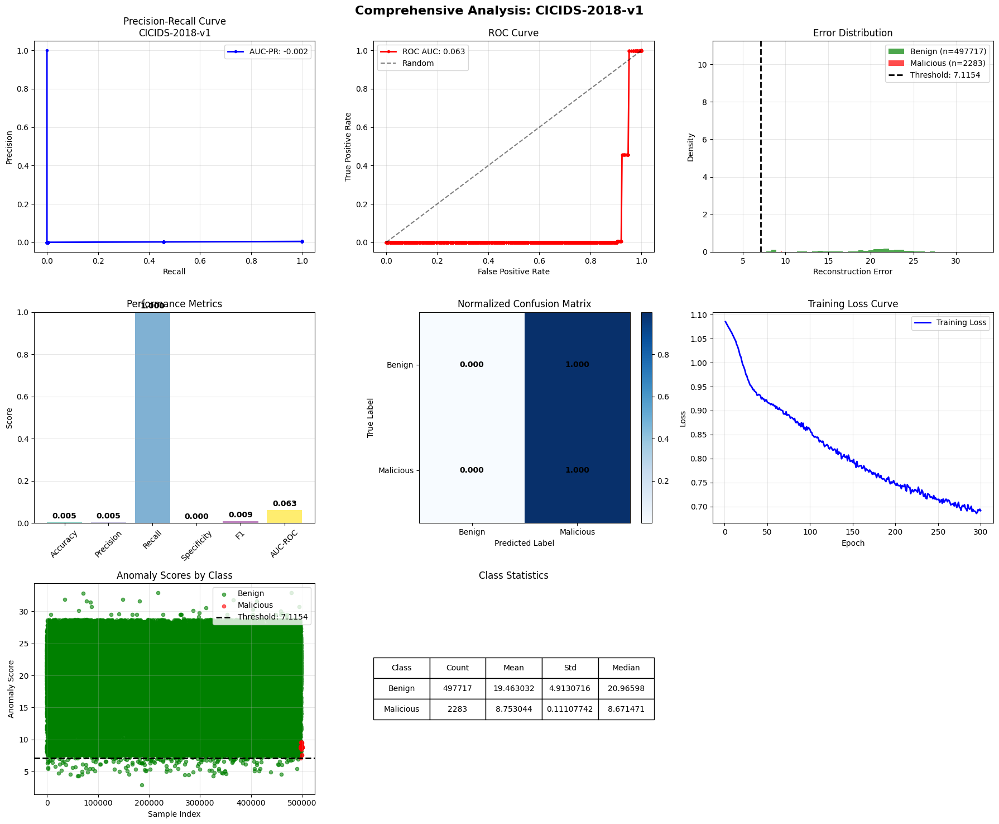

Successfully completed CICIDS-2018-v1

EXPERIMENT: UNSW-NB15-v1
{'path': '/kaggle/input/nf-unsw-nb15-netflowversion1/88695f0f620eb568_MOHANAD_A4706/data/NF-UNSW-NB15.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']
Loading dataset from: /kaggle/input/nf-unsw-nb15-netflowversion1/88695f0f620eb568_MOHANAD_A4706/data/NF-UNSW-NB15.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9651
   Balanced Accuracy: 0.9713
   Precision:        0.6638
   Recall (TPR):     0.9785
   FPR (FPR):     0.0359
   Specificity (TNR): 0.9641
   F1-Score:         0.7910
   AUC-ROC:          0.9843
   MCC:              10.0172

Classification Report:
              precision    recall  f1-score   support

      Benign       1.00      0.96      0.98    466240
   Malicious       0.66      0.98      0.79     33760

    accuracy                           0.97    500000
   macro avg       0.83      0.97      0.89    500000
weighted avg       0.98      0.97      0.97    500000


--- Runtime Metrics for UNSW-NB15-v1-GCN ---
Training Time: 2.41s
Inference Time: 13.60s
Throughput: 36777.61 samples/sec
Estimated GPU Cost: $0.0020
Selected threshold: 10.137043


/kaggle/working/gnn_ids/evaluation/visualizations.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


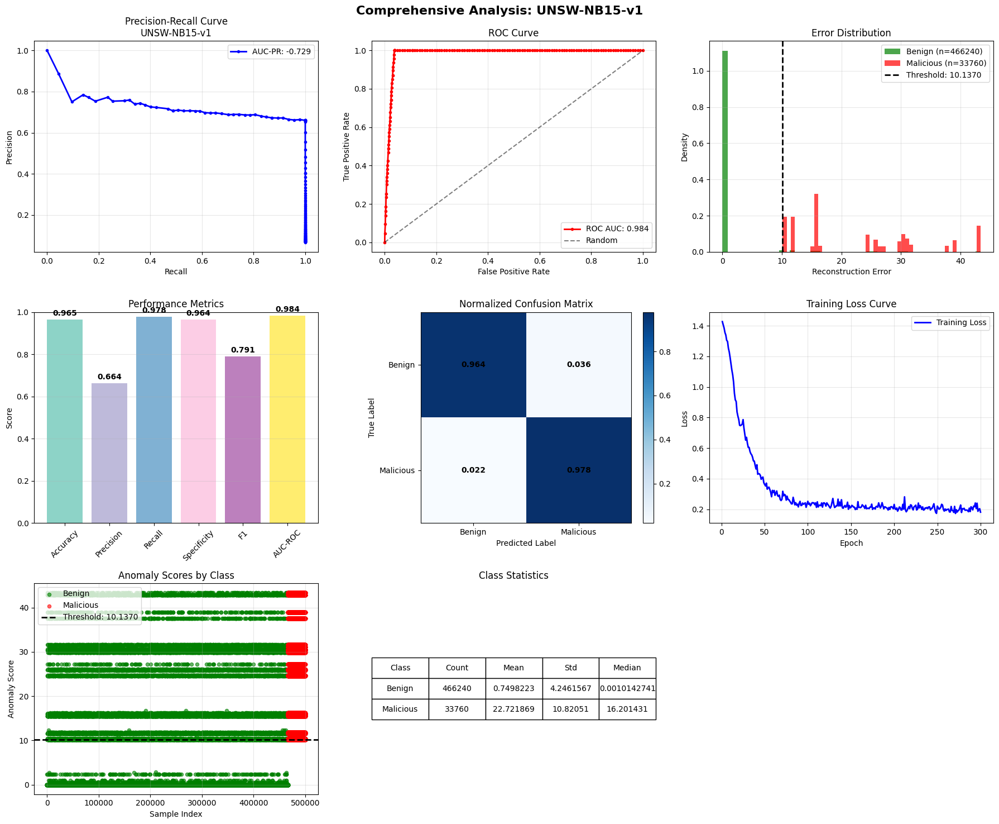

Successfully completed UNSW-NB15-v1

EXPERIMENT: ToN-IoT-v1
{'path': '/kaggle/input/nf-ton-iot/7ca78ae35fa4961a_MOHANAD_A4706/data/NF-ToN-IoT.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']
Loading dataset from: /kaggle/input/nf-ton-iot/7ca78ae35fa4961a_MOHANAD_A4706/data/NF-ToN-IoT.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 2

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


              precision    recall  f1-score   support

      Benign       0.94      0.05      0.09    166424
   Malicious       0.68      1.00      0.81    333576

    accuracy                           0.68    500000
   macro avg       0.81      0.52      0.45    500000
weighted avg       0.76      0.68      0.57    500000


--- Runtime Metrics for ToN-IoT-v1-GCN ---
Training Time: 2.07s
Inference Time: 106.72s
Throughput: 4685.26 samples/sec
Estimated GPU Cost: $0.0136
Selected threshold: 9.338205


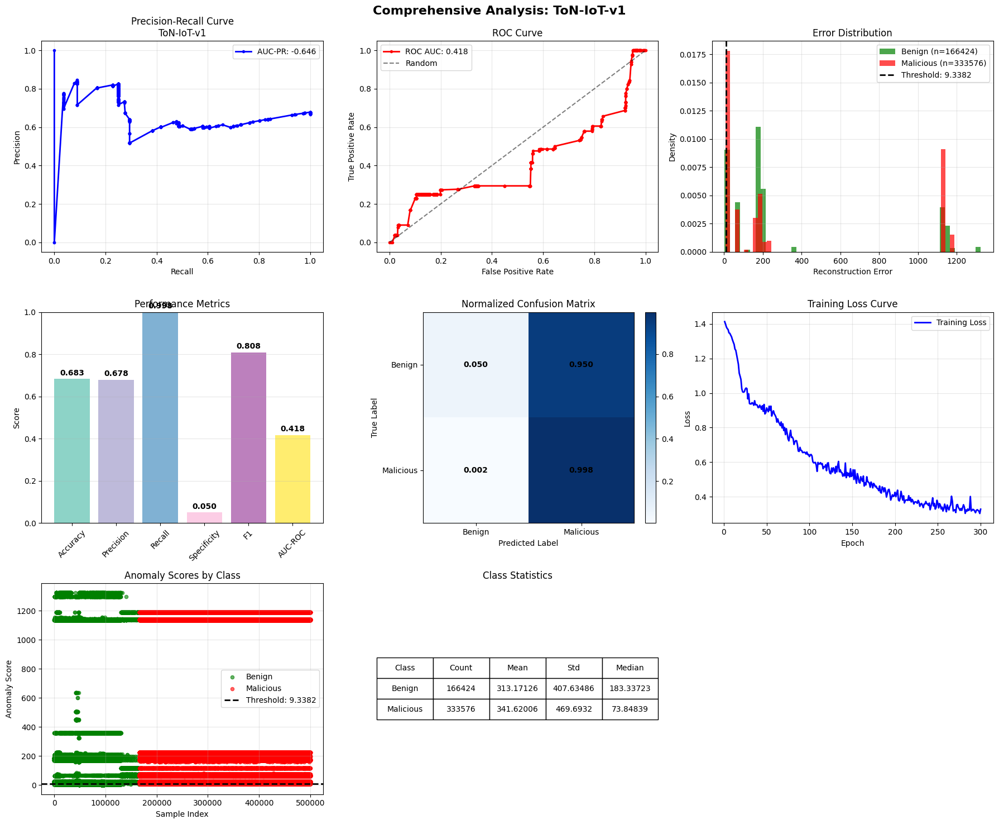

Successfully completed ToN-IoT-v1

EXPERIMENT: BoT-IoT-v1
{'path': '/kaggle/input/nf-bot-iot-kaggle1/de2c6f75dd50d933_MOHANAD_A4706/data/NF-BoT-IoT.csv', 'node_features': ['TCP_FLAGS', 'PROTOCOL', 'L4_SRC_PORT'], 'edge_features': ['IN_BYTES', 'IN_PKTS', 'OUT_PKTS']}
['TCP_FLAGS', 'PROTOCOL', 'L4_SRC_PORT']
['IN_BYTES', 'IN_PKTS', 'OUT_PKTS']
Loading dataset from: /kaggle/input/nf-bot-iot-kaggle1/de2c6f75dd50d933_MOHANAD_A4706/data/NF-BoT-IoT.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
  

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9514
   Balanced Accuracy: 0.9271
   Precision:        0.9778
   Recall (TPR):     0.9635
   FPR (FPR):     0.1092
   Specificity (TNR): 0.8908
   F1-Score:         0.9706
   AUC-ROC:          0.9497
   MCC:              30.5506

Classification Report:
              precision    recall  f1-score   support

      Benign       0.83      0.89      0.86     97228
   Malicious       0.98      0.96      0.97    486141

    accuracy                           0.95    583369
   macro avg       0.90      0.93      0.91    583369
weighted avg       0.95      0.95      0.95    583369


--- Runtime Metrics for BoT-IoT-v1-GCN ---
Training Time: 2.23s
Inference Time: 14.74s
Throughput: 39565.59 samples/sec
Estimated GPU Cost: $0.0021
Selected threshold: 10.274608


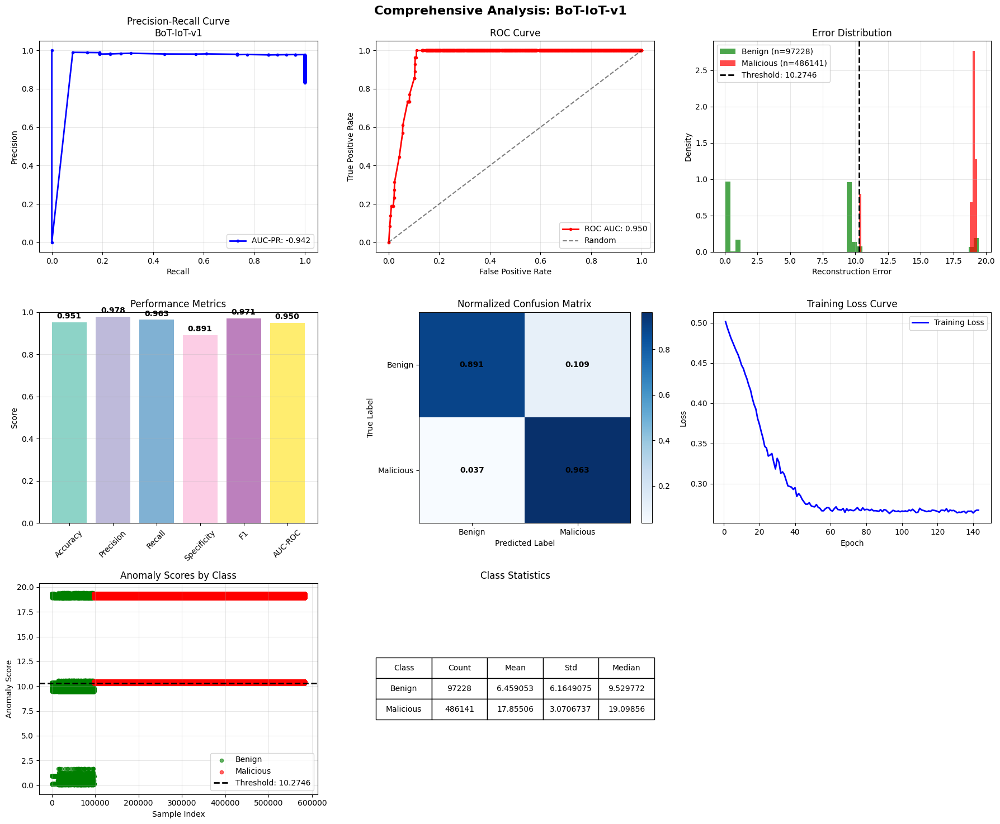

Successfully completed BoT-IoT-v1

FINAL EXPERIMENT SUMMARY
CICIDS-2018-v1:
  F1-Score: 0.0091
  Runtime: 231.6s
  Cost: $0.0289
  Throughput: 2173 samples/sec
UNSW-NB15-v1:
  F1-Score: 0.7910
  Runtime: 16.0s
  Cost: $0.0020
  Throughput: 36778 samples/sec
ToN-IoT-v1:
  F1-Score: 0.8076
  Runtime: 108.8s
  Cost: $0.0136
  Throughput: 4685 samples/sec
BoT-IoT-v1:
  F1-Score: 0.9706
  Runtime: 17.0s
  Cost: $0.0021
  Throughput: 39566 samples/sec

Total Runtime: 6.22 minutes
Total Cost: $0.0467
Average Cost per Dataset: $0.0117


In [13]:
# Cell 2: Main experiment loop
reset_torch()
all_results = {}
runtime_tracker = RuntimeTracker(gpu_cost_per_hour=0.45)  # Kaggle Tesla T4 rate

# Add this parameter at the top
USE_DYNAMIC_FEATURES = False  # Set to True to enable
DATASETS_TO_RUN = [
    "CICIDS-2018-v1",
    "UNSW-NB15-v1",
    "ToN-IoT-v1", 
    "BoT-IoT-v1"
]
for dataset_name in DATASETS_TO_RUN:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {dataset_name}")
    print(f"{'='*80}")
    config = DATASET_CONFIGS[dataset_name]
    print(config)
    print(config["node_features"])
    print(config["edge_features"])
    runtime_tracker.reset_timers()

    try:
        # Step 1: Load data FIRST (with all columns initially)
        df = load_dataset_chunks(
            file_path=config["path"],
            max_rows=1000000,
            required_features=None  # Load all columns initially for dynamic selection
        )
        
        # Step 2: Dynamic feature selection (if enabled) - AFTER loading data
        if USE_DYNAMIC_FEATURES:
            # Get all numeric columns except metadata
            excluded_cols = ['IPV4_SRC_ADDR', 'IPV4_DST_ADDR', 'Label', 'Attack']
            all_features = [col for col in df.columns if col not in excluded_cols]
            selected_features = dynamic_feature_selection(df, all_features, top_k=8)
            config["node_features"] = selected_features[:4]  # First 4 for nodes
            config["edge_features"] = selected_features[4:8]  # Next 4 for edges
            
            print(f"Dynamic features selected for {dataset_name}:")
            print(f"   Node features: {config['node_features']}")
            print(f"   Edge features: {config['edge_features']}")
        
        # Step 3: Filter and preprocess - AFTER feature selection
        df = filter_dataset_for_efficiency(df, dataset_name, max_rows=500000)
        df = apply_iot_imbalance_handling(df, dataset_name, 
                                         config["node_features"] + config["edge_features"])
        
        # Continue with remaining steps...    
    
        
        # Step 3: Create leakage-free split
        train_ips, test_ips, malicious_ips = create_leakage_free_split(df, test_size=0.15)
                # Extract training timing from scalers
        train_timing = extract_runtime_from_scalers(scalers)
        
        # *** RUNTIME METRICS: Start inference timer ***
        start_infer = time.time()
        # Step 4: Build training graph
        X_train, X_edges_train, edge_index_train, ip_to_idx, edge_to_flows = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"], 
            train_ips=train_ips,
            mode='train'
        )
        
        # Step 5: Train model
        model, training_losses, scalers = train_gnn_autoencoder(
            X_nodes=X_train,
            X_edges=X_edges_train,
            edge_index=edge_index_train,
            train_ips=train_ips,
            ip_to_idx=ip_to_idx,
            model_params=MODEL_PARAMS,
            gnn_type="GCN"
        )
        
        # Step 6: Evaluate on full graph
        X_full, X_edges_full, edge_index_full, ip_to_idx_full, _ = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"],
            train_ips=None,
            mode='full'
        )
        
        # Get node errors from model
        model.eval()
        with torch.no_grad():
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            X_full_scaled = scalers['node'].transform(X_full)
            X_full_tensor = torch.tensor(X_full_scaled, dtype=torch.float).to(device)
            edge_index_full = edge_index_full.to(device)
            
            x_hat, edge_hat, z = model(X_full_tensor, edge_index_full)
            node_errors = torch.mean((x_hat - X_full_tensor) ** 2, dim=1).cpu().numpy()
        
        # Step 7: Propagate to flow level
        flow_scores, flow_labels = propagate_node_scores_to_flows(
            df=df, 
            node_errors=node_errors, 
            ip_to_idx=ip_to_idx_full
        )
        
        # Step 8: Threshold selection and evaluation
        threshold = select_threshold(
            mode="f1",
            y_true=flow_labels,
            errors=flow_scores
        )
        
        y_pred = (flow_scores > threshold).astype(int)
        
        metrics = evaluate_model_comprehensive(
            y_true=flow_labels,
            y_pred=y_pred,
            y_scores=flow_scores,
            model_name=f"{dataset_name}-GCN"
        )
        # *** RUNTIME METRICS: End inference timer ***
        end_infer = time.time()
        
        # *** RUNTIME METRICS: Calculate comprehensive metrics ***
        if train_timing:
            # Count total samples processed
            total_samples = len(flow_scores) if 'flow_scores' in locals() else len(df)
            
            runtime_metrics = calculate_and_print_runtime_metrics(
                start_train=train_timing['start_train'],
                end_train=train_timing['end_train'],
                start_infer=start_infer,
                end_infer=end_infer,
                total_samples=total_samples,
                results={'threshold': threshold},
                model_name=f"{dataset_name}-GCN"
            )
            
            # Add runtime metrics to results
            metrics['runtime_metrics'] = runtime_metrics        
        # Step 9: Create visualizations
        create_comprehensive_plots(
            flow_labels=flow_labels,
            flow_scores=flow_scores,
            threshold=threshold,
            metrics=metrics,
            name=dataset_name,
            training_losses=training_losses
        )
        
        all_results[dataset_name] = metrics
        print(f"Successfully completed {dataset_name}")
        
    except Exception as e:
        print(f"Error processing {dataset_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        continue

# Print final summary at the end
print(f"\n{'='*80}")
print("FINAL EXPERIMENT SUMMARY")
print(f"{'='*80}")

total_cost = 0
total_time = 0

for dataset_name, results in all_results.items():
    if 'runtime_metrics' in results:
        runtime = results['runtime_metrics']
        total_cost += runtime['gpu_cost']
        total_time += runtime['train_duration'] + runtime['infer_duration']
        
        print(f"{dataset_name}:")
        print(f"  F1-Score: {results.get('f1', 'N/A'):.4f}")
        print(f"  Runtime: {runtime['train_duration'] + runtime['infer_duration']:.1f}s")
        print(f"  Cost: ${runtime['gpu_cost']:.4f}")
        print(f"  Throughput: {runtime.get('throughput', 0):.0f} samples/sec")

print(f"\nTotal Runtime: {total_time/60:.2f} minutes")
print(f"Total Cost: ${total_cost:.4f}")
print(f"Average Cost per Dataset: ${total_cost/len(all_results):.4f}" if all_results else "No results")

# Main Runner v2 - GCN


EXPERIMENT: CICIDS-2018-v2
{'path': '/kaggle/input/2018cic-v2/b3427ed8ad063a09_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO'], 'edge_features': ['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO']
['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']
Loading dataset from: /kaggle/input/2018cic-v2/b3427ed8ad063a09_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded ch

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9778
   Balanced Accuracy: 0.9195
   Precision:        0.9983
   Recall (TPR):     0.8392
   FPR (FPR):     0.0002
   Specificity (TNR): 0.9998
   F1-Score:         0.9118
   AUC-ROC:          0.9595
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.98      1.00      0.99    431596
   Malicious       1.00      0.84      0.91     68404

    accuracy                           0.98    500000
   macro avg       0.99      0.92      0.95    500000
weighted avg       0.98      0.98      0.98    500000


--- Runtime Metrics for CICIDS-2018-v2-GCN ---
Training Time: 3.01s
Inference Time: 264.99s
Throughput: 1886.84 samples/sec
Estimated GPU Cost: $0.0335
Selected threshold: 37.839218


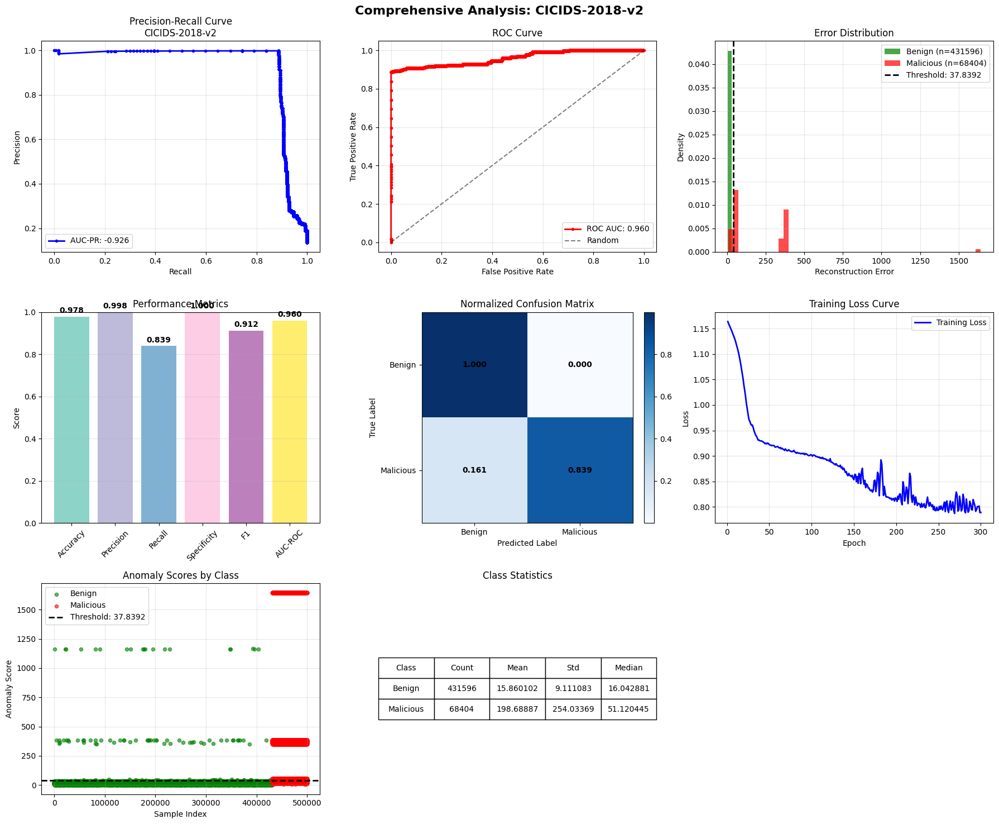

Successfully completed CICIDS-2018-v2

EXPERIMENT: UNSW-NB15-v2
{'path': '/kaggle/input/unsw-v2/fe6cb615d161452c_MOHANAD_A4706/data/NF-UNSW-NB15-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']
Loading dataset from: /kaggle/input/unsw-v2/fe6cb615d161452c_MOHANAD_A4706/data/NF-UNSW-NB15-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (tota

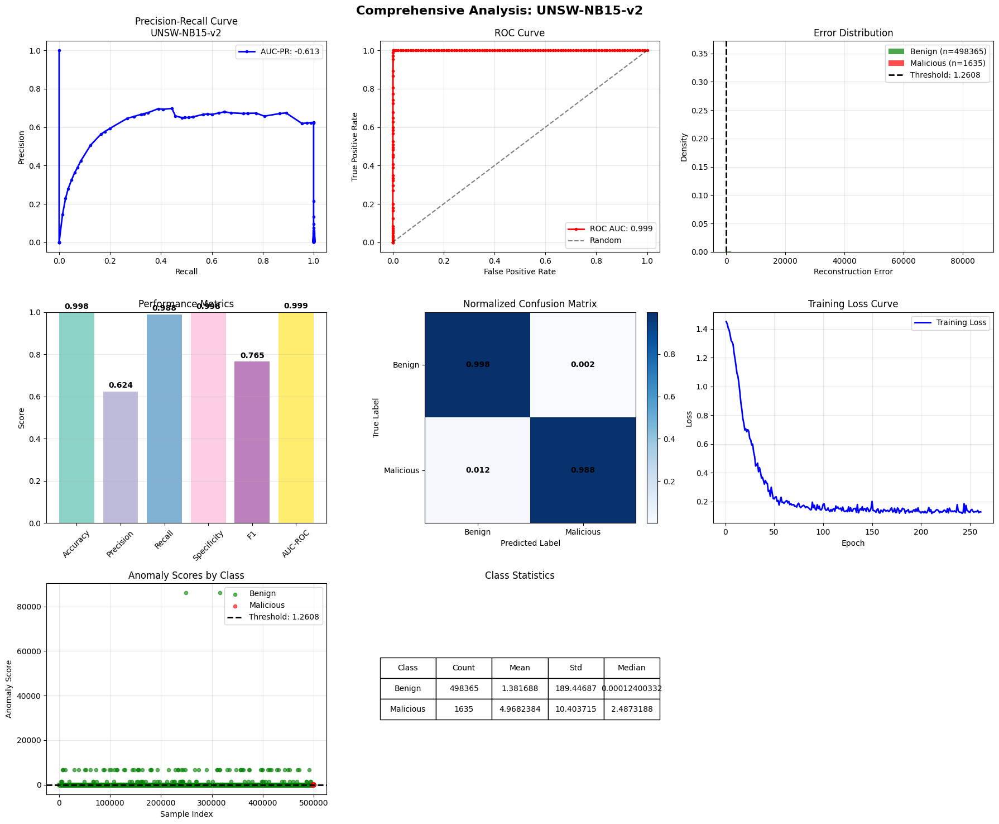

Successfully completed UNSW-NB15-v2

EXPERIMENT: ToN-IoT-v2
{'path': '/kaggle/input/ton-v2/9bafce9d380588c2_MOHANAD_A4706/data/NF-ToN-IoT-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']
Loading dataset from: /kaggle/input/ton-v2/9bafce9d380588c2_MOHANAD_A4706/data/NF-ToN-IoT-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.5134
   Balanced Accuracy: 0.5786
   Precision:        0.4444
   Recall (TPR):     0.8968
   FPR (FPR):     0.7395
   Specificity (TNR): 0.2605
   F1-Score:         0.5943
   AUC-ROC:          0.5437
   MCC:              15.0566

Classification Report:
              precision    recall  f1-score   support

      Benign       0.79      0.26      0.39    602567
   Malicious       0.44      0.90      0.59    397433

    accuracy                           0.51   1000000
   macro avg       0.62      0.58      0.49   1000000
weighted avg       0.65      0.51      0.47   1000000


--- Runtime Metrics for ToN-IoT-v2-GCN ---
Training Time: 1.77s
Inference Time: 57.25s
Throughput: 17466.04 samples/sec
Estimated GPU Cost: $0.0074
Selected threshold: 739.581665


/kaggle/working/gnn_ids/evaluation/visualizations.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


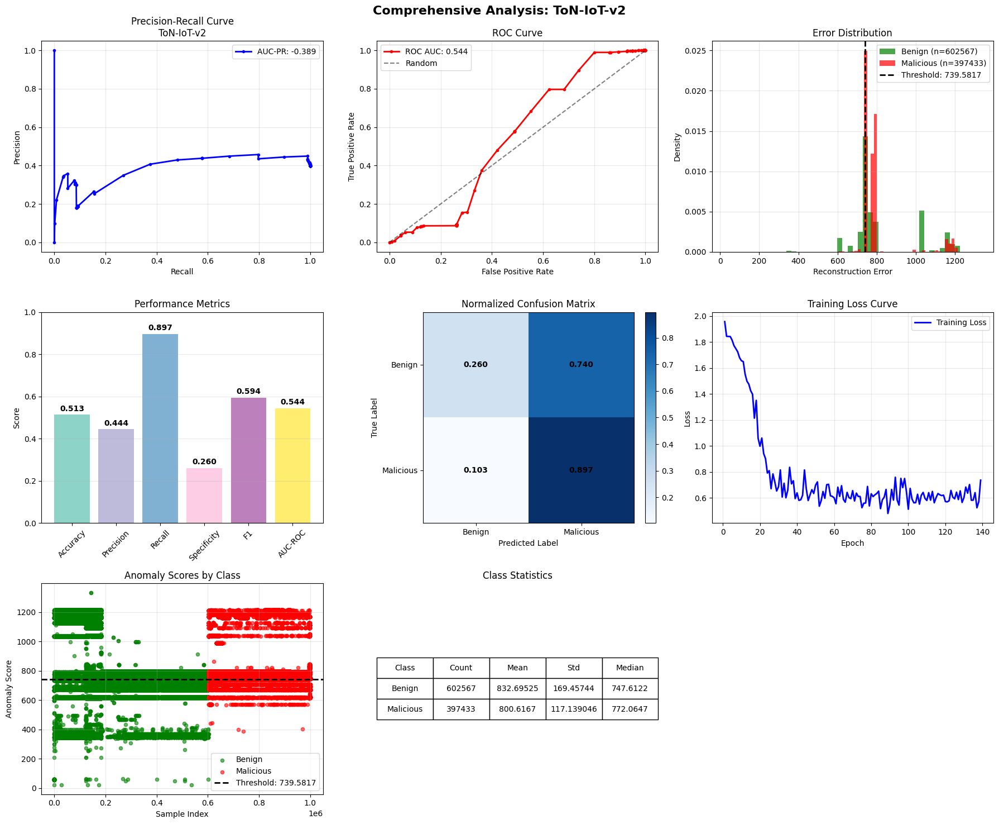

Successfully completed ToN-IoT-v2

EXPERIMENT: BoT-IoT-v2
{'path': '/kaggle/input/bot-v2/befb58edf3428167_MOHANAD_A4706/data/NF-BoT-IoT-v2.csv', 'node_features': ['PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['IN_BYTES', 'IN_PKTS']}
['PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['IN_BYTES', 'IN_PKTS']
Loading dataset from: /kaggle/input/bot-v2/befb58edf3428167_MOHANAD_A4706/data/NF-BoT-IoT-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.8956
   Balanced Accuracy: 0.8971
   Precision:        0.9780
   Recall (TPR):     0.8948
   FPR (FPR):     0.1007
   Specificity (TNR): 0.8993
   F1-Score:         0.9346
   AUC-ROC:          0.9062
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.63      0.90      0.74     99284
   Malicious       0.98      0.89      0.93    496420

    accuracy                           0.90    595704
   macro avg       0.80      0.90      0.84    595704
weighted avg       0.92      0.90      0.90    595704


--- Runtime Metrics for BoT-IoT-v2-GCN ---
Training Time: 1.00s
Inference Time: 8.42s
Throughput: 70778.05 samples/sec
Estimated GPU Cost: $0.0012
Selected threshold: 13.054426


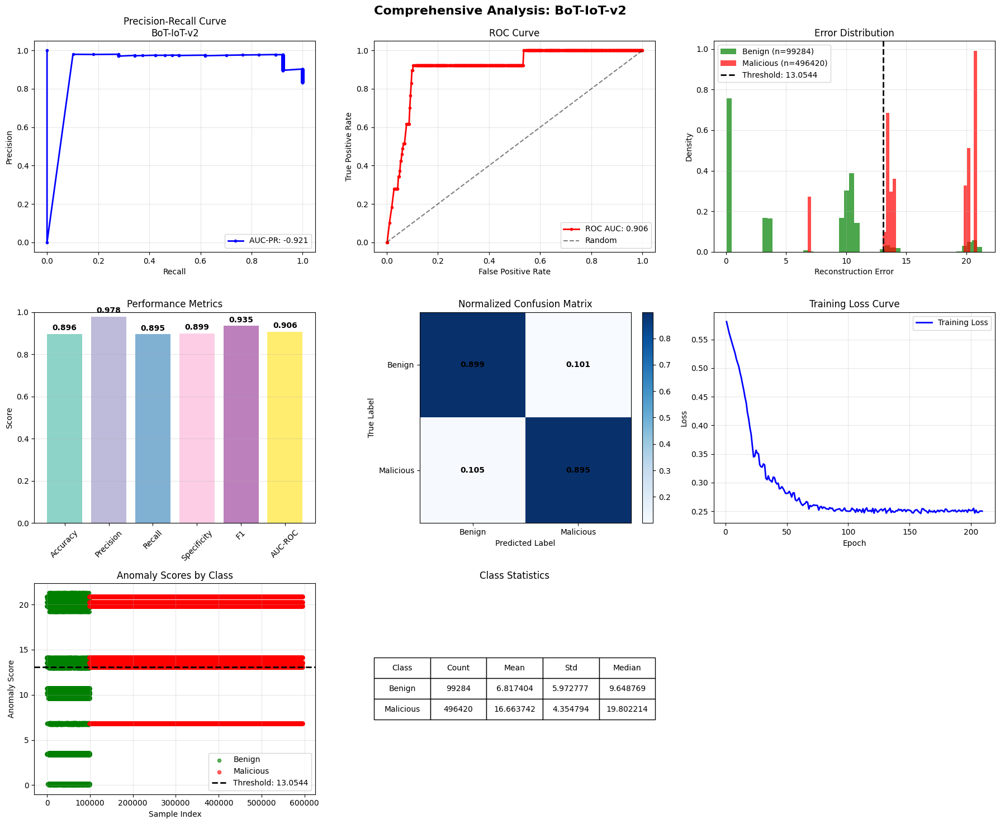

Successfully completed BoT-IoT-v2

FINAL EXPERIMENT SUMMARY
CICIDS-2018-v2:
  F1-Score: 0.9118
  Runtime: 268.0s
  Cost: $0.0335
  Throughput: 1887 samples/sec
UNSW-NB15-v2:
  F1-Score: 0.7648
  Runtime: 16.5s
  Cost: $0.0021
  Throughput: 36974 samples/sec
ToN-IoT-v2:
  F1-Score: 0.5943
  Runtime: 59.0s
  Cost: $0.0074
  Throughput: 17466 samples/sec
BoT-IoT-v2:
  F1-Score: 0.9346
  Runtime: 9.4s
  Cost: $0.0012
  Throughput: 70778 samples/sec

Total Runtime: 5.88 minutes
Total Cost: $0.0441
Average Cost per Dataset: $0.0110


In [11]:
# Cell 2: Main experiment loop
reset_torch()
all_results = {}
runtime_tracker = RuntimeTracker(gpu_cost_per_hour=0.45)  # Kaggle Tesla T4 rate

# Add this parameter at the top
USE_DYNAMIC_FEATURES = False  # Set to True to enable
DATASETS_TO_RUN = [
    "CICIDS-2018-v2",
    "UNSW-NB15-v2",
    "ToN-IoT-v2", 
    "BoT-IoT-v2"
]
for dataset_name in DATASETS_TO_RUN:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {dataset_name}")
    print(f"{'='*80}")
    config = DATASET_CONFIGS[dataset_name]
    print(config)
    print(config["node_features"])
    print(config["edge_features"])
    runtime_tracker.reset_timers()

    try:
        # Step 1: Load data FIRST (with all columns initially)
        df = load_dataset_chunks(
            file_path=config["path"],
            max_rows=1000000,
            required_features=None  # Load all columns initially for dynamic selection
        )
        
        # Step 2: Dynamic feature selection (if enabled) - AFTER loading data
        if USE_DYNAMIC_FEATURES:
            # Get all numeric columns except metadata
            excluded_cols = ['IPV4_SRC_ADDR', 'IPV4_DST_ADDR', 'Label', 'Attack']
            all_features = [col for col in df.columns if col not in excluded_cols]
            selected_features = dynamic_feature_selection(df, all_features, top_k=8)
            config["node_features"] = selected_features[:4]  # First 4 for nodes
            config["edge_features"] = selected_features[4:8]  # Next 4 for edges
            
            print(f"Dynamic features selected for {dataset_name}:")
            print(f"   Node features: {config['node_features']}")
            print(f"   Edge features: {config['edge_features']}")
        
        # Step 3: Filter and preprocess - AFTER feature selection
        df = filter_dataset_for_efficiency(df, dataset_name, max_rows=500000)
        df = apply_iot_imbalance_handling(df, dataset_name, 
                                         config["node_features"] + config["edge_features"])
        
        # Continue with remaining steps...    
    
        
        # Step 3: Create leakage-free split
        train_ips, test_ips, malicious_ips = create_leakage_free_split(df, test_size=0.15)
                # Extract training timing from scalers
        train_timing = extract_runtime_from_scalers(scalers)
        
        # *** RUNTIME METRICS: Start inference timer ***
        start_infer = time.time()
        # Step 4: Build training graph
        X_train, X_edges_train, edge_index_train, ip_to_idx, edge_to_flows = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"], 
            train_ips=train_ips,
            mode='train'
        )
        
        # Step 5: Train model
        model, training_losses, scalers = train_gnn_autoencoder(
            X_nodes=X_train,
            X_edges=X_edges_train,
            edge_index=edge_index_train,
            train_ips=train_ips,
            ip_to_idx=ip_to_idx,
            model_params=MODEL_PARAMS,
            gnn_type="GCN"
        )
        
        # Step 6: Evaluate on full graph
        X_full, X_edges_full, edge_index_full, ip_to_idx_full, _ = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"],
            train_ips=None,
            mode='full'
        )
        
        # Get node errors from model
        model.eval()
        with torch.no_grad():
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            X_full_scaled = scalers['node'].transform(X_full)
            X_full_tensor = torch.tensor(X_full_scaled, dtype=torch.float).to(device)
            edge_index_full = edge_index_full.to(device)
            
            x_hat, edge_hat, z = model(X_full_tensor, edge_index_full)
            node_errors = torch.mean((x_hat - X_full_tensor) ** 2, dim=1).cpu().numpy()
        
        # Step 7: Propagate to flow level
        flow_scores, flow_labels = propagate_node_scores_to_flows(
            df=df, 
            node_errors=node_errors, 
            ip_to_idx=ip_to_idx_full
        )
        
        # Step 8: Threshold selection and evaluation
        threshold = select_threshold(
            mode="f1",
            y_true=flow_labels,
            errors=flow_scores
        )
        
        y_pred = (flow_scores > threshold).astype(int)
        
        metrics = evaluate_model_comprehensive(
            y_true=flow_labels,
            y_pred=y_pred,
            y_scores=flow_scores,
            model_name=f"{dataset_name}-GCN"
        )
        # *** RUNTIME METRICS: End inference timer ***
        end_infer = time.time()
        
        # *** RUNTIME METRICS: Calculate comprehensive metrics ***
        if train_timing:
            # Count total samples processed
            total_samples = len(flow_scores) if 'flow_scores' in locals() else len(df)
            
            runtime_metrics = calculate_and_print_runtime_metrics(
                start_train=train_timing['start_train'],
                end_train=train_timing['end_train'],
                start_infer=start_infer,
                end_infer=end_infer,
                total_samples=total_samples,
                results={'threshold': threshold},
                model_name=f"{dataset_name}-GCN"
            )
            
            # Add runtime metrics to results
            metrics['runtime_metrics'] = runtime_metrics        
        # Step 9: Create visualizations
        create_comprehensive_plots(
            flow_labels=flow_labels,
            flow_scores=flow_scores,
            threshold=threshold,
            metrics=metrics,
            name=dataset_name,
            training_losses=training_losses
        )
        
        all_results[dataset_name] = metrics
        print(f"Successfully completed {dataset_name}")
        
    except Exception as e:
        print(f"Error processing {dataset_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        continue

# Print final summary at the end
print(f"\n{'='*80}")
print("FINAL EXPERIMENT SUMMARY")
print(f"{'='*80}")

total_cost = 0
total_time = 0

for dataset_name, results in all_results.items():
    if 'runtime_metrics' in results:
        runtime = results['runtime_metrics']
        total_cost += runtime['gpu_cost']
        total_time += runtime['train_duration'] + runtime['infer_duration']
        
        print(f"{dataset_name}:")
        print(f"  F1-Score: {results.get('f1', 'N/A'):.4f}")
        print(f"  Runtime: {runtime['train_duration'] + runtime['infer_duration']:.1f}s")
        print(f"  Cost: ${runtime['gpu_cost']:.4f}")
        print(f"  Throughput: {runtime.get('throughput', 0):.0f} samples/sec")

print(f"\nTotal Runtime: {total_time/60:.2f} minutes")
print(f"Total Cost: ${total_cost:.4f}")
print(f"Average Cost per Dataset: ${total_cost/len(all_results):.4f}" if all_results else "No results")

# Main Runner v3 - GCN


EXPERIMENT: CICIDS-2018-v3
{'path': '/kaggle/input/cic-nf-v3/f78acbaa2afe1595_NFV3DATA-A11964_A11964/data/NF-CICIDS2018-v3.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO'], 'edge_features': ['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO']
['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']
Loading dataset from: /kaggle/input/cic-nf-v3/f78acbaa2afe1595_NFV3DATA-A11964_A11964/data/NF-CICIDS2018-v3.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loa

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.0720
   Balanced Accuracy: 0.0553
   Precision:        0.0000
   Recall (TPR):     0.0000
   FPR (FPR):     0.8893
   Specificity (TNR): 0.1107
   F1-Score:         0.0000
   AUC-ROC:          0.1107
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.17      0.11      0.13    325117
   Malicious       0.00      0.00      0.00    174883

    accuracy                           0.07    500000
   macro avg       0.09      0.06      0.07    500000
weighted avg       0.11      0.07      0.09    500000


--- Runtime Metrics for CICIDS-2018-v3-GCN ---
Training Time: 1.41s
Inference Time: 249.63s
Throughput: 2002.95 samples/sec
Estimated GPU Cost: $0.0314
Selected threshold: 0.207766


/kaggle/working/gnn_ids/evaluation/visualizations.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


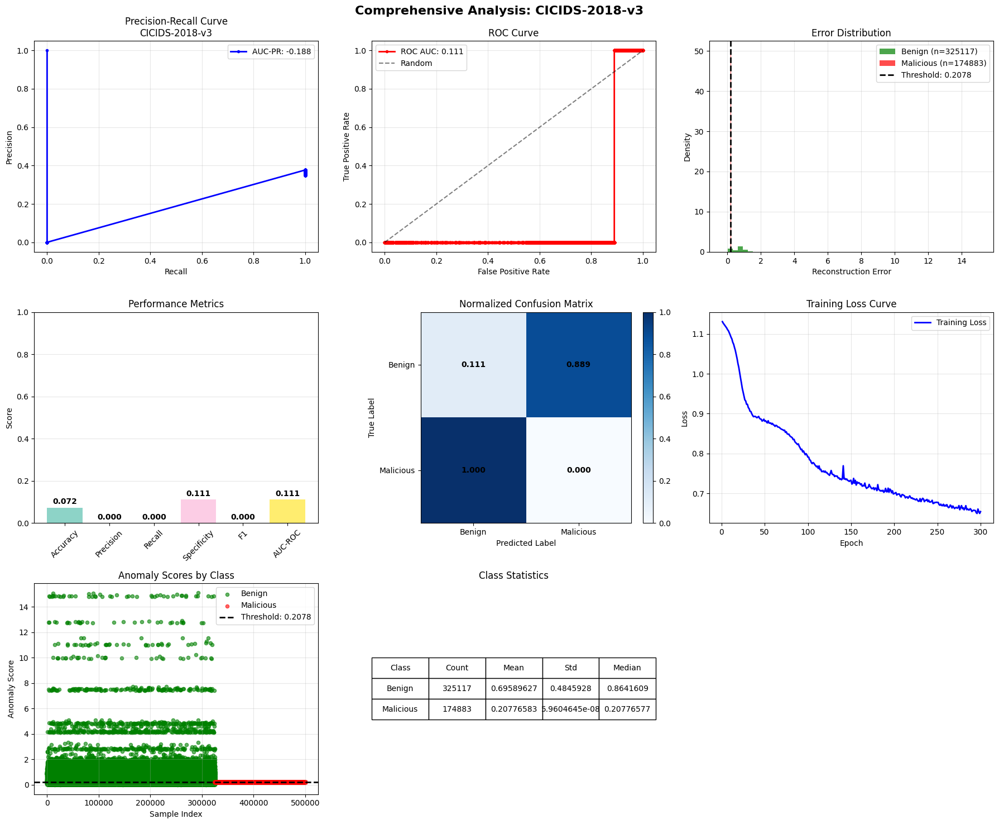

Successfully completed CICIDS-2018-v3

EXPERIMENT: UNSW-NB15-v3
{'path': '/kaggle/input/unsw-v3/f7546561558c07c5_NFV3DATA-A11964_A11964/data/NF-UNSW-NB15-v3.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']
Loading dataset from: /kaggle/input/unsw-v3/f7546561558c07c5_NFV3DATA-A11964_A11964/data/NF-UNSW-NB15-v3.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk:

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9785
   Balanced Accuracy: 0.9770
   Precision:        0.8190
   Recall (TPR):     0.9751
   FPR (FPR):     0.0212
   Specificity (TNR): 0.9788
   F1-Score:         0.8903
   AUC-ROC:          0.9915
   MCC:              9.6240

Classification Report:
              precision    recall  f1-score   support

      Benign       1.00      0.98      0.99    455312
   Malicious       0.82      0.98      0.89     44688

    accuracy                           0.98    500000
   macro avg       0.91      0.98      0.94    500000
weighted avg       0.98      0.98      0.98    500000


--- Runtime Metrics for UNSW-NB15-v3-GCN ---
Training Time: 2.39s
Inference Time: 14.26s
Throughput: 35070.03 samples/sec
Estimated GPU Cost: $0.0021
Selected threshold: 5.996701


/kaggle/working/gnn_ids/evaluation/visualizations.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


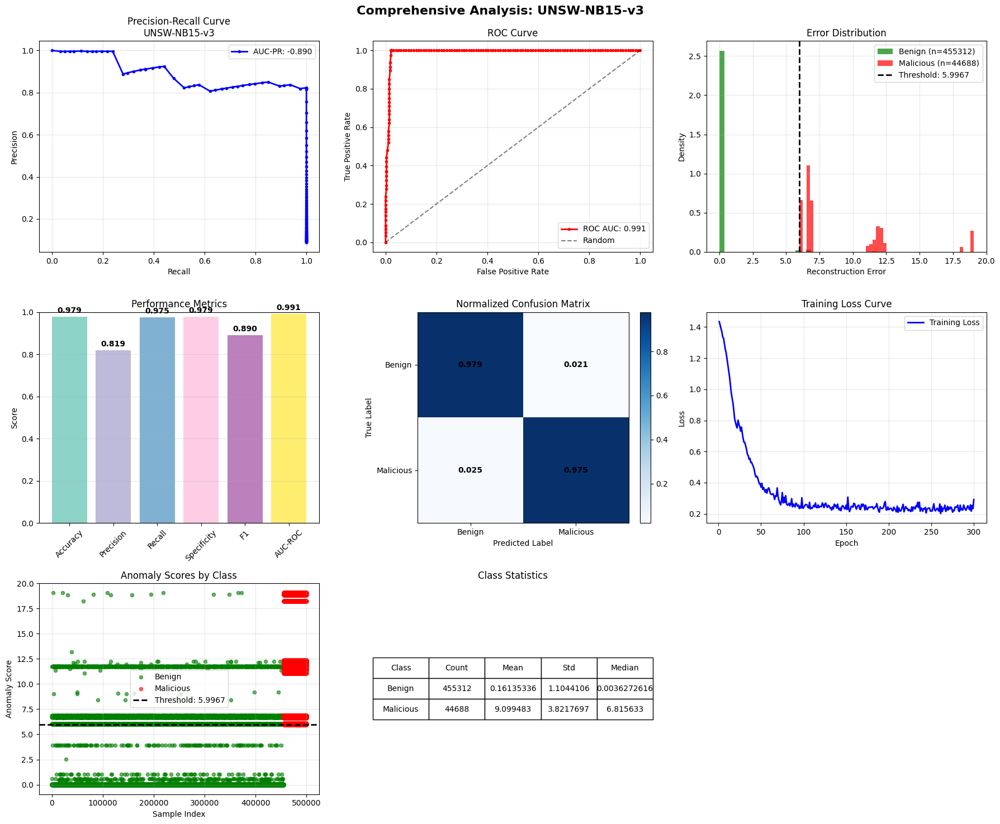

Successfully completed UNSW-NB15-v3

EXPERIMENT: ToN-IoT-v3
{'path': '/kaggle/input/ton-v3/02934b58528a226b_NFV3DATA-A11964_A11964/data/NF-ToN-IoT-v3.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']
Loading dataset from: /kaggle/input/ton-v3/02934b58528a226b_NFV3DATA-A11964_A11964/data/NF-ToN-IoT-v3.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,00

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.2514
   Balanced Accuracy: 0.5008
   Precision:        0.2500
   Recall (TPR):     0.9991
   FPR (FPR):     0.9975
   Specificity (TNR): 0.0025
   F1-Score:         0.3999
   AUC-ROC:          0.3817
   MCC:              0.0991

Classification Report:
              precision    recall  f1-score   support

      Benign       0.89      0.00      0.01    750311
   Malicious       0.25      1.00      0.40    249689

    accuracy                           0.25   1000000
   macro avg       0.57      0.50      0.20   1000000
weighted avg       0.73      0.25      0.10   1000000


--- Runtime Metrics for ToN-IoT-v3-GCN ---
Training Time: 2.02s
Inference Time: 55.34s
Throughput: 18069.37 samples/sec
Estimated GPU Cost: $0.0072
Selected threshold: 4813.974121


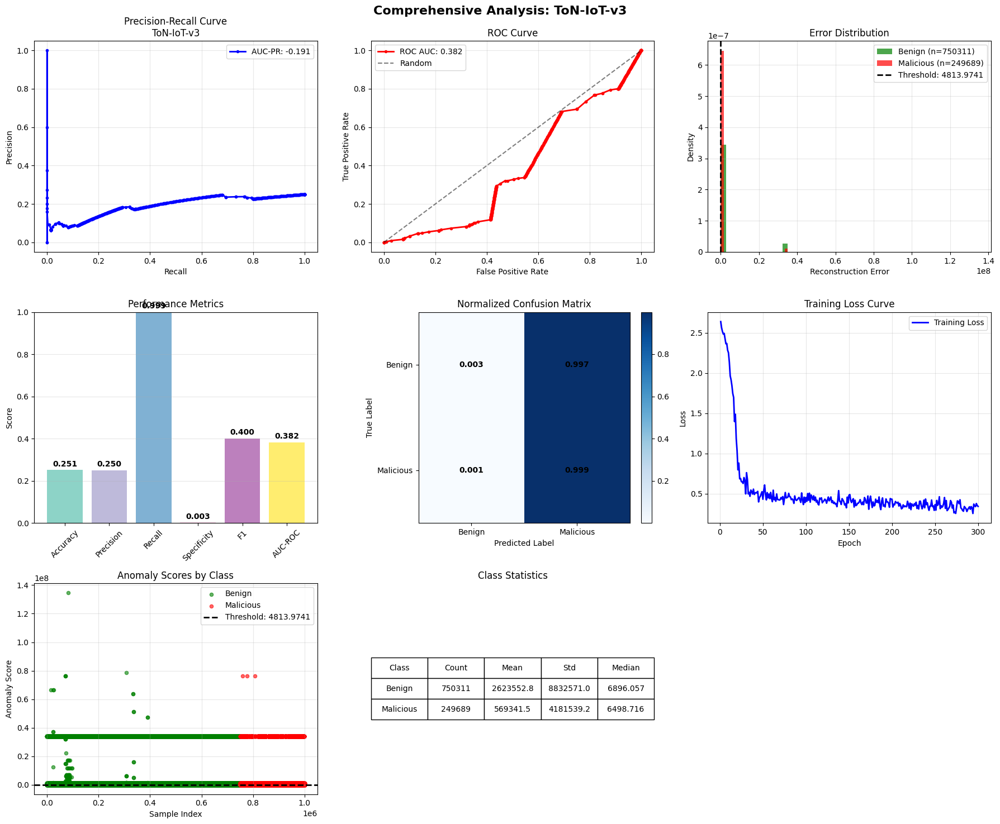

Successfully completed ToN-IoT-v3

EXPERIMENT: BoT-IoT-v3
{'path': '/kaggle/input/bot-v3/d509c9db7490cf92_NFV3DATA-A11964_A11964/data/NF-BoT-IoT-v3.csv', 'node_features': ['TCP_FLAGS', 'PROTOCOL', 'L4_SRC_PORT'], 'edge_features': ['IN_BYTES', 'IN_PKTS', 'OUT_PKTS']}
['TCP_FLAGS', 'PROTOCOL', 'L4_SRC_PORT']
['IN_BYTES', 'IN_PKTS', 'OUT_PKTS']
Loading dataset from: /kaggle/input/bot-v3/d509c9db7490cf92_NFV3DATA-A11964_A11964/data/NF-BoT-IoT-v3.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
  

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9139
   Balanced Accuracy: 0.8370
   Precision:        0.9731
   Recall (TPR):     0.9310
   FPR (FPR):     0.2571
   Specificity (TNR): 0.7429
   F1-Score:         0.9516
   AUC-ROC:          0.8585
   MCC:              6.8864

Classification Report:
              precision    recall  f1-score   support

      Benign       0.52      0.74      0.61     49963
   Malicious       0.97      0.93      0.95    499719

    accuracy                           0.91    549682
   macro avg       0.75      0.84      0.78    549682
weighted avg       0.93      0.91      0.92    549682


--- Runtime Metrics for BoT-IoT-v3-GCN ---
Training Time: 2.06s
Inference Time: 5.68s
Throughput: 96719.54 samples/sec
Estimated GPU Cost: $0.0010
Selected threshold: 0.458281


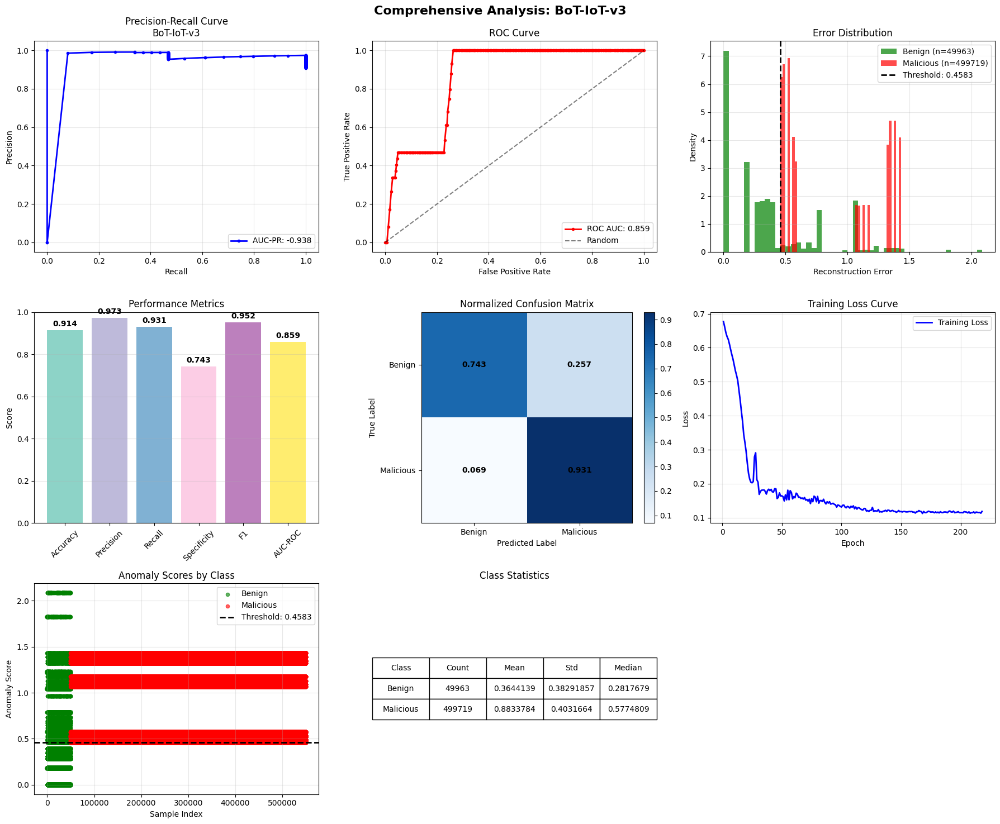

Successfully completed BoT-IoT-v3

FINAL EXPERIMENT SUMMARY
CICIDS-2018-v3:
  F1-Score: 0.0000
  Runtime: 251.0s
  Cost: $0.0314
  Throughput: 2003 samples/sec
UNSW-NB15-v3:
  F1-Score: 0.8903
  Runtime: 16.6s
  Cost: $0.0021
  Throughput: 35070 samples/sec
ToN-IoT-v3:
  F1-Score: 0.3999
  Runtime: 57.4s
  Cost: $0.0072
  Throughput: 18069 samples/sec
BoT-IoT-v3:
  F1-Score: 0.9516
  Runtime: 7.7s
  Cost: $0.0010
  Throughput: 96720 samples/sec

Total Runtime: 5.55 minutes
Total Cost: $0.0416
Average Cost per Dataset: $0.0104


In [12]:
# Cell 2: Main experiment loop
reset_torch()
all_results = {}
runtime_tracker = RuntimeTracker(gpu_cost_per_hour=0.45)  # Kaggle Tesla T4 rate

# Add this parameter at the top
USE_DYNAMIC_FEATURES = False  # Set to True to enable
DATASETS_TO_RUN = [
    "CICIDS-2018-v3",
    "UNSW-NB15-v3",
    "ToN-IoT-v3", 
    "BoT-IoT-v3"
]
for dataset_name in DATASETS_TO_RUN:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {dataset_name}")
    print(f"{'='*80}")
    config = DATASET_CONFIGS[dataset_name]
    print(config)
    print(config["node_features"])
    print(config["edge_features"])
    runtime_tracker.reset_timers()

    try:
        # Step 1: Load data FIRST (with all columns initially)
        df = load_dataset_chunks(
            file_path=config["path"],
            max_rows=1000000,
            required_features=None  # Load all columns initially for dynamic selection
        )
        
        # Step 2: Dynamic feature selection (if enabled) - AFTER loading data
        if USE_DYNAMIC_FEATURES:
            # Get all numeric columns except metadata
            excluded_cols = ['IPV4_SRC_ADDR', 'IPV4_DST_ADDR', 'Label', 'Attack']
            all_features = [col for col in df.columns if col not in excluded_cols]
            selected_features = dynamic_feature_selection(df, all_features, top_k=8)
            config["node_features"] = selected_features[:4]  # First 4 for nodes
            config["edge_features"] = selected_features[4:8]  # Next 4 for edges
            
            print(f"Dynamic features selected for {dataset_name}:")
            print(f"   Node features: {config['node_features']}")
            print(f"   Edge features: {config['edge_features']}")
        
        # Step 3: Filter and preprocess - AFTER feature selection
        df = filter_dataset_for_efficiency(df, dataset_name, max_rows=500000)
        df = apply_iot_imbalance_handling(df, dataset_name, 
                                         config["node_features"] + config["edge_features"])
        
        # Continue with remaining steps...    
    
        
        # Step 3: Create leakage-free split
        train_ips, test_ips, malicious_ips = create_leakage_free_split(df, test_size=0.15)
                # Extract training timing from scalers
        train_timing = extract_runtime_from_scalers(scalers)
        
        # *** RUNTIME METRICS: Start inference timer ***
        start_infer = time.time()
        # Step 4: Build training graph
        X_train, X_edges_train, edge_index_train, ip_to_idx, edge_to_flows = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"], 
            train_ips=train_ips,
            mode='train'
        )
        
        # Step 5: Train model
        model, training_losses, scalers = train_gnn_autoencoder(
            X_nodes=X_train,
            X_edges=X_edges_train,
            edge_index=edge_index_train,
            train_ips=train_ips,
            ip_to_idx=ip_to_idx,
            model_params=MODEL_PARAMS,
            gnn_type="GCN"
        )
        
        # Step 6: Evaluate on full graph
        X_full, X_edges_full, edge_index_full, ip_to_idx_full, _ = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"],
            train_ips=None,
            mode='full'
        )
        
        # Get node errors from model
        model.eval()
        with torch.no_grad():
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            X_full_scaled = scalers['node'].transform(X_full)
            X_full_tensor = torch.tensor(X_full_scaled, dtype=torch.float).to(device)
            edge_index_full = edge_index_full.to(device)
            
            x_hat, edge_hat, z = model(X_full_tensor, edge_index_full)
            node_errors = torch.mean((x_hat - X_full_tensor) ** 2, dim=1).cpu().numpy()
        
        # Step 7: Propagate to flow level
        flow_scores, flow_labels = propagate_node_scores_to_flows(
            df=df, 
            node_errors=node_errors, 
            ip_to_idx=ip_to_idx_full
        )
        
        # Step 8: Threshold selection and evaluation
        threshold = select_threshold(
            mode="f1",
            y_true=flow_labels,
            errors=flow_scores
        )
        
        y_pred = (flow_scores > threshold).astype(int)
        
        metrics = evaluate_model_comprehensive(
            y_true=flow_labels,
            y_pred=y_pred,
            y_scores=flow_scores,
            model_name=f"{dataset_name}-GCN"
        )
        # *** RUNTIME METRICS: End inference timer ***
        end_infer = time.time()
        
        # *** RUNTIME METRICS: Calculate comprehensive metrics ***
        if train_timing:
            # Count total samples processed
            total_samples = len(flow_scores) if 'flow_scores' in locals() else len(df)
            
            runtime_metrics = calculate_and_print_runtime_metrics(
                start_train=train_timing['start_train'],
                end_train=train_timing['end_train'],
                start_infer=start_infer,
                end_infer=end_infer,
                total_samples=total_samples,
                results={'threshold': threshold},
                model_name=f"{dataset_name}-GCN"
            )
            
            # Add runtime metrics to results
            metrics['runtime_metrics'] = runtime_metrics        
        # Step 9: Create visualizations
        create_comprehensive_plots(
            flow_labels=flow_labels,
            flow_scores=flow_scores,
            threshold=threshold,
            metrics=metrics,
            name=dataset_name,
            training_losses=training_losses
        )
        
        all_results[dataset_name] = metrics
        print(f"Successfully completed {dataset_name}")
        
    except Exception as e:
        print(f"Error processing {dataset_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        continue

# Print final summary at the end
print(f"\n{'='*80}")
print("FINAL EXPERIMENT SUMMARY")
print(f"{'='*80}")

total_cost = 0
total_time = 0

for dataset_name, results in all_results.items():
    if 'runtime_metrics' in results:
        runtime = results['runtime_metrics']
        total_cost += runtime['gpu_cost']
        total_time += runtime['train_duration'] + runtime['infer_duration']
        
        print(f"{dataset_name}:")
        print(f"  F1-Score: {results.get('f1', 'N/A'):.4f}")
        print(f"  Runtime: {runtime['train_duration'] + runtime['infer_duration']:.1f}s")
        print(f"  Cost: ${runtime['gpu_cost']:.4f}")
        print(f"  Throughput: {runtime.get('throughput', 0):.0f} samples/sec")

print(f"\nTotal Runtime: {total_time/60:.2f} minutes")
print(f"Total Cost: ${total_cost:.4f}")
print(f"Average Cost per Dataset: ${total_cost/len(all_results):.4f}" if all_results else "No results")

# Main Runner v2 - SAGE


EXPERIMENT: CICIDS-2018-v2
{'path': '/kaggle/input/2018cic-v2/b3427ed8ad063a09_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO'], 'edge_features': ['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO']
['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']
Loading dataset from: /kaggle/input/2018cic-v2/b3427ed8ad063a09_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded ch

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9512
   Balanced Accuracy: 0.8586
   Precision:        0.8927
   Recall (TPR):     0.7311
   FPR (FPR):     0.0139
   Specificity (TNR): 0.9861
   F1-Score:         0.8039
   AUC-ROC:          0.8673
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.96      0.99      0.97    431596
   Malicious       0.89      0.73      0.80     68404

    accuracy                           0.95    500000
   macro avg       0.93      0.86      0.89    500000
weighted avg       0.95      0.95      0.95    500000


--- Runtime Metrics for CICIDS-2018-v2-SAGE ---
Training Time: 1.01s
Inference Time: 265.45s
Throughput: 1883.62 samples/sec
Estimated GPU Cost: $0.0333
Selected threshold: 4.213027


/kaggle/working/gnn_ids/evaluation/visualizations.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


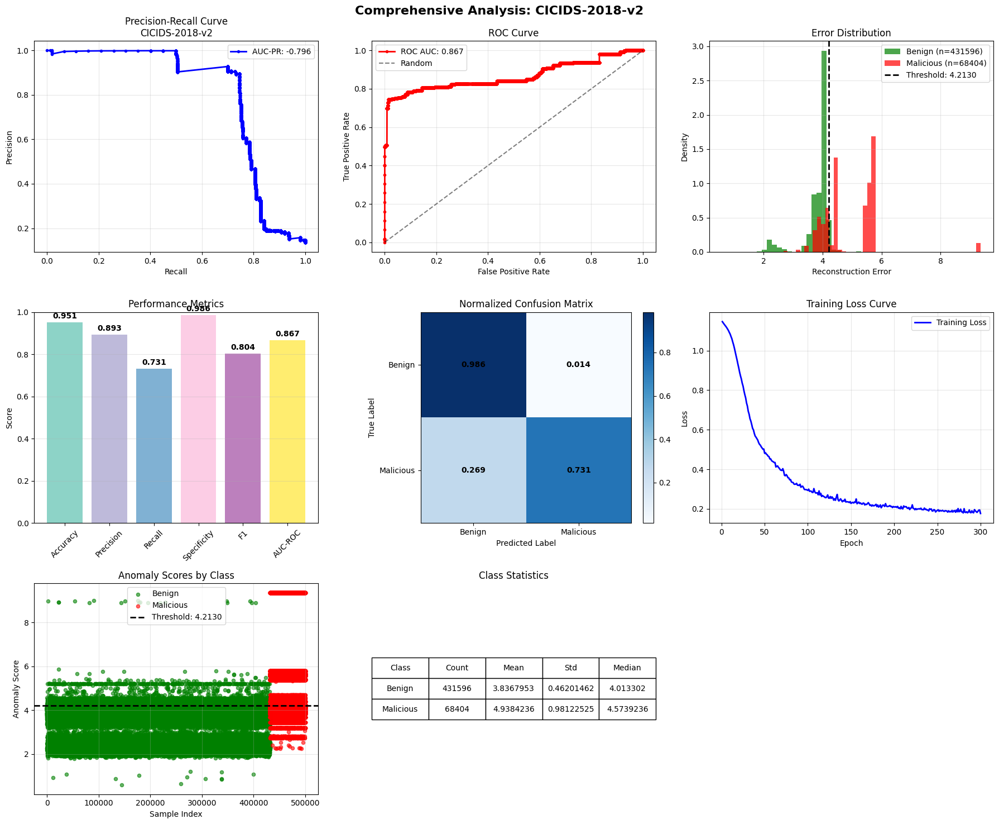

Successfully completed CICIDS-2018-v2

EXPERIMENT: UNSW-NB15-v2
{'path': '/kaggle/input/unsw-v2/fe6cb615d161452c_MOHANAD_A4706/data/NF-UNSW-NB15-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']
Loading dataset from: /kaggle/input/unsw-v2/fe6cb615d161452c_MOHANAD_A4706/data/NF-UNSW-NB15-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (tota

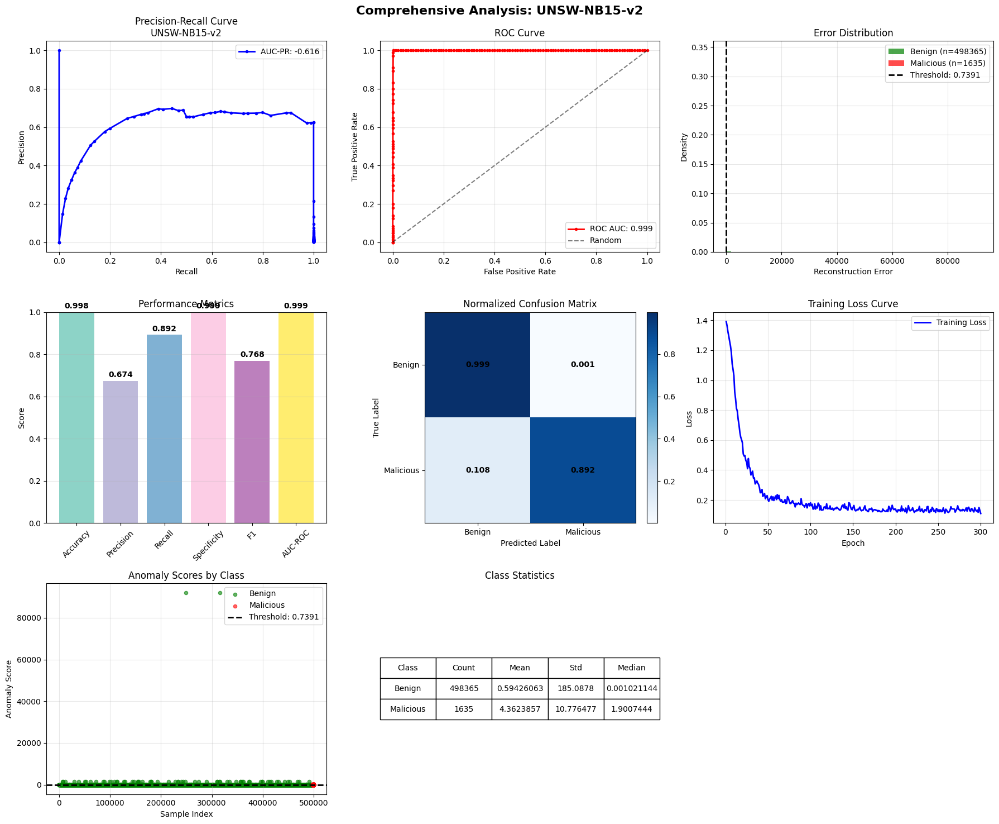

Successfully completed UNSW-NB15-v2

EXPERIMENT: ToN-IoT-v2
{'path': '/kaggle/input/ton-v2/9bafce9d380588c2_MOHANAD_A4706/data/NF-ToN-IoT-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']
Loading dataset from: /kaggle/input/ton-v2/9bafce9d380588c2_MOHANAD_A4706/data/NF-ToN-IoT-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.4867
   Balanced Accuracy: 0.5725
   Precision:        0.4359
   Recall (TPR):     0.9909
   FPR (FPR):     0.8459
   Specificity (TNR): 0.1541
   F1-Score:         0.6054
   AUC-ROC:          0.6530
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.96      0.15      0.27    602567
   Malicious       0.44      0.99      0.61    397433

    accuracy                           0.49   1000000
   macro avg       0.70      0.57      0.44   1000000
weighted avg       0.75      0.49      0.40   1000000


--- Runtime Metrics for ToN-IoT-v2-SAGE ---
Training Time: 1.81s
Inference Time: 58.41s
Throughput: 17119.31 samples/sec
Estimated GPU Cost: $0.0075
Selected threshold: 362.676361


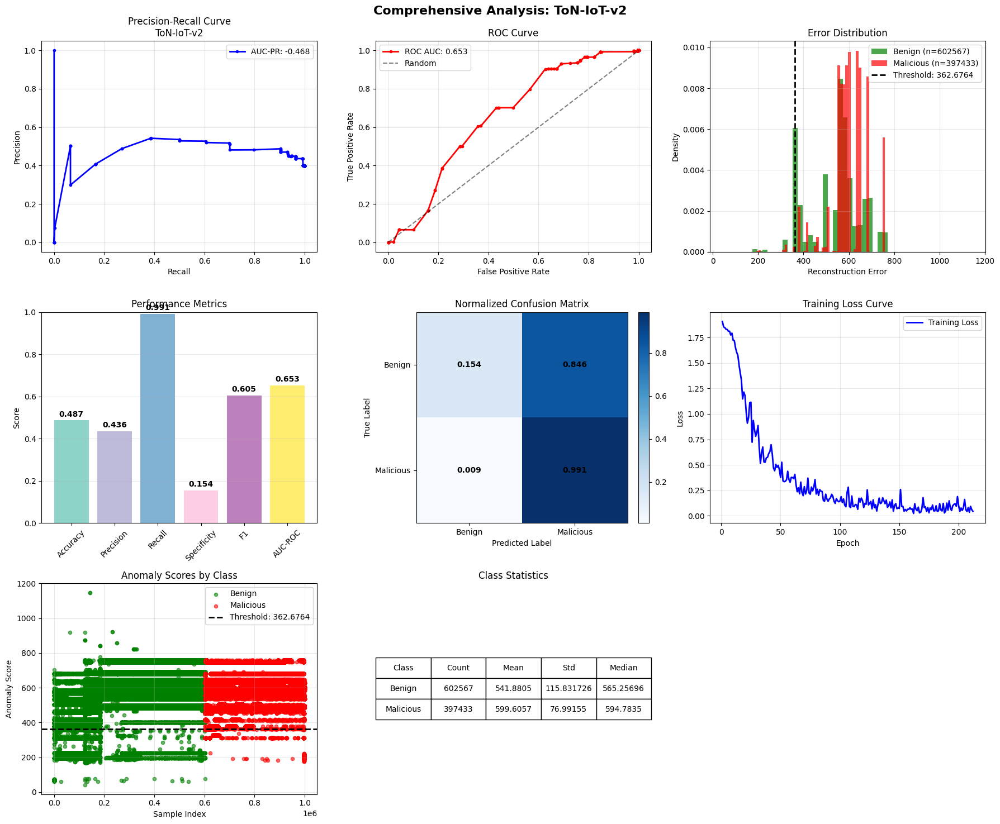

Successfully completed ToN-IoT-v2

EXPERIMENT: BoT-IoT-v2
{'path': '/kaggle/input/bot-v2/befb58edf3428167_MOHANAD_A4706/data/NF-BoT-IoT-v2.csv', 'node_features': ['PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['IN_BYTES', 'IN_PKTS']}
['PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['IN_BYTES', 'IN_PKTS']
Loading dataset from: /kaggle/input/bot-v2/befb58edf3428167_MOHANAD_A4706/data/NF-BoT-IoT-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.8956
   Balanced Accuracy: 0.8971
   Precision:        0.9780
   Recall (TPR):     0.8948
   FPR (FPR):     0.1007
   Specificity (TNR): 0.8993
   F1-Score:         0.9346
   AUC-ROC:          0.9064
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.63      0.90      0.74     99284
   Malicious       0.98      0.89      0.93    496420

    accuracy                           0.90    595704
   macro avg       0.80      0.90      0.84    595704
weighted avg       0.92      0.90      0.90    595704


--- Runtime Metrics for BoT-IoT-v2-SAGE ---
Training Time: 1.31s
Inference Time: 8.94s
Throughput: 66602.34 samples/sec
Estimated GPU Cost: $0.0013
Selected threshold: 12.265613


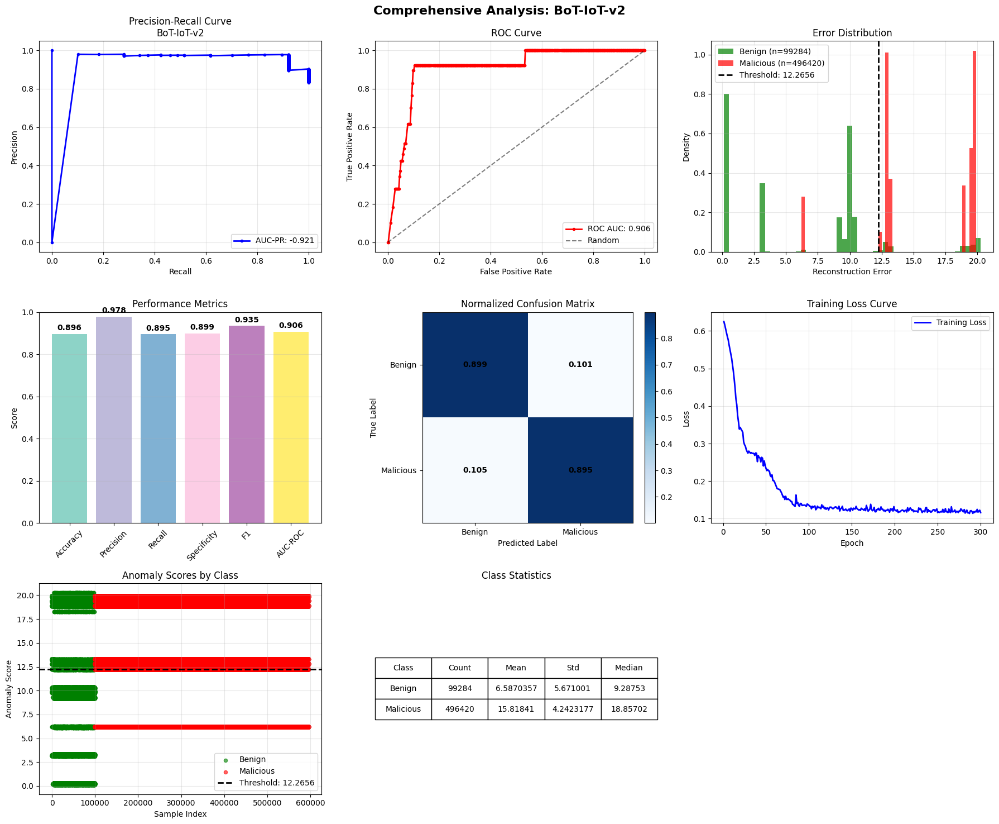

Successfully completed BoT-IoT-v2

FINAL EXPERIMENT SUMMARY
CICIDS-2018-v2:
  F1-Score: 0.8039
  Runtime: 266.5s
  Cost: $0.0333
  Throughput: 1884 samples/sec
UNSW-NB15-v2:
  F1-Score: 0.7680
  Runtime: 16.2s
  Cost: $0.0020
  Throughput: 36407 samples/sec
ToN-IoT-v2:
  F1-Score: 0.6054
  Runtime: 60.2s
  Cost: $0.0075
  Throughput: 17119 samples/sec
BoT-IoT-v2:
  F1-Score: 0.9346
  Runtime: 10.3s
  Cost: $0.0013
  Throughput: 66602 samples/sec

Total Runtime: 5.88 minutes
Total Cost: $0.0441
Average Cost per Dataset: $0.0110


In [14]:
# Cell 2: Main experiment loop
reset_torch()
all_results = {}
runtime_tracker = RuntimeTracker(gpu_cost_per_hour=0.45)  # Kaggle Tesla T4 rate

# Add this parameter at the top
USE_DYNAMIC_FEATURES = False  # Set to True to enable
DATASETS_TO_RUN = [
    "CICIDS-2018-v2",
    "UNSW-NB15-v2",
    "ToN-IoT-v2", 
    "BoT-IoT-v2"
]
for dataset_name in DATASETS_TO_RUN:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {dataset_name}")
    print(f"{'='*80}")
    config = DATASET_CONFIGS[dataset_name]
    print(config)
    print(config["node_features"])
    print(config["edge_features"])
    runtime_tracker.reset_timers()

    try:
        # Step 1: Load data FIRST (with all columns initially)
        df = load_dataset_chunks(
            file_path=config["path"],
            max_rows=1000000,
            required_features=None  # Load all columns initially for dynamic selection
        )
        
        # Step 2: Dynamic feature selection (if enabled) - AFTER loading data
        if USE_DYNAMIC_FEATURES:
            # Get all numeric columns except metadata
            excluded_cols = ['IPV4_SRC_ADDR', 'IPV4_DST_ADDR', 'Label', 'Attack']
            all_features = [col for col in df.columns if col not in excluded_cols]
            selected_features = dynamic_feature_selection(df, all_features, top_k=8)
            config["node_features"] = selected_features[:4]  # First 4 for nodes
            config["edge_features"] = selected_features[4:8]  # Next 4 for edges
            
            print(f"Dynamic features selected for {dataset_name}:")
            print(f"   Node features: {config['node_features']}")
            print(f"   Edge features: {config['edge_features']}")
        
        # Step 3: Filter and preprocess - AFTER feature selection
        df = filter_dataset_for_efficiency(df, dataset_name, max_rows=500000)
        df = apply_iot_imbalance_handling(df, dataset_name, 
                                         config["node_features"] + config["edge_features"])
        
        # Continue with remaining steps...    
    
        
        # Step 3: Create leakage-free split
        train_ips, test_ips, malicious_ips = create_leakage_free_split(df, test_size=0.15)
                # Extract training timing from scalers
        train_timing = extract_runtime_from_scalers(scalers)
        
        # *** RUNTIME METRICS: Start inference timer ***
        start_infer = time.time()
        # Step 4: Build training graph
        X_train, X_edges_train, edge_index_train, ip_to_idx, edge_to_flows = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"], 
            train_ips=train_ips,
            mode='train'
        )
        
        # Step 5: Train model
        model, training_losses, scalers = train_gnn_autoencoder(
            X_nodes=X_train,
            X_edges=X_edges_train,
            edge_index=edge_index_train,
            train_ips=train_ips,
            ip_to_idx=ip_to_idx,
            model_params=MODEL_PARAMS,
            gnn_type="SAGE"
        )
        
        # Step 6: Evaluate on full graph
        X_full, X_edges_full, edge_index_full, ip_to_idx_full, _ = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"],
            train_ips=None,
            mode='full'
        )
        
        # Get node errors from model
        model.eval()
        with torch.no_grad():
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            X_full_scaled = scalers['node'].transform(X_full)
            X_full_tensor = torch.tensor(X_full_scaled, dtype=torch.float).to(device)
            edge_index_full = edge_index_full.to(device)
            
            x_hat, edge_hat, z = model(X_full_tensor, edge_index_full)
            node_errors = torch.mean((x_hat - X_full_tensor) ** 2, dim=1).cpu().numpy()
        
        # Step 7: Propagate to flow level
        flow_scores, flow_labels = propagate_node_scores_to_flows(
            df=df, 
            node_errors=node_errors, 
            ip_to_idx=ip_to_idx_full
        )
        
        # Step 8: Threshold selection and evaluation
        threshold = select_threshold(
            mode="f1",
            y_true=flow_labels,
            errors=flow_scores
        )
        
        y_pred = (flow_scores > threshold).astype(int)
        
        metrics = evaluate_model_comprehensive(
            y_true=flow_labels,
            y_pred=y_pred,
            y_scores=flow_scores,
            model_name=f"{dataset_name}-SAGE"
        )
        # *** RUNTIME METRICS: End inference timer ***
        end_infer = time.time()
        
        # *** RUNTIME METRICS: Calculate comprehensive metrics ***
        if train_timing:
            # Count total samples processed
            total_samples = len(flow_scores) if 'flow_scores' in locals() else len(df)
            
            runtime_metrics = calculate_and_print_runtime_metrics(
                start_train=train_timing['start_train'],
                end_train=train_timing['end_train'],
                start_infer=start_infer,
                end_infer=end_infer,
                total_samples=total_samples,
                results={'threshold': threshold},
                model_name=f"{dataset_name}-SAGE"
            )
            
            # Add runtime metrics to results
            metrics['runtime_metrics'] = runtime_metrics        
        # Step 9: Create visualizations
        create_comprehensive_plots(
            flow_labels=flow_labels,
            flow_scores=flow_scores,
            threshold=threshold,
            metrics=metrics,
            name=dataset_name,
            training_losses=training_losses
        )
        
        all_results[dataset_name] = metrics
        print(f"Successfully completed {dataset_name}")
        
    except Exception as e:
        print(f"Error processing {dataset_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        continue

# Print final summary at the end
print(f"\n{'='*80}")
print("FINAL EXPERIMENT SUMMARY")
print(f"{'='*80}")

total_cost = 0
total_time = 0

for dataset_name, results in all_results.items():
    if 'runtime_metrics' in results:
        runtime = results['runtime_metrics']
        total_cost += runtime['gpu_cost']
        total_time += runtime['train_duration'] + runtime['infer_duration']
        
        print(f"{dataset_name}:")
        print(f"  F1-Score: {results.get('f1', 'N/A'):.4f}")
        print(f"  Runtime: {runtime['train_duration'] + runtime['infer_duration']:.1f}s")
        print(f"  Cost: ${runtime['gpu_cost']:.4f}")
        print(f"  Throughput: {runtime.get('throughput', 0):.0f} samples/sec")

print(f"\nTotal Runtime: {total_time/60:.2f} minutes")
print(f"Total Cost: ${total_cost:.4f}")
print(f"Average Cost per Dataset: ${total_cost/len(all_results):.4f}" if all_results else "No results")

# Main Runner v2- GIN 


EXPERIMENT: CICIDS-2018-v2
{'path': '/kaggle/input/2018cic-v2/b3427ed8ad063a09_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO'], 'edge_features': ['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO']
['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']
Loading dataset from: /kaggle/input/2018cic-v2/b3427ed8ad063a09_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded ch

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9778
   Balanced Accuracy: 0.9218
   Precision:        0.9917
   Recall (TPR):     0.8447
   FPR (FPR):     0.0011
   Specificity (TNR): 0.9989
   F1-Score:         0.9123
   AUC-ROC:          0.9874
   MCC:              13.3540

Classification Report:
              precision    recall  f1-score   support

      Benign       0.98      1.00      0.99    431596
   Malicious       0.99      0.84      0.91     68404

    accuracy                           0.98    500000
   macro avg       0.98      0.92      0.95    500000
weighted avg       0.98      0.98      0.98    500000


--- Runtime Metrics for CICIDS-2018-v2-GAT ---
Training Time: 1.78s
Inference Time: 268.81s
Throughput: 1860.07 samples/sec
Estimated GPU Cost: $0.0338
Selected threshold: 10.499896


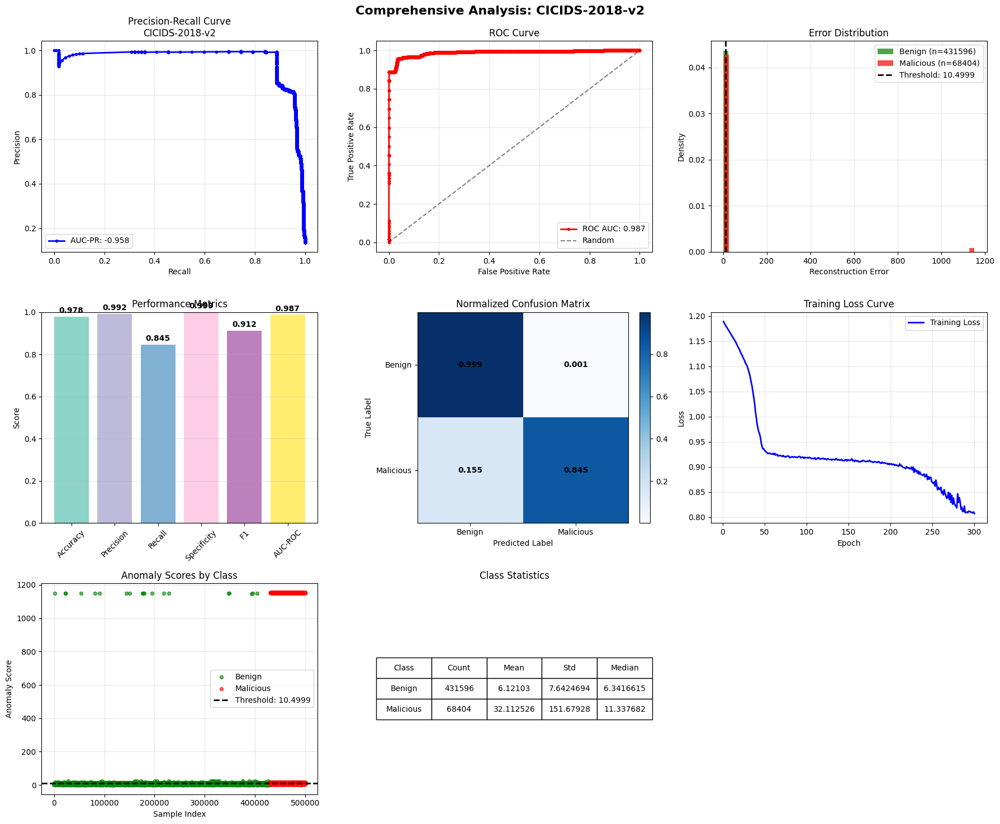

Successfully completed CICIDS-2018-v2

EXPERIMENT: UNSW-NB15-v2
{'path': '/kaggle/input/unsw-v2/fe6cb615d161452c_MOHANAD_A4706/data/NF-UNSW-NB15-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']
Loading dataset from: /kaggle/input/unsw-v2/fe6cb615d161452c_MOHANAD_A4706/data/NF-UNSW-NB15-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (tota

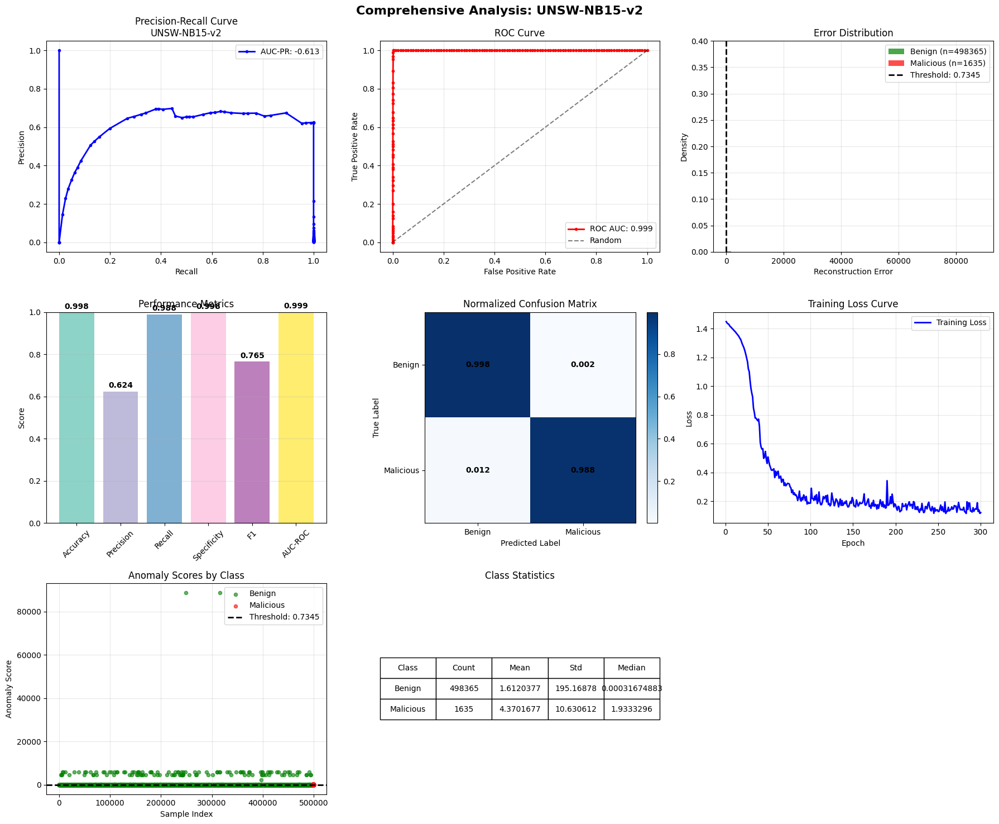

Successfully completed UNSW-NB15-v2

EXPERIMENT: ToN-IoT-v2
{'path': '/kaggle/input/ton-v2/9bafce9d380588c2_MOHANAD_A4706/data/NF-ToN-IoT-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']
Loading dataset from: /kaggle/input/ton-v2/9bafce9d380588c2_MOHANAD_A4706/data/NF-ToN-IoT-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.6646
   Balanced Accuracy: 0.6716
   Precision:        0.5623
   Recall (TPR):     0.7053
   FPR (FPR):     0.3622
   Specificity (TNR): 0.6378
   F1-Score:         0.6257
   AUC-ROC:          0.7238
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.77      0.64      0.70    602567
   Malicious       0.56      0.71      0.63    397433

    accuracy                           0.66   1000000
   macro avg       0.66      0.67      0.66   1000000
weighted avg       0.69      0.66      0.67   1000000


--- Runtime Metrics for ToN-IoT-v2-GAT ---
Training Time: 2.79s
Inference Time: 57.46s
Throughput: 17403.52 samples/sec
Estimated GPU Cost: $0.0075
Selected threshold: 702.873535


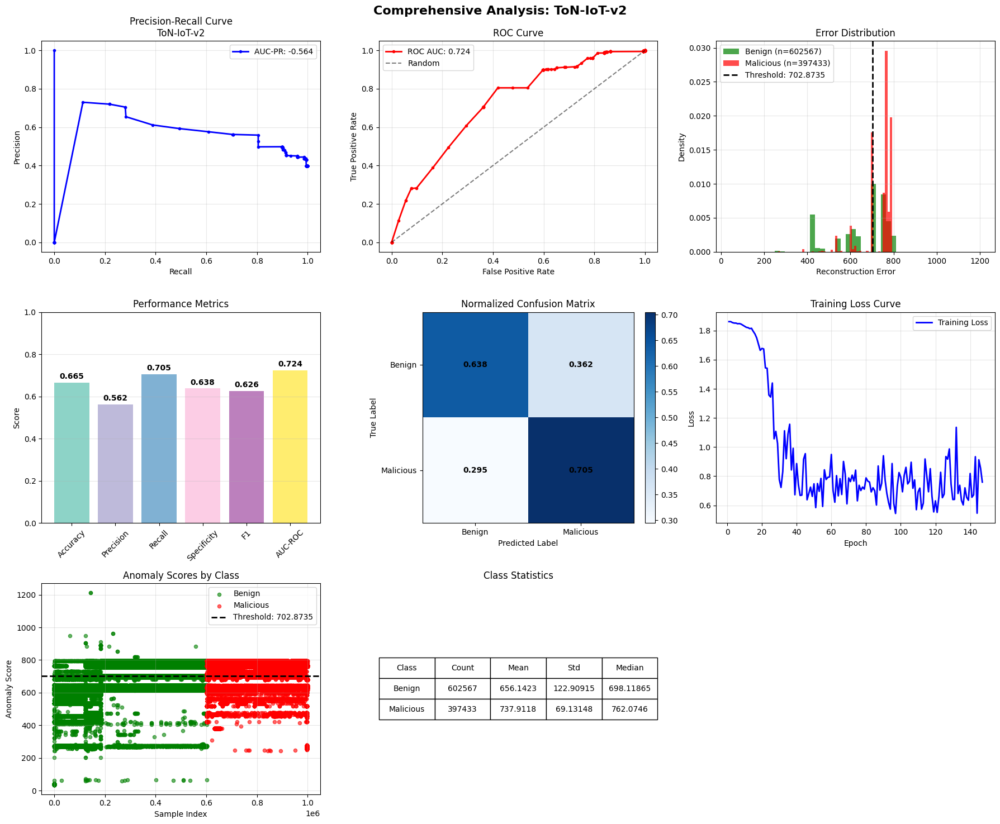

Successfully completed ToN-IoT-v2

EXPERIMENT: BoT-IoT-v2
{'path': '/kaggle/input/bot-v2/befb58edf3428167_MOHANAD_A4706/data/NF-BoT-IoT-v2.csv', 'node_features': ['PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['IN_BYTES', 'IN_PKTS']}
['PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['IN_BYTES', 'IN_PKTS']
Loading dataset from: /kaggle/input/bot-v2/befb58edf3428167_MOHANAD_A4706/data/NF-BoT-IoT-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.8956
   Balanced Accuracy: 0.8971
   Precision:        0.9780
   Recall (TPR):     0.8948
   FPR (FPR):     0.1007
   Specificity (TNR): 0.8993
   F1-Score:         0.9346
   AUC-ROC:          0.9060
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.63      0.90      0.74     99284
   Malicious       0.98      0.89      0.93    496420

    accuracy                           0.90    595704
   macro avg       0.80      0.90      0.84    595704
weighted avg       0.92      0.90      0.90    595704


--- Runtime Metrics for BoT-IoT-v2-GAT ---
Training Time: 1.38s
Inference Time: 8.66s
Throughput: 68748.99 samples/sec
Estimated GPU Cost: $0.0013
Selected threshold: 14.006756


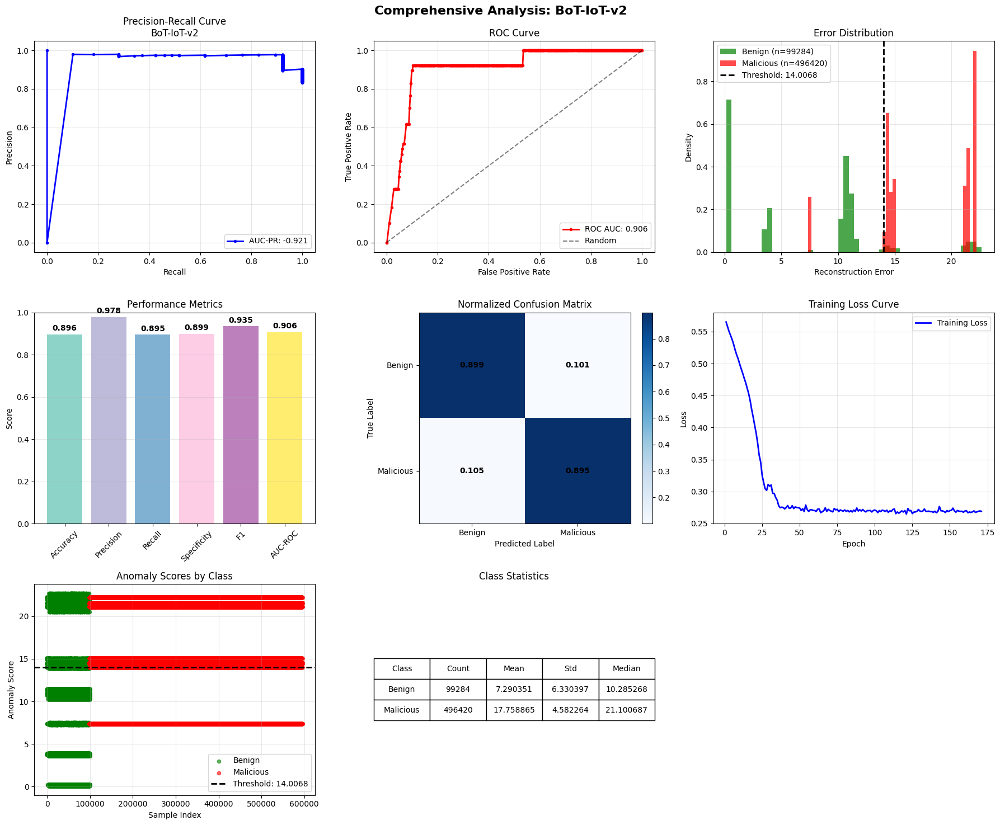

Successfully completed BoT-IoT-v2

FINAL EXPERIMENT SUMMARY
CICIDS-2018-v2:
  F1-Score: 0.9123
  Runtime: 270.6s
  Cost: $0.0338
  Throughput: 1860 samples/sec
UNSW-NB15-v2:
  F1-Score: 0.7648
  Runtime: 23.1s
  Cost: $0.0029
  Throughput: 34167 samples/sec
ToN-IoT-v2:
  F1-Score: 0.6257
  Runtime: 60.2s
  Cost: $0.0075
  Throughput: 17404 samples/sec
BoT-IoT-v2:
  F1-Score: 0.9346
  Runtime: 10.0s
  Cost: $0.0013
  Throughput: 68749 samples/sec

Total Runtime: 6.07 minutes
Total Cost: $0.0455
Average Cost per Dataset: $0.0114


In [15]:
# Cell 2: Main experiment loop
reset_torch()
all_results = {}
runtime_tracker = RuntimeTracker(gpu_cost_per_hour=0.45)  # Kaggle Tesla T4 rate

# Add this parameter at the top
USE_DYNAMIC_FEATURES = False  # Set to True to enable
DATASETS_TO_RUN = [
    "CICIDS-2018-v2",
    "UNSW-NB15-v2",
    "ToN-IoT-v2", 
    "BoT-IoT-v2"
]
for dataset_name in DATASETS_TO_RUN:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {dataset_name}")
    print(f"{'='*80}")
    config = DATASET_CONFIGS[dataset_name]
    print(config)
    print(config["node_features"])
    print(config["edge_features"])
    runtime_tracker.reset_timers()

    try:
        # Step 1: Load data FIRST (with all columns initially)
        df = load_dataset_chunks(
            file_path=config["path"],
            max_rows=1000000,
            required_features=None  # Load all columns initially for dynamic selection
        )
        
        # Step 2: Dynamic feature selection (if enabled) - AFTER loading data
        if USE_DYNAMIC_FEATURES:
            # Get all numeric columns except metadata
            excluded_cols = ['IPV4_SRC_ADDR', 'IPV4_DST_ADDR', 'Label', 'Attack']
            all_features = [col for col in df.columns if col not in excluded_cols]
            selected_features = dynamic_feature_selection(df, all_features, top_k=8)
            config["node_features"] = selected_features[:4]  # First 4 for nodes
            config["edge_features"] = selected_features[4:8]  # Next 4 for edges
            
            print(f"Dynamic features selected for {dataset_name}:")
            print(f"   Node features: {config['node_features']}")
            print(f"   Edge features: {config['edge_features']}")
        
        # Step 3: Filter and preprocess - AFTER feature selection
        df = filter_dataset_for_efficiency(df, dataset_name, max_rows=500000)
        df = apply_iot_imbalance_handling(df, dataset_name, 
                                         config["node_features"] + config["edge_features"])
        
        # Continue with remaining steps...    
    
        
        # Step 3: Create leakage-free split
        train_ips, test_ips, malicious_ips = create_leakage_free_split(df, test_size=0.15)
                # Extract training timing from scalers
        train_timing = extract_runtime_from_scalers(scalers)
        
        # *** RUNTIME METRICS: Start inference timer ***
        start_infer = time.time()
        # Step 4: Build training graph
        X_train, X_edges_train, edge_index_train, ip_to_idx, edge_to_flows = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"], 
            train_ips=train_ips,
            mode='train'
        )
        
        # Step 5: Train model
        model, training_losses, scalers = train_gnn_autoencoder(
            X_nodes=X_train,
            X_edges=X_edges_train,
            edge_index=edge_index_train,
            train_ips=train_ips,
            ip_to_idx=ip_to_idx,
            model_params=MODEL_PARAMS,
            gnn_type="GAT"
        )
        
        # Step 6: Evaluate on full graph
        X_full, X_edges_full, edge_index_full, ip_to_idx_full, _ = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"],
            train_ips=None,
            mode='full'
        )
        
        # Get node errors from model
        model.eval()
        with torch.no_grad():
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            X_full_scaled = scalers['node'].transform(X_full)
            X_full_tensor = torch.tensor(X_full_scaled, dtype=torch.float).to(device)
            edge_index_full = edge_index_full.to(device)
            
            x_hat, edge_hat, z = model(X_full_tensor, edge_index_full)
            node_errors = torch.mean((x_hat - X_full_tensor) ** 2, dim=1).cpu().numpy()
        
        # Step 7: Propagate to flow level
        flow_scores, flow_labels = propagate_node_scores_to_flows(
            df=df, 
            node_errors=node_errors, 
            ip_to_idx=ip_to_idx_full
        )
        
        # Step 8: Threshold selection and evaluation
        threshold = select_threshold(
            mode="f1",
            y_true=flow_labels,
            errors=flow_scores
        )
        
        y_pred = (flow_scores > threshold).astype(int)
        
        metrics = evaluate_model_comprehensive(
            y_true=flow_labels,
            y_pred=y_pred,
            y_scores=flow_scores,
            model_name=f"{dataset_name}-GIN"
        )
        # *** RUNTIME METRICS: End inference timer ***
        end_infer = time.time()
        
        # *** RUNTIME METRICS: Calculate comprehensive metrics ***
        if train_timing:
            # Count total samples processed
            total_samples = len(flow_scores) if 'flow_scores' in locals() else len(df)
            
            runtime_metrics = calculate_and_print_runtime_metrics(
                start_train=train_timing['start_train'],
                end_train=train_timing['end_train'],
                start_infer=start_infer,
                end_infer=end_infer,
                total_samples=total_samples,
                results={'threshold': threshold},
                model_name=f"{dataset_name}-GAT"
            )
            
            # Add runtime metrics to results
            metrics['runtime_metrics'] = runtime_metrics        
        # Step 9: Create visualizations
        create_comprehensive_plots(
            flow_labels=flow_labels,
            flow_scores=flow_scores,
            threshold=threshold,
            metrics=metrics,
            name=dataset_name,
            training_losses=training_losses
        )
        
        all_results[dataset_name] = metrics
        print(f"Successfully completed {dataset_name}")
        
    except Exception as e:
        print(f"Error processing {dataset_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        continue

# Print final summary at the end
print(f"\n{'='*80}")
print("FINAL EXPERIMENT SUMMARY")
print(f"{'='*80}")

total_cost = 0
total_time = 0

for dataset_name, results in all_results.items():
    if 'runtime_metrics' in results:
        runtime = results['runtime_metrics']
        total_cost += runtime['gpu_cost']
        total_time += runtime['train_duration'] + runtime['infer_duration']
        
        print(f"{dataset_name}:")
        print(f"  F1-Score: {results.get('f1', 'N/A'):.4f}")
        print(f"  Runtime: {runtime['train_duration'] + runtime['infer_duration']:.1f}s")
        print(f"  Cost: ${runtime['gpu_cost']:.4f}")
        print(f"  Throughput: {runtime.get('throughput', 0):.0f} samples/sec")

print(f"\nTotal Runtime: {total_time/60:.2f} minutes")
print(f"Total Cost: ${total_cost:.4f}")
print(f"Average Cost per Dataset: ${total_cost/len(all_results):.4f}" if all_results else "No results")

# Main Runner v2- GAT


EXPERIMENT: CICIDS-2018-v2
{'path': '/kaggle/input/2018cic-v2/b3427ed8ad063a09_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO'], 'edge_features': ['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO']
['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']
Loading dataset from: /kaggle/input/2018cic-v2/b3427ed8ad063a09_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded ch

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9762
   Balanced Accuracy: 0.9208
   Precision:        0.9782
   Recall (TPR):     0.8447
   FPR (FPR):     0.0030
   Specificity (TNR): 0.9970
   F1-Score:         0.9065
   AUC-ROC:          0.9887
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.98      1.00      0.99    431596
   Malicious       0.98      0.84      0.91     68404

    accuracy                           0.98    500000
   macro avg       0.98      0.92      0.95    500000
weighted avg       0.98      0.98      0.98    500000


--- Runtime Metrics for CICIDS-2018-v2-GAT ---
Training Time: 1.61s
Inference Time: 270.28s
Throughput: 1849.95 samples/sec
Estimated GPU Cost: $0.0340
Selected threshold: 10.251953


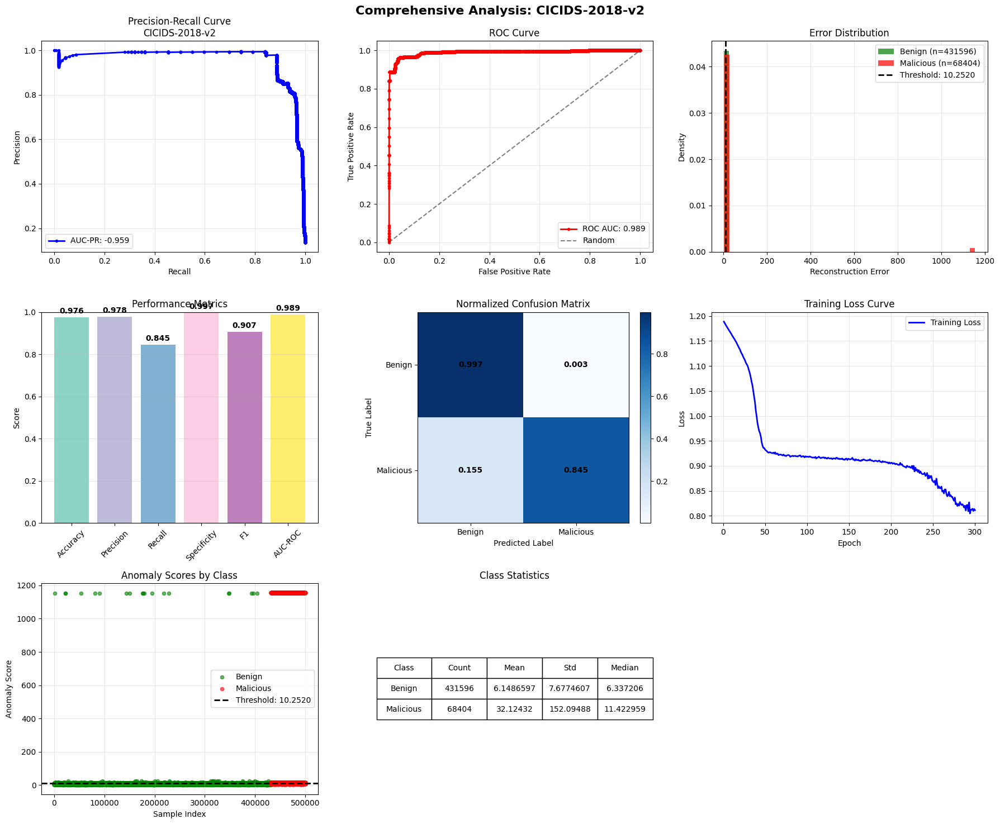

Successfully completed CICIDS-2018-v2

EXPERIMENT: UNSW-NB15-v2
{'path': '/kaggle/input/unsw-v2/fe6cb615d161452c_MOHANAD_A4706/data/NF-UNSW-NB15-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']
Loading dataset from: /kaggle/input/unsw-v2/fe6cb615d161452c_MOHANAD_A4706/data/NF-UNSW-NB15-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (tota

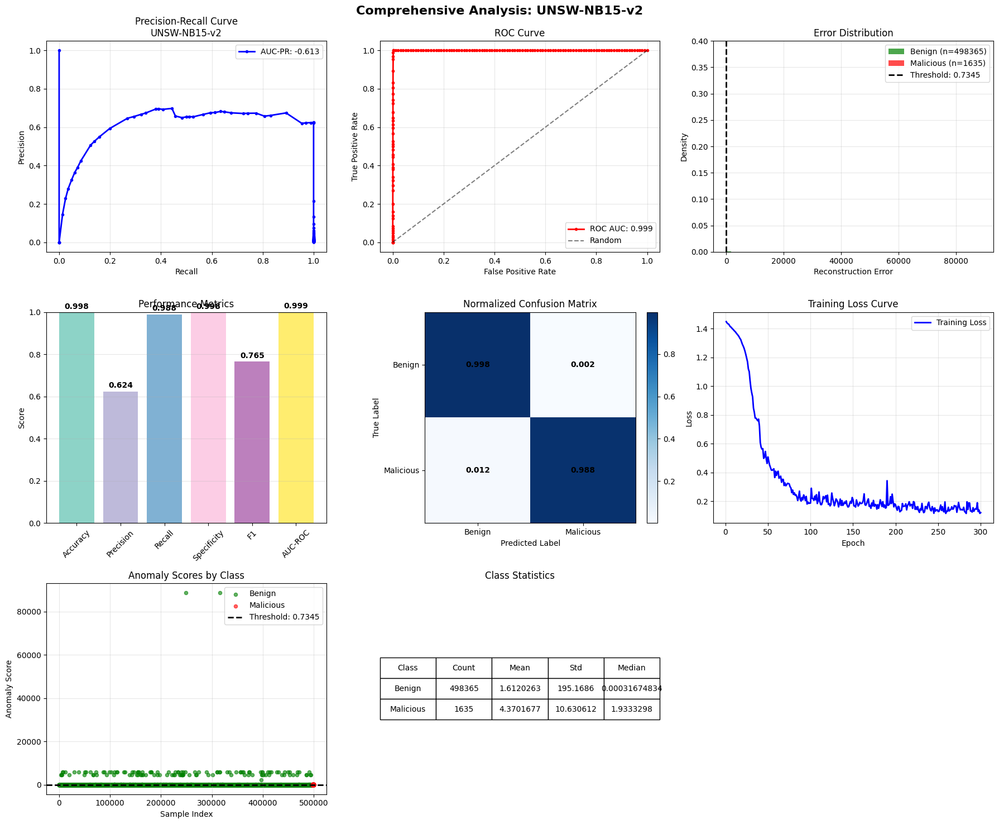

Successfully completed UNSW-NB15-v2

EXPERIMENT: ToN-IoT-v2
{'path': '/kaggle/input/ton-v2/9bafce9d380588c2_MOHANAD_A4706/data/NF-ToN-IoT-v2.csv', 'node_features': ['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']}
['L4_DST_PORT', 'PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']
Loading dataset from: /kaggle/input/ton-v2/9bafce9d380588c2_MOHANAD_A4706/data/NF-ToN-IoT-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.6646
   Balanced Accuracy: 0.6716
   Precision:        0.5623
   Recall (TPR):     0.7053
   FPR (FPR):     0.3622
   Specificity (TNR): 0.6378
   F1-Score:         0.6257
   AUC-ROC:          0.7238
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.77      0.64      0.70    602567
   Malicious       0.56      0.71      0.63    397433

    accuracy                           0.66   1000000
   macro avg       0.66      0.67      0.66   1000000
weighted avg       0.69      0.66      0.67   1000000


--- Runtime Metrics for ToN-IoT-v2-GAT ---
Training Time: 2.76s
Inference Time: 56.73s
Throughput: 17628.23 samples/sec
Estimated GPU Cost: $0.0074
Selected threshold: 702.873352


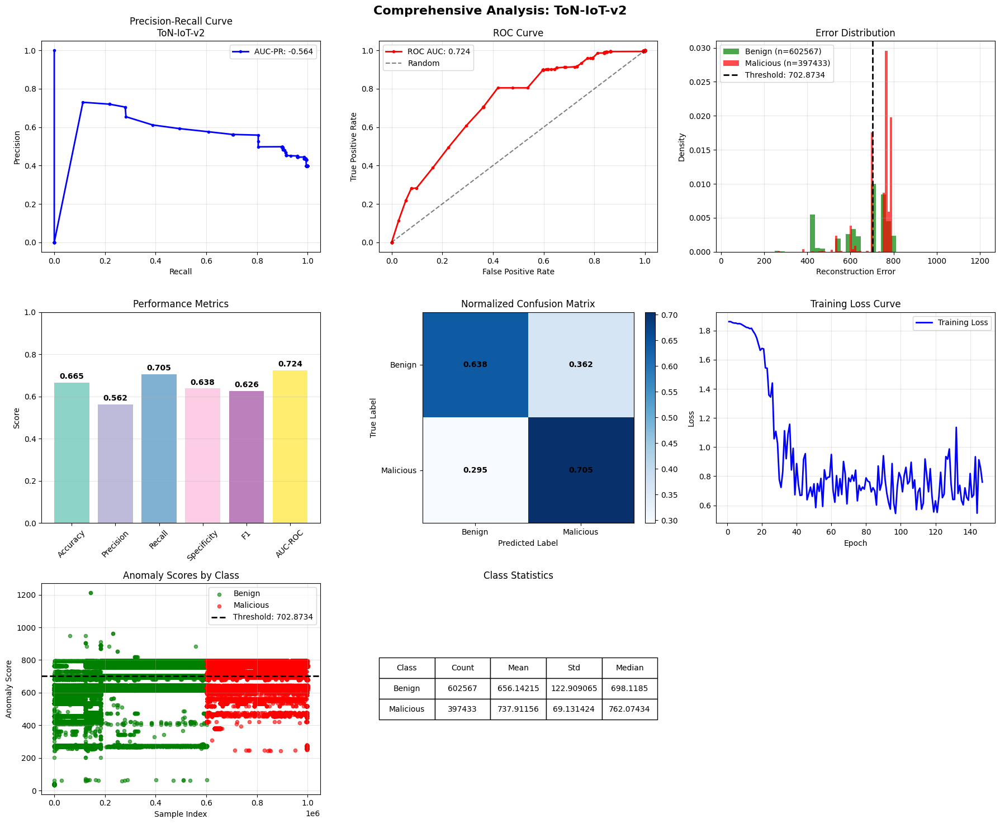

Successfully completed ToN-IoT-v2

EXPERIMENT: BoT-IoT-v2
{'path': '/kaggle/input/bot-v2/befb58edf3428167_MOHANAD_A4706/data/NF-BoT-IoT-v2.csv', 'node_features': ['PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'], 'edge_features': ['IN_BYTES', 'IN_PKTS']}
['PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS']
['IN_BYTES', 'IN_PKTS']
Loading dataset from: /kaggle/input/bot-v2/befb58edf3428167_MOHANAD_A4706/data/NF-BoT-IoT-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.8956
   Balanced Accuracy: 0.8971
   Precision:        0.9780
   Recall (TPR):     0.8948
   FPR (FPR):     0.1007
   Specificity (TNR): 0.8993
   F1-Score:         0.9346
   AUC-ROC:          0.9060
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.63      0.90      0.74     99284
   Malicious       0.98      0.89      0.93    496420

    accuracy                           0.90    595704
   macro avg       0.80      0.90      0.84    595704
weighted avg       0.92      0.90      0.90    595704


--- Runtime Metrics for BoT-IoT-v2-GAT ---
Training Time: 1.38s
Inference Time: 8.54s
Throughput: 69715.22 samples/sec
Estimated GPU Cost: $0.0012
Selected threshold: 14.006756


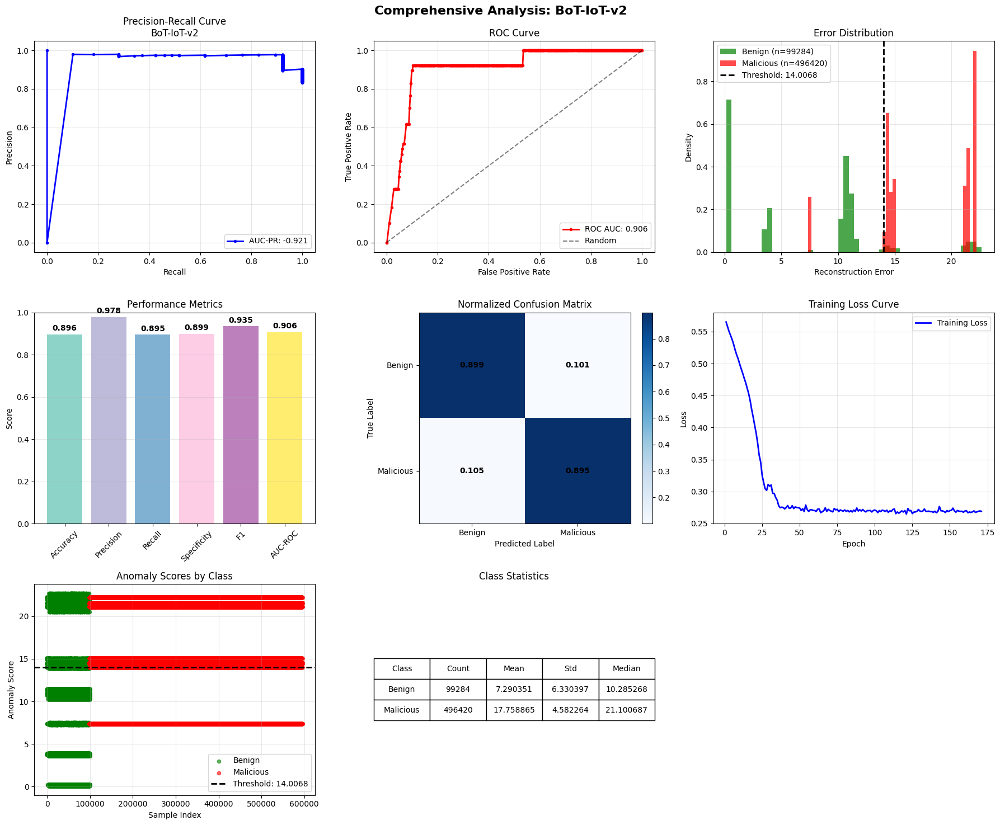

Successfully completed BoT-IoT-v2

FINAL EXPERIMENT SUMMARY
CICIDS-2018-v2:
  F1-Score: 0.9065
  Runtime: 271.9s
  Cost: $0.0340
  Throughput: 1850 samples/sec
UNSW-NB15-v2:
  F1-Score: 0.7648
  Runtime: 22.9s
  Cost: $0.0029
  Throughput: 34561 samples/sec
ToN-IoT-v2:
  F1-Score: 0.6257
  Runtime: 59.5s
  Cost: $0.0074
  Throughput: 17628 samples/sec
BoT-IoT-v2:
  F1-Score: 0.9346
  Runtime: 9.9s
  Cost: $0.0012
  Throughput: 69715 samples/sec

Total Runtime: 6.07 minutes
Total Cost: $0.0455
Average Cost per Dataset: $0.0114


In [16]:
# Cell 2: Main experiment loop
reset_torch()
all_results = {}
runtime_tracker = RuntimeTracker(gpu_cost_per_hour=0.45)  # Kaggle Tesla T4 rate

# Add this parameter at the top
USE_DYNAMIC_FEATURES = False  # Set to True to enable
DATASETS_TO_RUN = [
    "CICIDS-2018-v2",
    "UNSW-NB15-v2",
    "ToN-IoT-v2", 
    "BoT-IoT-v2"
]
for dataset_name in DATASETS_TO_RUN:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {dataset_name}")
    print(f"{'='*80}")
    config = DATASET_CONFIGS[dataset_name]
    print(config)
    print(config["node_features"])
    print(config["edge_features"])
    runtime_tracker.reset_timers()

    try:
        # Step 1: Load data FIRST (with all columns initially)
        df = load_dataset_chunks(
            file_path=config["path"],
            max_rows=1000000,
            required_features=None  # Load all columns initially for dynamic selection
        )
        
        # Step 2: Dynamic feature selection (if enabled) - AFTER loading data
        if USE_DYNAMIC_FEATURES:
            # Get all numeric columns except metadata
            excluded_cols = ['IPV4_SRC_ADDR', 'IPV4_DST_ADDR', 'Label', 'Attack']
            all_features = [col for col in df.columns if col not in excluded_cols]
            selected_features = dynamic_feature_selection(df, all_features, top_k=8)
            config["node_features"] = selected_features[:4]  # First 4 for nodes
            config["edge_features"] = selected_features[4:8]  # Next 4 for edges
            
            print(f"Dynamic features selected for {dataset_name}:")
            print(f"   Node features: {config['node_features']}")
            print(f"   Edge features: {config['edge_features']}")
        
        # Step 3: Filter and preprocess - AFTER feature selection
        df = filter_dataset_for_efficiency(df, dataset_name, max_rows=500000)
        df = apply_iot_imbalance_handling(df, dataset_name, 
                                         config["node_features"] + config["edge_features"])
        
        # Continue with remaining steps...    
    
        
        # Step 3: Create leakage-free split
        train_ips, test_ips, malicious_ips = create_leakage_free_split(df, test_size=0.15)
                # Extract training timing from scalers
        train_timing = extract_runtime_from_scalers(scalers)
        
        # *** RUNTIME METRICS: Start inference timer ***
        start_infer = time.time()
        # Step 4: Build training graph
        X_train, X_edges_train, edge_index_train, ip_to_idx, edge_to_flows = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"], 
            train_ips=train_ips,
            mode='train'
        )
        
        # Step 5: Train model
        model, training_losses, scalers = train_gnn_autoencoder(
            X_nodes=X_train,
            X_edges=X_edges_train,
            edge_index=edge_index_train,
            train_ips=train_ips,
            ip_to_idx=ip_to_idx,
            model_params=MODEL_PARAMS,
            gnn_type="GAT"
        )
        
        # Step 6: Evaluate on full graph
        X_full, X_edges_full, edge_index_full, ip_to_idx_full, _ = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"],
            train_ips=None,
            mode='full'
        )
        
        # Get node errors from model
        model.eval()
        with torch.no_grad():
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            X_full_scaled = scalers['node'].transform(X_full)
            X_full_tensor = torch.tensor(X_full_scaled, dtype=torch.float).to(device)
            edge_index_full = edge_index_full.to(device)
            
            x_hat, edge_hat, z = model(X_full_tensor, edge_index_full)
            node_errors = torch.mean((x_hat - X_full_tensor) ** 2, dim=1).cpu().numpy()
        
        # Step 7: Propagate to flow level
        flow_scores, flow_labels = propagate_node_scores_to_flows(
            df=df, 
            node_errors=node_errors, 
            ip_to_idx=ip_to_idx_full
        )
        
        # Step 8: Threshold selection and evaluation
        threshold = select_threshold(
            mode="f1",
            y_true=flow_labels,
            errors=flow_scores
        )
        
        y_pred = (flow_scores > threshold).astype(int)
        
        metrics = evaluate_model_comprehensive(
            y_true=flow_labels,
            y_pred=y_pred,
            y_scores=flow_scores,
            model_name=f"{dataset_name}-GAT"
        )
        # *** RUNTIME METRICS: End inference timer ***
        end_infer = time.time()
        
        # *** RUNTIME METRICS: Calculate comprehensive metrics ***
        if train_timing:
            # Count total samples processed
            total_samples = len(flow_scores) if 'flow_scores' in locals() else len(df)
            
            runtime_metrics = calculate_and_print_runtime_metrics(
                start_train=train_timing['start_train'],
                end_train=train_timing['end_train'],
                start_infer=start_infer,
                end_infer=end_infer,
                total_samples=total_samples,
                results={'threshold': threshold},
                model_name=f"{dataset_name}-GAT"
            )
            
            # Add runtime metrics to results
            metrics['runtime_metrics'] = runtime_metrics        
        # Step 9: Create visualizations
        create_comprehensive_plots(
            flow_labels=flow_labels,
            flow_scores=flow_scores,
            threshold=threshold,
            metrics=metrics,
            name=dataset_name,
            training_losses=training_losses
        )
        
        all_results[dataset_name] = metrics
        print(f"Successfully completed {dataset_name}")
        
    except Exception as e:
        print(f"Error processing {dataset_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        continue

# Print final summary at the end
print(f"\n{'='*80}")
print("FINAL EXPERIMENT SUMMARY")
print(f"{'='*80}")

total_cost = 0
total_time = 0

for dataset_name, results in all_results.items():
    if 'runtime_metrics' in results:
        runtime = results['runtime_metrics']
        total_cost += runtime['gpu_cost']
        total_time += runtime['train_duration'] + runtime['infer_duration']
        
        print(f"{dataset_name}:")
        print(f"  F1-Score: {results.get('f1', 'N/A'):.4f}")
        print(f"  Runtime: {runtime['train_duration'] + runtime['infer_duration']:.1f}s")
        print(f"  Cost: ${runtime['gpu_cost']:.4f}")
        print(f"  Throughput: {runtime.get('throughput', 0):.0f} samples/sec")

print(f"\nTotal Runtime: {total_time/60:.2f} minutes")
print(f"Total Cost: ${total_cost:.4f}")
print(f"Average Cost per Dataset: ${total_cost/len(all_results):.4f}" if all_results else "No results")

# Dynamic Feature Selection - GCN v1 dataset


EXPERIMENT: CICIDS-2018-v1
Loading dataset from: /kaggle/input/2018-v1-cicids/88a47ba2ab64258e_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
   Loaded chunk: 20,000 rows (total: 3

/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kag

   Log-transformed FLOW_DURATION_MILLISECONDS
 Preprocessing 10 features (0 categorical, 10 numerical)
 Handling missing values...
   Clipped outliers at 0.999 quantile
   Applied StandardScaler
 Filtering CICIDS-2018-v1 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in CICIDS-2018-v1:
  ✅ No infinity values found
 Applying imbalance handling for CICIDS-2018-v1...
   Original class distribution:
   Benign: 497,717 (0.995)
   Attack: 2,283 (0.005)
 Constructing leakage-free graph in train mode...
    Training mode: Using 195432 BENIGN flows only
    Graph nodes: 2000 IPs
    Graph edges: 37938
Training GNN Autoencoder (GCN)...
 Cleaning infinity values...
 Data cleaning completed. Shapes: X_nodes=(2000, 16), X_edges=(37938, 7)
Model architecture: 16 → 64 → 32
 Starting training...
Epoch   0 | Loss: 1.252417 | Node: 1.146525 | Edge: 1.016004
Epoch  25 | Loss: 1.196248 | Node: 1.091379 | Edge: 1.004307
Epoch  50 | Loss: 1.123427 | Node: 1.019555 

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.8282
   Balanced Accuracy: 0.6414
   Precision:        0.0121
   Recall (TPR):     0.4529
   FPR (FPR):     0.1701
   Specificity (TNR): 0.8299
   F1-Score:         0.0235
   AUC-ROC:          0.8572
   MCC:              0.1731

Classification Report:
              precision    recall  f1-score   support

      Benign       1.00      0.83      0.91    497717
   Malicious       0.01      0.45      0.02      2283

    accuracy                           0.83    500000
   macro avg       0.50      0.64      0.46    500000
weighted avg       0.99      0.83      0.90    500000


--- Runtime Metrics for CICIDS-2018-v1-GCN ---
Training Time: 2.48s
Inference Time: 161.83s
Throughput: 3089.65 samples/sec
Estimated GPU Cost: $0.0205
Selected threshold: 0.992394


/kaggle/working/gnn_ids/evaluation/visualizations.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


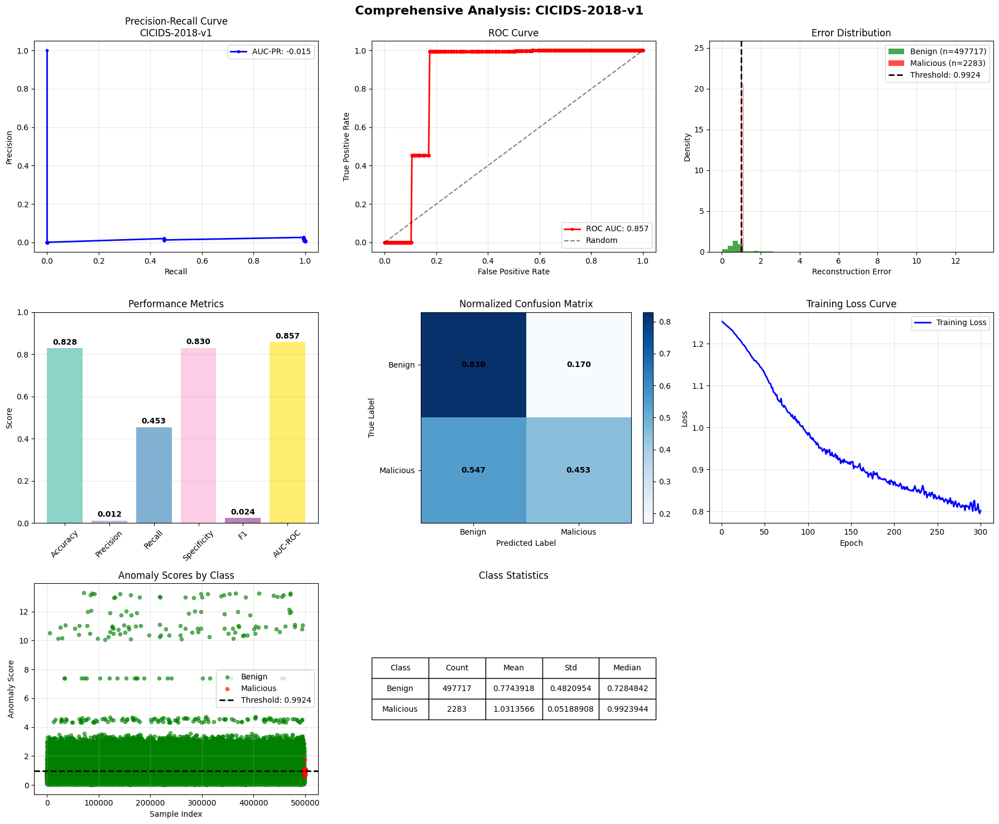

✅ Successfully completed CICIDS-2018-v1

EXPERIMENT: UNSW-NB15-v1
Loading dataset from: /kaggle/input/nf-unsw-nb15-netflowversion1/88695f0f620eb568_MOHANAD_A4706/data/NF-UNSW-NB15.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 3

/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kag

 Preprocessing 10 features (0 categorical, 10 numerical)
 Handling missing values...
   Clipped outliers at 0.999 quantile
   Applied StandardScaler
 Filtering UNSW-NB15-v1 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in UNSW-NB15-v1:
  ✅ No infinity values found
 Applying imbalance handling for UNSW-NB15-v1...
   Original class distribution:
   Benign: 466,240 (0.932)
   Attack: 33,760 (0.068)
 Constructing leakage-free graph in train mode...
    Training mode: Using 290143 BENIGN flows only
    Graph nodes: 42 IPs
    Graph edges: 144
Training GNN Autoencoder (GCN)...
 Cleaning infinity values...
 Data cleaning completed. Shapes: X_nodes=(42, 16), X_edges=(144, 7)
Model architecture: 16 → 64 → 32
 Starting training...
Epoch   0 | Loss: 1.523447 | Node: 1.418295 | Edge: 1.026642
Epoch  25 | Loss: 0.411345 | Node: 0.315769 | Edge: 0.929614
Epoch  50 | Loss: 0.201445 | Node: 0.126302 | Edge: 0.725223
Epoch  75 | Loss: 0.153557 | Node: 0.09050

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9639
   Balanced Accuracy: 0.9709
   Precision:        0.6560
   Recall (TPR):     0.9790
   FPR (FPR):     0.0372
   Specificity (TNR): 0.9628
   F1-Score:         0.7856
   AUC-ROC:          0.9838
   MCC:              6.0108

Classification Report:
              precision    recall  f1-score   support

      Benign       1.00      0.96      0.98    466240
   Malicious       0.66      0.98      0.79     33760

    accuracy                           0.96    500000
   macro avg       0.83      0.97      0.88    500000
weighted avg       0.98      0.96      0.97    500000


--- Runtime Metrics for UNSW-NB15-v1-GCN ---
Training Time: 2.03s
Inference Time: 8.92s
Throughput: 56066.97 samples/sec
Estimated GPU Cost: $0.0014
Selected threshold: 0.622160


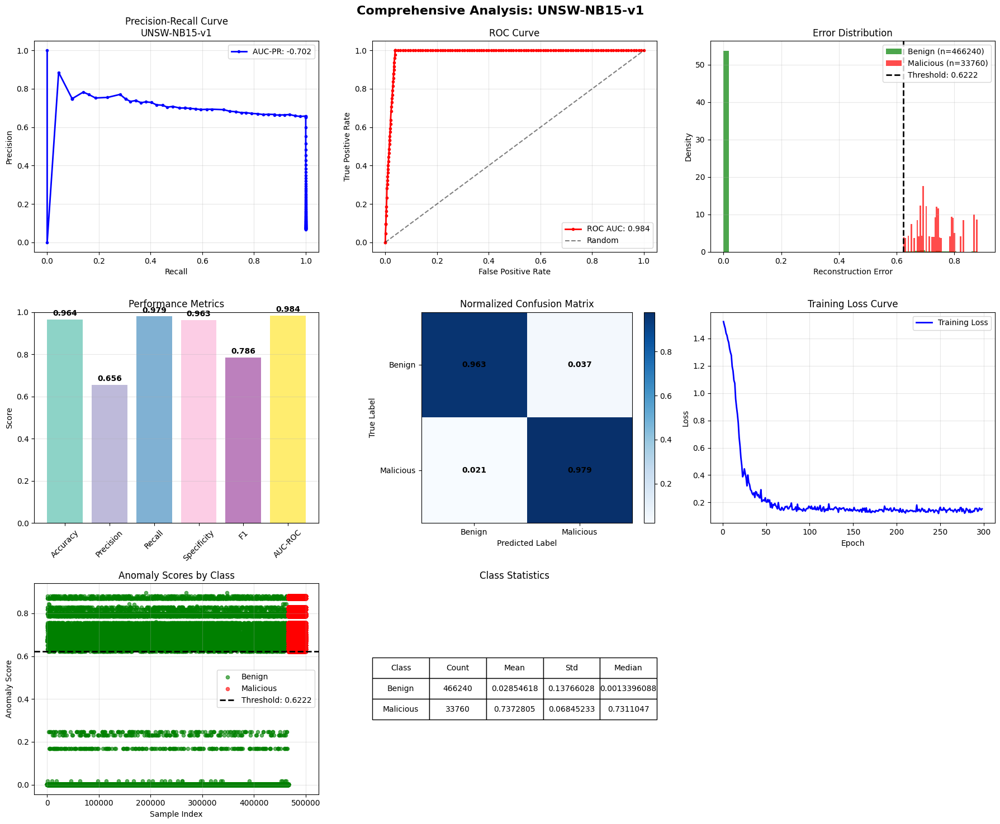

✅ Successfully completed UNSW-NB15-v1

EXPERIMENT: ToN-IoT-v1
Loading dataset from: /kaggle/input/nf-ton-iot/7ca78ae35fa4961a_MOHANAD_A4706/data/NF-ToN-IoT.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
   Loaded chunk:

/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kag

   Log-transformed OUT_BYTES
   Log-transformed IN_PKTS
   Log-transformed OUT_PKTS
   Log-transformed FLOW_DURATION_MILLISECONDS
 Preprocessing 10 features (0 categorical, 10 numerical)
 Handling missing values...
   Clipped outliers at 0.999 quantile
   Applied StandardScaler
 Filtering ToN-IoT-v1 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in ToN-IoT-v1:
  ✅ No infinity values found
 Applying imbalance handling for ToN-IoT-v1...
   Original class distribution:
   Benign: 166,424 (0.333)
   Attack: 333,576 (0.667)
 Constructing leakage-free graph in train mode...
    Training mode: Using 12456 BENIGN flows only
    Graph nodes: 1485 IPs
    Graph edges: 224
Training GNN Autoencoder (GCN)...
 Cleaning infinity values...
 Data cleaning completed. Shapes: X_nodes=(1485, 16), X_edges=(224, 7)
Model architecture: 16 → 64 → 32
 Starting training...
Epoch   0 | Loss: 1.441561 | Node: 1.287500 | Edge: 1.511483
Epoch  25 | Loss: 1.082729 | Node: 0

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


              precision    recall  f1-score   support

      Benign       1.00      0.08      0.15    166424
   Malicious       0.68      1.00      0.81    333576

    accuracy                           0.69    500000
   macro avg       0.84      0.54      0.48    500000
weighted avg       0.79      0.69      0.59    500000


--- Runtime Metrics for ToN-IoT-v1-GCN ---
Training Time: 2.21s
Inference Time: 95.65s
Throughput: 5227.15 samples/sec
Estimated GPU Cost: $0.0122
Selected threshold: 29.692513


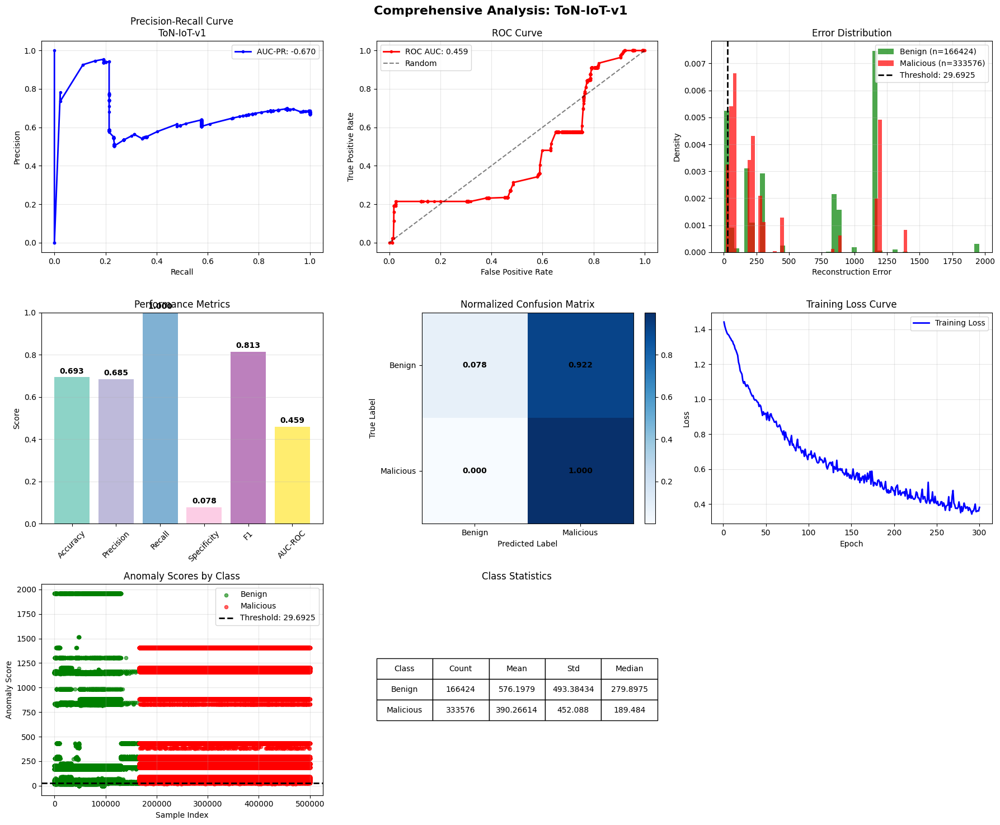

✅ Successfully completed ToN-IoT-v1

EXPERIMENT: BoT-IoT-v1
Loading dataset from: /kaggle/input/nf-bot-iot-kaggle1/de2c6f75dd50d933_MOHANAD_A4706/data/NF-BoT-IoT.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
   Loaded 

/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kag

 Preprocessing 10 features (0 categorical, 10 numerical)
 Handling missing values...
   Clipped outliers at 0.999 quantile
   Applied StandardScaler
 Filtering BoT-IoT-v1 dataset for efficiency...
   Original size: 600,100 rows
🔍 Checking for infinity values in BoT-IoT-v1:
  ✅ No infinity values found
 Applying imbalance handling for BoT-IoT-v1...
   Original class distribution:
   Benign: 13,859 (0.028)
   Attack: 486,141 (0.972)
    Extreme imbalance detected - applying oversampling...
   Using SMOTE for moderate imbalance...
    Oversampling completed: 583,369 rows
 Constructing leakage-free graph in train mode...
    Training mode: Using 17980 BENIGN flows only
    Graph nodes: 131 IPs
    Graph edges: 832
Training GNN Autoencoder (GCN)...
 Cleaning infinity values...
 Data cleaning completed. Shapes: X_nodes=(131, 16), X_edges=(832, 7)
Model architecture: 16 → 64 → 32
 Starting training...
Epoch   0 | Loss: 0.634627 | Node: 0.526300 | Edge: 1.034850
Epoch  25 | Loss: 0.475872 | No

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.8668
   Balanced Accuracy: 0.8622
   Precision:        0.9678
   Recall (TPR):     0.8691
   FPR (FPR):     0.1447
   Specificity (TNR): 0.8553
   F1-Score:         0.9158
   AUC-ROC:          0.9263
   MCC:              16.7369

Classification Report:
              precision    recall  f1-score   support

      Benign       0.57      0.86      0.68     97228
   Malicious       0.97      0.87      0.92    486141

    accuracy                           0.87    583369
   macro avg       0.77      0.86      0.80    583369
weighted avg       0.90      0.87      0.88    583369


--- Runtime Metrics for BoT-IoT-v1-GCN ---
Training Time: 0.82s
Inference Time: 11.93s
Throughput: 48891.31 samples/sec
Estimated GPU Cost: $0.0016
Selected threshold: 7.777637


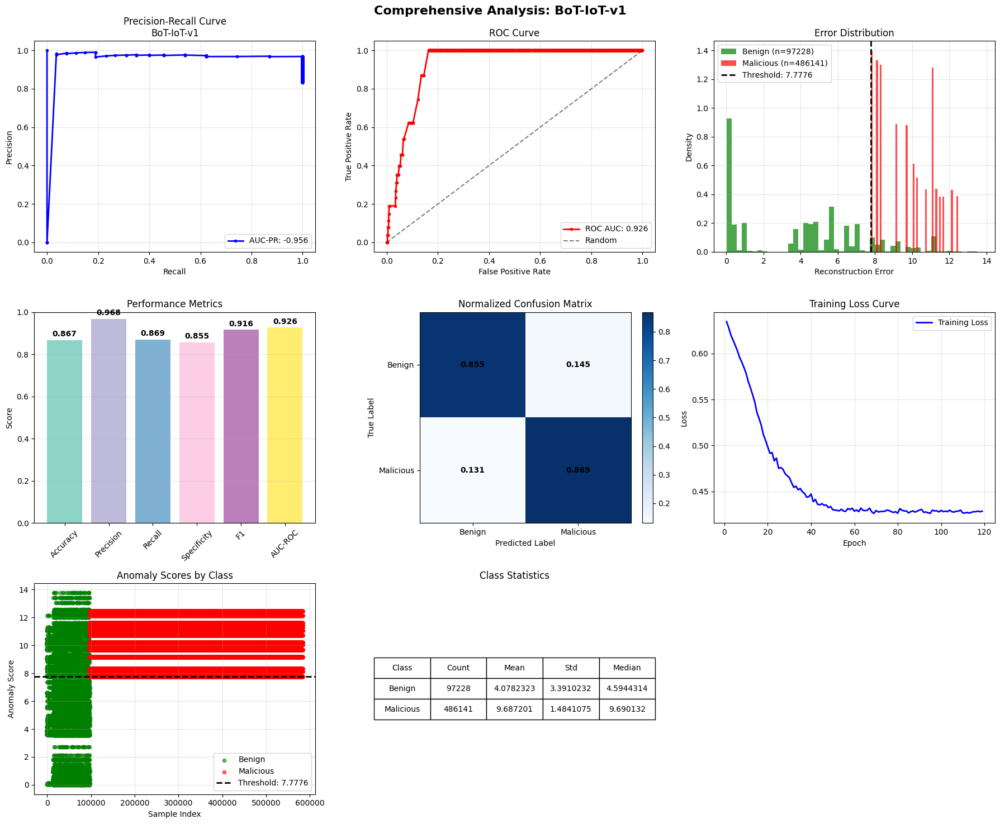

✅ Successfully completed BoT-IoT-v1

FINAL EXPERIMENT SUMMARY
CICIDS-2018-v1:
  F1-Score: 0.0235
  Runtime: 164.3s
  Cost: $0.0205
  Throughput: 3090 samples/sec
UNSW-NB15-v1:
  F1-Score: 0.7856
  Runtime: 10.9s
  Cost: $0.0014
  Throughput: 56067 samples/sec
ToN-IoT-v1:
  F1-Score: 0.8130
  Runtime: 97.9s
  Cost: $0.0122
  Throughput: 5227 samples/sec
BoT-IoT-v1:
  F1-Score: 0.9158
  Runtime: 12.8s
  Cost: $0.0016
  Throughput: 48891 samples/sec

Total Runtime: 4.76 minutes
Total Cost: $0.0357
Average Cost per Dataset: $0.0089


In [18]:
import time

# Cell 2: Main experiment loop with Runtime Metrics
reset_torch()
all_results = {}

# Initialize runtime tracker
runtime_tracker = RuntimeTracker(gpu_cost_per_hour=0.45)  # Kaggle Tesla T4 rate

USE_DYNAMIC_FEATURES = True  # Set to True to enable
DATASETS_TO_RUN = [
    "CICIDS-2018-v1",
    "UNSW-NB15-v1", 
    "ToN-IoT-v1",
    "BoT-IoT-v1"
]

for dataset_name in DATASETS_TO_RUN:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {dataset_name}")
    print(f"{'='*80}")
    
    # Reset timers for each dataset
    runtime_tracker.reset_timers()
    
    config = DATASET_CONFIGS[dataset_name]
    try:
        # Step 1: Load raw data (all columns first)
        df = load_dataset_chunks(
            file_path=config["path"],
            max_rows=1000000,
            required_features=None
        )
        # Quick log transform test - add after loading df
        NUMERIC_COLS_TO_LOG = ['SRC_TO_DST_SECOND_BYTES', 'DST_TO_SRC_SECOND_BYTES', 'DST_TO_SRC_AVG_THROUGHPUT', 
                               'SRC_TO_DST_AVG_THROUGHPUT']
        
        for col in NUMERIC_COLS_TO_LOG:
            if col in df.columns:

                
                df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
                df[col] = np.log1p(df[col])  # log(1+x)
                print(f"Log-transformed {col}")

        # Step 2: Dynamic feature selection (optional)
        if USE_DYNAMIC_FEATURES:
            benign = df[df["Label"] == 0]
            train_split, _ = train_test_split(benign, test_size=0.15, random_state=42)

            excluded_cols = ['IPV4_SRC_ADDR', 'IPV4_DST_ADDR', 'Label', 'Attack']
            all_features = [col for col in df.columns if col not in excluded_cols]

            def top_variance_features(df, columns, top_k):
                return df[columns].var().sort_values(ascending=False).head(top_k).index.tolist()

            top_features = top_variance_features(train_split, all_features, top_k=7)
            node_feat_list = top_features[:4]
            edge_feat_list = top_features[4:7]

            print(f"🔹 Dynamic features for {dataset_name}:")
            print(f"   Node features: {node_feat_list}")
            print(f"   Edge features: {edge_feat_list}")

            config["node_features"] = node_feat_list
            config["edge_features"] = edge_feat_list
        
        # Step 3: Global preprocessing (run before filtering/imbalance fixes)
        df, scaler, label_encoders = preprocess_features(
            train_split, 
            df  # your function should handle split or return just train if not split yet
        )

        # Step 4: Dataset-specific filtering
        df = filter_dataset_for_efficiency(df, dataset_name)
        
        # Debug infinity values
        print(f" Checking for infinity values in {dataset_name}:")
        numeric_cols = df.select_dtypes(include=[np.number]).columns
        inf_found = False
        for col in numeric_cols:
            inf_count = np.isinf(df[col]).sum()
            if inf_count > 0:
                print(f"  {col}: {inf_count} infinity values")
                inf_found = True
        if not inf_found:
            print("  ✅ No infinity values found")
            
        # Step 5: IoT imbalance handling
        df = apply_iot_imbalance_handling(df, dataset_name, feature_cols=config["node_features"] + config["edge_features"])

        # Step 6: Create leakage-free split
        train_ips, test_ips, malicious_ips = create_leakage_free_split(df, test_size=0.15)
        
        # Step 7: Build training graph
        X_train, X_edges_train, edge_index_train, ip_to_idx, edge_to_flows = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"], 
            train_ips=train_ips,
            mode='train'
        )
        
        # *** RUNTIME METRICS: Training starts here (handled inside train_gnn_autoencoder) ***
        # Step 8: Train model
        model, training_losses, scalers = train_gnn_autoencoder(
            X_nodes=X_train,
            X_edges=X_edges_train,
            edge_index=edge_index_train,
            train_ips=train_ips,
            ip_to_idx=ip_to_idx,
            model_params=MODEL_PARAMS,
            gnn_type="GCN"
        )
        
        # Extract training timing from scalers
        train_timing = extract_runtime_from_scalers(scalers)
        
        # *** RUNTIME METRICS: Start inference timer ***
        start_infer = time.time()
        
        # Step 9: Evaluate on full graph
        X_full, X_edges_full, edge_index_full, ip_to_idx_full, _ = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"],
            train_ips=None,
            mode='full'
        )
        
        # Get node errors from model
        model.eval()
        with torch.no_grad():
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            X_full_scaled = scalers['node'].transform(X_full)
            X_full_tensor = torch.tensor(X_full_scaled, dtype=torch.float).to(device)
            edge_index_full = edge_index_full.to(device)
            
            x_hat, edge_hat, z = model(X_full_tensor, edge_index_full)
            node_errors = torch.mean((x_hat - X_full_tensor) ** 2, dim=1).cpu().numpy()
        
        # Step 10: Propagate to flow level
        flow_scores, flow_labels = propagate_node_scores_to_flows(
            df=df, 
            node_errors=node_errors, 
            ip_to_idx=ip_to_idx_full
        )
        
        # Step 11: Threshold selection and evaluation
        threshold = select_threshold(
            mode="f1",
            y_true=flow_labels,
            errors=flow_scores
        )
        
        y_pred = (flow_scores > threshold).astype(int)
        
        metrics = evaluate_model_comprehensive(
            y_true=flow_labels,
            y_pred=y_pred,
            y_scores=flow_scores,
            model_name=f"{dataset_name}-GCN"
        )
        
        # *** RUNTIME METRICS: End inference timer ***
        end_infer = time.time()
        
        # *** RUNTIME METRICS: Calculate comprehensive metrics ***
        if train_timing:
            # Count total samples processed
            total_samples = len(flow_scores) if 'flow_scores' in locals() else len(df)
            
            runtime_metrics = calculate_and_print_runtime_metrics(
                start_train=train_timing['start_train'],
                end_train=train_timing['end_train'],
                start_infer=start_infer,
                end_infer=end_infer,
                total_samples=total_samples,
                results={'threshold': threshold},
                model_name=f"{dataset_name}-GCN"
            )
            
            # Add runtime metrics to results
            metrics['runtime_metrics'] = runtime_metrics
        
        # Step 12: Create visualizations
        create_comprehensive_plots(
            flow_labels=flow_labels,
            flow_scores=flow_scores,
            threshold=threshold,
            metrics=metrics,
            name=dataset_name,
            training_losses=training_losses
        )
        
        all_results[dataset_name] = metrics
        print(f"✅ Successfully completed {dataset_name}")
        
    except Exception as e:
        print(f"❌ Error processing {dataset_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        continue

# Print final summary at the end
print(f"\n{'='*80}")
print("FINAL EXPERIMENT SUMMARY")
print(f"{'='*80}")

total_cost = 0
total_time = 0

for dataset_name, results in all_results.items():
    if 'runtime_metrics' in results:
        runtime = results['runtime_metrics']
        total_cost += runtime['gpu_cost']
        total_time += runtime['train_duration'] + runtime['infer_duration']
        
        print(f"{dataset_name}:")
        print(f"  F1-Score: {results.get('f1', 'N/A'):.4f}")
        print(f"  Runtime: {runtime['train_duration'] + runtime['infer_duration']:.1f}s")
        print(f"  Cost: ${runtime['gpu_cost']:.4f}")
        print(f"  Throughput: {runtime.get('throughput', 0):.0f} samples/sec")

print(f"\nTotal Runtime: {total_time/60:.2f} minutes")
print(f"Total Cost: ${total_cost:.4f}")
print(f"Average Cost per Dataset: ${total_cost/len(all_results):.4f}" if all_results else "No results")

# Dynamic Feature Selection - GCN v2 dataset


EXPERIMENT: CICIDS-2018-v2
Loading dataset from: /kaggle/input/2018cic-v2/b3427ed8ad063a09_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
   Loaded chunk: 20,000 rows (total: 38

<ipython-input-12-4bb7c4303b48>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
<ipython-input-12-4bb7c4303b48>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)


🔹 Dynamic features for CICIDS-2018-v2:
   Node features: ['FLOW_DURATION_MILLISECONDS', 'OUT_BYTES', 'TCP_WIN_MAX_OUT', 'DNS_QUERY_ID']
   Edge features: ['TCP_WIN_MAX_IN', 'ICMP_TYPE', 'L4_SRC_PORT']
🧹 CRITICAL: Handling infinity values BEFORE any processing...
✅ Infinity values handled
📊 Applying log transformations...
  ✅ Log-transformed IN_BYTES
  ✅ Log-transformed OUT_BYTES
  ✅ Log-transformed IN_PKTS
  ✅ Log-transformed OUT_PKTS
  ✅ Log-transformed FLOW_DURATION_MILLISECONDS
  ✅ Log-transformed SRC_TO_DST_SECOND_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat_cols = [c for c in feature_cols if train_df[c].dtype == 'object']
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  num_cols = [c for c in feature_col

  ✅ Log-transformed DST_TO_SRC_SECOND_BYTES
  ✅ Log-transformed RETRANSMITTED_IN_BYTES
  ✅ Log-transformed RETRANSMITTED_OUT_BYTES
  ✅ Log-transformed SRC_TO_DST_AVG_THROUGHPUT
  ✅ Log-transformed DST_TO_SRC_AVG_THROUGHPUT
  ✅ Log-transformed NUM_PKTS_UP_TO_128_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  num_cols = [c for c in feature_cols if train_df[c].dtype != 'object']
/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat_cols = [c for c in feature_col

🔧 Preprocessing 41 features (0 categorical, 41 numerical)
🔧 Handling missing values...
  ✅ Clipped outliers at 0.999 quantile
  ✅ Applied StandardScaler
🔧 Filtering CICIDS-2018-v2 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in CICIDS-2018-v2:
  ✅ No infinity values found
⚖️ Applying imbalance handling for CICIDS-2018-v2...
   Original class distribution:
   Benign: 431,596 (0.863)
   Attack: 68,404 (0.137)
🔨 Constructing leakage-free graph in train mode...
   📊 Training mode: Using 124251 BENIGN flows only
   🎯 Graph nodes: 2000 IPs
   🔗 Graph edges: 107336
Training GNN Autoencoder (GCN)...
🧹 Cleaning infinity values...
✅ Data cleaning completed. Shapes: X_nodes=(2000, 16), X_edges=(107336, 7)
🤖 Model architecture: 16 → 64 → 32
🔥 Starting training...
Epoch   0 | Loss: 1.081346 | Node: 0.976605 | Edge: 1.016468
Epoch  25 | Loss: 0.872106 | Node: 0.768761 | Edge: 1.003119
Epoch  50 | Loss: 0.751820 | Node: 0.649863 | Edge: 0.988618
Epoch  75 

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.1341
   Balanced Accuracy: 0.4806
   Precision:        0.1322
   Recall (TPR):     0.9577
   FPR (FPR):     0.9965
   Specificity (TNR): 0.0035
   F1-Score:         0.2323
   AUC-ROC:          0.0159
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.35      0.00      0.01    431596
   Malicious       0.13      0.96      0.23     68404

    accuracy                           0.13    500000
   macro avg       0.24      0.48      0.12    500000
weighted avg       0.32      0.13      0.04    500000


--- Runtime Metrics for CICIDS-2018-v2-GCN ---
Training Time: 3.97s
Inference Time: 185.98s
Throughput: 2688.41 samples/sec
Estimated GPU Cost: $0.0237
Selected threshold: 3.744283


/kaggle/working/gnn_ids/evaluation/visualizations.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


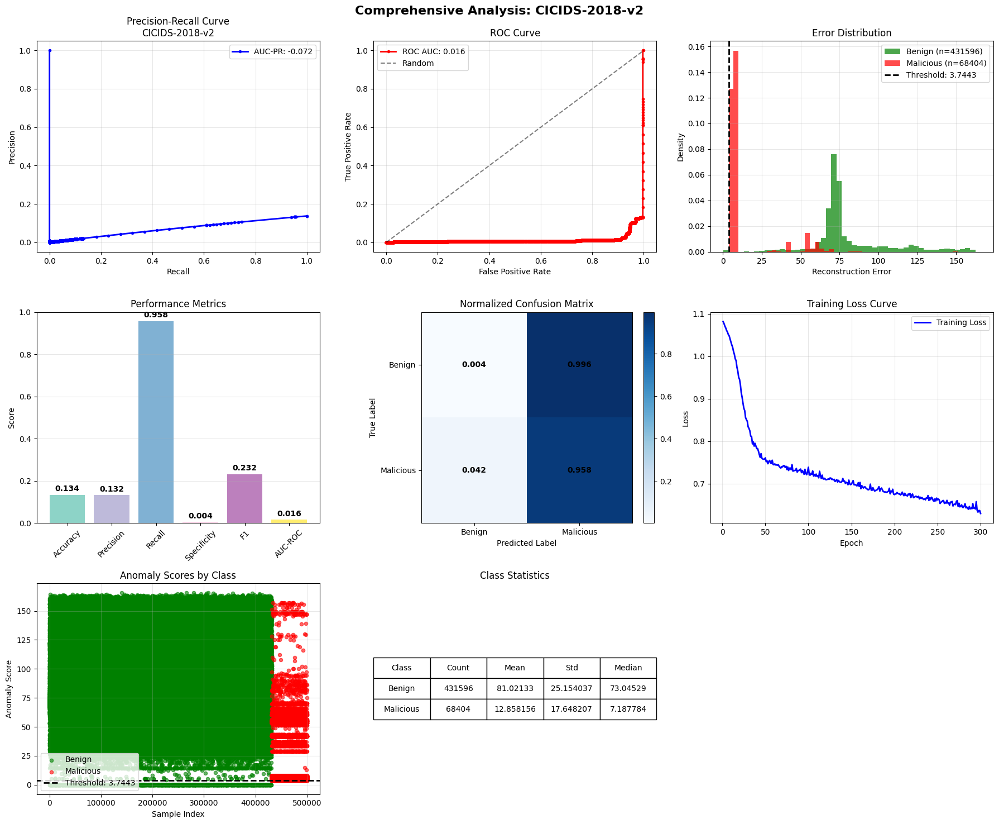

✅ Successfully completed CICIDS-2018-v2

EXPERIMENT: UNSW-NB15-v2
Loading dataset from: /kaggle/input/unsw-v2/fe6cb615d161452c_MOHANAD_A4706/data/NF-UNSW-NB15-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
   Loaded 

<ipython-input-12-4bb7c4303b48>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
<ipython-input-12-4bb7c4303b48>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)


🔹 Dynamic features for UNSW-NB15-v2:
   Node features: ['DNS_TTL_ANSWER', 'FLOW_DURATION_MILLISECONDS', 'OUT_BYTES', 'RETRANSMITTED_OUT_BYTES']
   Edge features: ['IN_BYTES', 'ICMP_TYPE', 'L4_SRC_PORT']
🧹 CRITICAL: Handling infinity values BEFORE any processing...
✅ Infinity values handled
📊 Applying log transformations...
  ✅ Log-transformed IN_BYTES
  ✅ Log-transformed OUT_BYTES
  ✅ Log-transformed IN_PKTS
  ✅ Log-transformed OUT_PKTS
  ✅ Log-transformed FLOW_DURATION_MILLISECONDS


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat_cols = [c for c in feature_cols if train_df[c].dtype == 'object']
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  num_cols = [c for c in feature_col

  ✅ Log-transformed SRC_TO_DST_SECOND_BYTES
  ✅ Log-transformed DST_TO_SRC_SECOND_BYTES
  ✅ Log-transformed RETRANSMITTED_IN_BYTES
  ✅ Log-transformed RETRANSMITTED_OUT_BYTES
  ✅ Log-transformed SRC_TO_DST_AVG_THROUGHPUT
  ✅ Log-transformed DST_TO_SRC_AVG_THROUGHPUT


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat_cols = [c for c in feature_cols if train_df[c].dtype == 'object']
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  num_cols = [c for c in feature_col

  ✅ Log-transformed NUM_PKTS_UP_TO_128_BYTES
🔧 Preprocessing 41 features (0 categorical, 41 numerical)
🔧 Handling missing values...
  ✅ Clipped outliers at 0.999 quantile
  ✅ Applied StandardScaler
🔧 Filtering UNSW-NB15-v2 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in UNSW-NB15-v2:
  ✅ No infinity values found
⚖️ Applying imbalance handling for UNSW-NB15-v2...
   Original class distribution:
   Benign: 498,365 (0.997)
   Attack: 1,635 (0.003)
🔨 Constructing leakage-free graph in train mode...
   📊 Training mode: Using 315629 BENIGN flows only
   🎯 Graph nodes: 41 IPs
   🔗 Graph edges: 258
Training GNN Autoencoder (GCN)...
🧹 Cleaning infinity values...
✅ Data cleaning completed. Shapes: X_nodes=(41, 16), X_edges=(258, 7)
🤖 Model architecture: 16 → 64 → 32
🔥 Starting training...
Epoch   0 | Loss: 1.495994 | Node: 1.390941 | Edge: 1.023409
Epoch  25 | Loss: 0.453580 | Node: 0.352616 | Edge: 0.982165
Epoch  50 | Loss: 0.274696 | Node: 0.176439

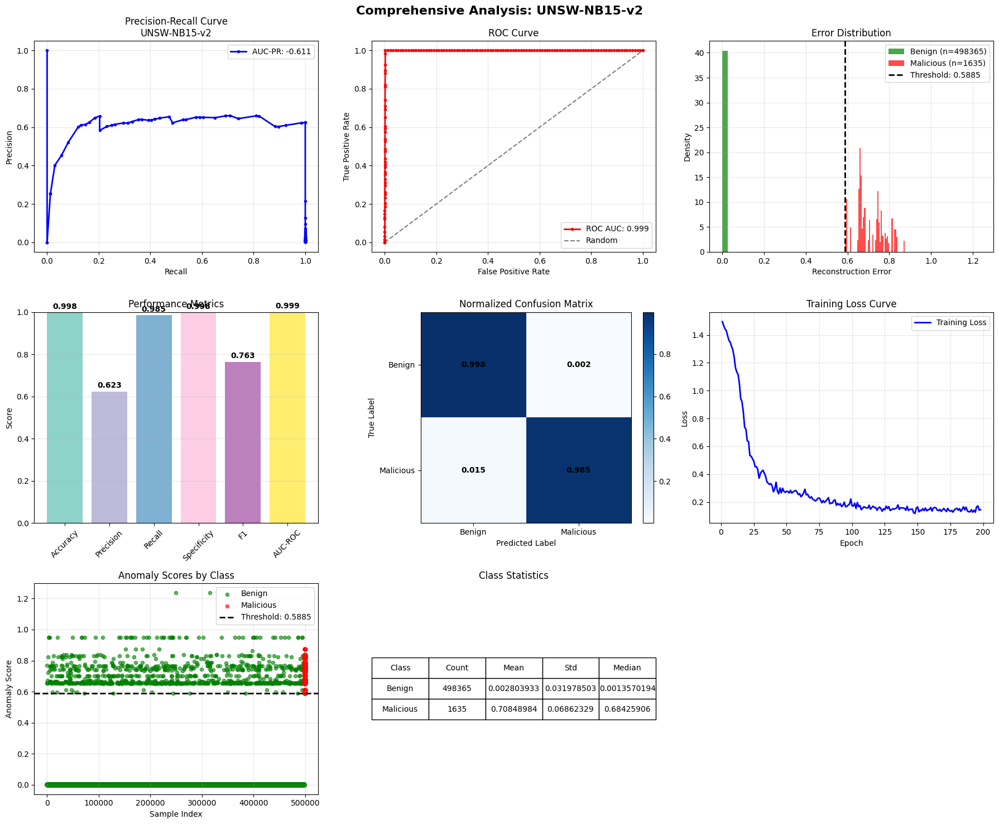

✅ Successfully completed UNSW-NB15-v2

EXPERIMENT: ToN-IoT-v2
Loading dataset from: /kaggle/input/ton-v2/9bafce9d380588c2_MOHANAD_A4706/data/NF-ToN-IoT-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
   Loaded chunk: 

<ipython-input-12-4bb7c4303b48>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
<ipython-input-12-4bb7c4303b48>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)


🔹 Dynamic features for ToN-IoT-v2:
   Node features: ['FLOW_DURATION_MILLISECONDS', 'DNS_TTL_ANSWER', 'OUT_BYTES', 'L4_DST_PORT']
   Edge features: ['L4_SRC_PORT', 'IN_BYTES', 'DNS_QUERY_ID']
🧹 CRITICAL: Handling infinity values BEFORE any processing...
✅ Infinity values handled
📊 Applying log transformations...
  ✅ Log-transformed IN_BYTES
  ✅ Log-transformed OUT_BYTES
  ✅ Log-transformed IN_PKTS
  ✅ Log-transformed OUT_PKTS
  ✅ Log-transformed FLOW_DURATION_MILLISECONDS
  ✅ Log-transformed SRC_TO_DST_SECOND_BYTES
  ✅ Log-transformed DST_TO_SRC_SECOND_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat_cols = [c for c in feature_cols if train_df[c].dtype == 'object']
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  num_cols = [c for c in feature_col

  ✅ Log-transformed RETRANSMITTED_IN_BYTES
  ✅ Log-transformed RETRANSMITTED_OUT_BYTES
  ✅ Log-transformed SRC_TO_DST_AVG_THROUGHPUT
  ✅ Log-transformed DST_TO_SRC_AVG_THROUGHPUT
  ✅ Log-transformed NUM_PKTS_UP_TO_128_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat_cols = [c for c in feature_cols if train_df[c].dtype == 'object']
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  num_cols = [c for c in feature_col

🔧 Preprocessing 41 features (0 categorical, 41 numerical)
🔧 Handling missing values...
  ✅ Clipped outliers at 0.999 quantile
  ✅ Applied StandardScaler
🔧 Filtering ToN-IoT-v2 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in ToN-IoT-v2:
  ✅ No infinity values found
⚖️ Applying imbalance handling for ToN-IoT-v2...
   Original class distribution:
   Benign: 602,567 (0.603)
   Attack: 397,433 (0.397)
🔨 Constructing leakage-free graph in train mode...
   📊 Training mode: Using 6 BENIGN flows only
   🎯 Graph nodes: 405 IPs
   🔗 Graph edges: 4
Training GNN Autoencoder (GCN)...
🧹 Cleaning infinity values...
✅ Data cleaning completed. Shapes: X_nodes=(405, 16), X_edges=(4, 7)
🤖 Model architecture: 16 → 64 → 32
🔥 Starting training...
Epoch   0 | Loss: 2.767290 | Node: 2.548605 | Edge: 2.160784
Epoch  25 | Loss: 1.164425 | Node: 1.042785 | Edge: 1.210517
Epoch  50 | Loss: 0.694649 | Node: 0.604999 | Edge: 0.891822
Epoch  75 | Loss: 0.647137 | Node: 0.5

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.5681
   Balanced Accuracy: 0.6160
   Precision:        0.4757
   Recall (TPR):     0.8496
   FPR (FPR):     0.6176
   Specificity (TNR): 0.3824
   F1-Score:         0.6099
   AUC-ROC:          0.5765
   MCC:              46.2703

Classification Report:
              precision    recall  f1-score   support

      Benign       0.79      0.38      0.52    602567
   Malicious       0.48      0.85      0.61    397433

    accuracy                           0.57   1000000
   macro avg       0.63      0.62      0.56   1000000
weighted avg       0.67      0.57      0.55   1000000


--- Runtime Metrics for ToN-IoT-v2-GCN ---
Training Time: 0.93s
Inference Time: 53.93s
Throughput: 18542.19 samples/sec
Estimated GPU Cost: $0.0069
Selected threshold: 2622481889783092423472902335102976.000000


/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:152: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)
/kaggle/working/gnn_ids/evaluation/visualizations.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


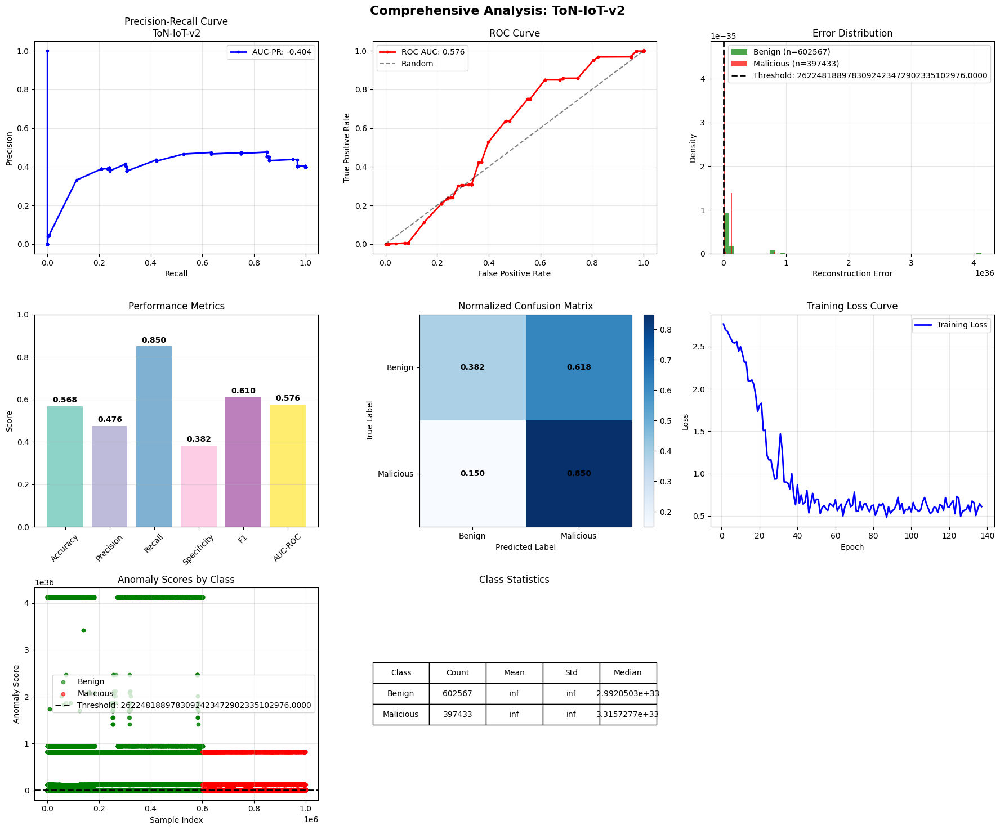

✅ Successfully completed ToN-IoT-v2

EXPERIMENT: BoT-IoT-v2
Loading dataset from: /kaggle/input/bot-v2/befb58edf3428167_MOHANAD_A4706/data/NF-BoT-IoT-v2.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
   Loaded chunk: 20

<ipython-input-12-4bb7c4303b48>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
<ipython-input-12-4bb7c4303b48>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)


✅ Infinity values handled
📊 Applying log transformations...
  ✅ Log-transformed IN_BYTES
  ✅ Log-transformed OUT_BYTES
  ✅ Log-transformed IN_PKTS
  ✅ Log-transformed OUT_PKTS
  ✅ Log-transformed FLOW_DURATION_MILLISECONDS
  ✅ Log-transformed SRC_TO_DST_SECOND_BYTES
  ✅ Log-transformed DST_TO_SRC_SECOND_BYTES
  ✅ Log-transformed RETRANSMITTED_IN_BYTES
  ✅ Log-transformed RETRANSMITTED_OUT_BYTES
  ✅ Log-transformed SRC_TO_DST_AVG_THROUGHPUT


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat_cols = [c for c in feature_cols if train_df[c].dtype == 'object']
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  num_cols = [c for c in feature_col

  ✅ Log-transformed DST_TO_SRC_AVG_THROUGHPUT
  ✅ Log-transformed NUM_PKTS_UP_TO_128_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat_cols = [c for c in feature_cols if train_df[c].dtype == 'object']
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  num_cols = [c for c in feature_col

🔧 Preprocessing 41 features (0 categorical, 41 numerical)
🔧 Handling missing values...
  ✅ Clipped outliers at 0.999 quantile
  ✅ Applied StandardScaler
🔧 Filtering BoT-IoT-v2 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in BoT-IoT-v2:
  ✅ No infinity values found
⚖️ Applying imbalance handling for BoT-IoT-v2...
   Original class distribution:
   Benign: 3,580 (0.007)
   Attack: 496,420 (0.993)
   🚨 Extreme imbalance detected - applying oversampling...
   Using SMOTE for moderate imbalance...
   ✅ Oversampling completed: 595,704 rows
🔨 Constructing leakage-free graph in train mode...
   📊 Training mode: Using 22052 BENIGN flows only
   🎯 Graph nodes: 61 IPs
   🔗 Graph edges: 360
Training GNN Autoencoder (GCN)...
🧹 Cleaning infinity values...
✅ Data cleaning completed. Shapes: X_nodes=(61, 16), X_edges=(360, 7)
🤖 Model architecture: 16 → 64 → 32
🔥 Starting training...
Epoch   0 | Loss: 0.739490 | Node: 0.631015 | Edge: 1.036689
Epoch  25 | Lo

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9585
   Balanced Accuracy: 0.9334
   Precision:        0.9790
   Recall (TPR):     0.9711
   FPR (FPR):     0.1043
   Specificity (TNR): 0.8957
   F1-Score:         0.9750
   AUC-ROC:          0.9519
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.86      0.90      0.88     99284
   Malicious       0.98      0.97      0.98    496420

    accuracy                           0.96    595704
   macro avg       0.92      0.93      0.93    595704
weighted avg       0.96      0.96      0.96    595704


--- Runtime Metrics for BoT-IoT-v2-GCN ---
Training Time: 1.22s
Inference Time: 6.41s
Throughput: 92866.47 samples/sec
Estimated GPU Cost: $0.0010
Selected threshold: 74.352470


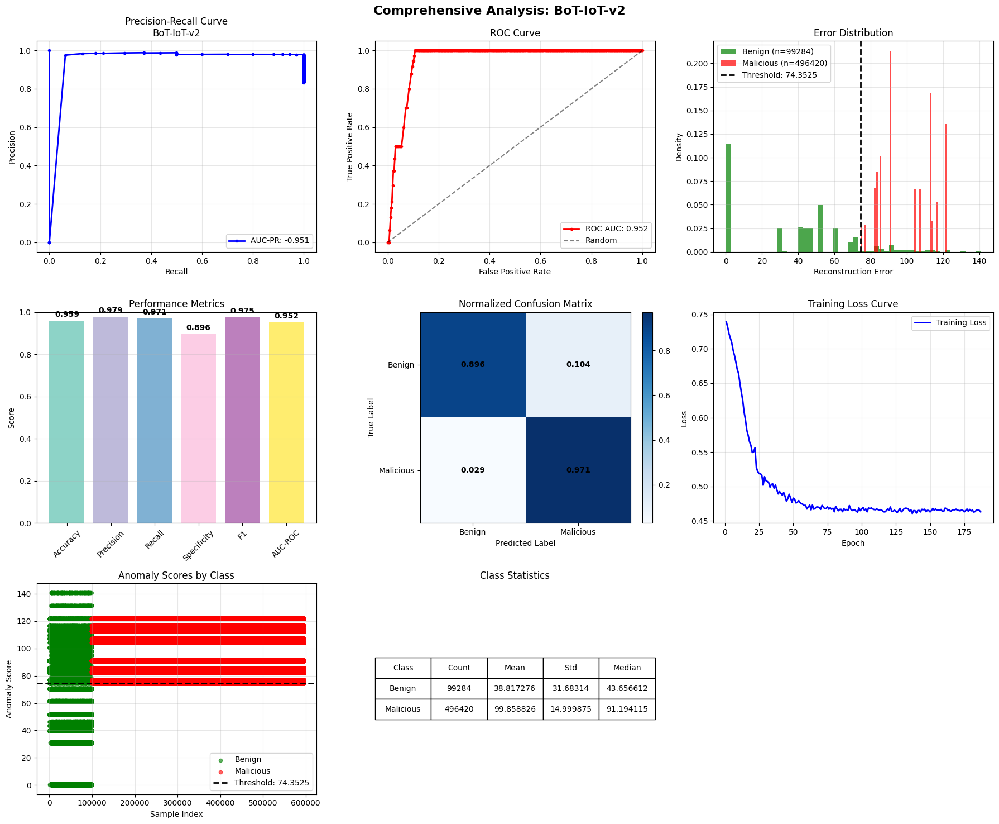

✅ Successfully completed BoT-IoT-v2

FINAL EXPERIMENT SUMMARY
CICIDS-2018-v2:
  F1-Score: 0.2323
  Runtime: 190.0s
  Cost: $0.0237
  Throughput: 2688 samples/sec
UNSW-NB15-v2:
  F1-Score: 0.7629
  Runtime: 10.5s
  Cost: $0.0013
  Throughput: 54285 samples/sec
ToN-IoT-v2:
  F1-Score: 0.6099
  Runtime: 54.9s
  Cost: $0.0069
  Throughput: 18542 samples/sec
BoT-IoT-v2:
  F1-Score: 0.9750
  Runtime: 7.6s
  Cost: $0.0010
  Throughput: 92866 samples/sec

Total Runtime: 4.38 minutes
Total Cost: $0.0329
Average Cost per Dataset: $0.0082


In [12]:
import time

# Cell 2: Main experiment loop with Runtime Metrics
reset_torch()
all_results = {}

# Initialize runtime tracker
runtime_tracker = RuntimeTracker(gpu_cost_per_hour=0.45)  # Kaggle Tesla T4 rate

USE_DYNAMIC_FEATURES = True  # Set to True to enable
DATASETS_TO_RUN = [
    "CICIDS-2018-v2",
    "UNSW-NB15-v2", 
    "ToN-IoT-v2",
    "BoT-IoT-v2"
]

for dataset_name in DATASETS_TO_RUN:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {dataset_name}")
    print(f"{'='*80}")
    
    # Reset timers for each dataset
    runtime_tracker.reset_timers()
    
    config = DATASET_CONFIGS[dataset_name]
    try:
        # Step 1: Load raw data (all columns first)
        df = load_dataset_chunks(
            file_path=config["path"],
            max_rows=1000000,
            required_features=None
        )
        # Quick log transform test - add after loading df
        NUMERIC_COLS_TO_LOG = ['SRC_TO_DST_SECOND_BYTES', 'DST_TO_SRC_SECOND_BYTES', 'DST_TO_SRC_AVG_THROUGHPUT', 
                               'SRC_TO_DST_AVG_THROUGHPUT']
        
        for col in NUMERIC_COLS_TO_LOG:
            if col in df.columns:

                
                df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
                df[col] = np.log1p(df[col])  # log(1+x)
                print(f"Log-transformed {col}")

        # Step 2: Dynamic feature selection (optional)
        if USE_DYNAMIC_FEATURES:
            benign = df[df["Label"] == 0]
            train_split, _ = train_test_split(benign, test_size=0.15, random_state=42)

            excluded_cols = ['IPV4_SRC_ADDR', 'IPV4_DST_ADDR', 'Label', 'Attack']
            all_features = [col for col in df.columns if col not in excluded_cols]

            def top_variance_features(df, columns, top_k):
                return df[columns].var().sort_values(ascending=False).head(top_k).index.tolist()

            top_features = top_variance_features(train_split, all_features, top_k=7)
            node_feat_list = top_features[:4]
            edge_feat_list = top_features[4:7]

            print(f"🔹 Dynamic features for {dataset_name}:")
            print(f"   Node features: {node_feat_list}")
            print(f"   Edge features: {edge_feat_list}")

            config["node_features"] = node_feat_list
            config["edge_features"] = edge_feat_list
        
        # Step 3: Global preprocessing (run before filtering/imbalance fixes)
        df, scaler, label_encoders = preprocess_features(
            train_split, 
            df  # your function should handle split or return just train if not split yet
        )

        # Step 4: Dataset-specific filtering
        df = filter_dataset_for_efficiency(df, dataset_name)
        
        # Debug infinity values
        print(f" Checking for infinity values in {dataset_name}:")
        numeric_cols = df.select_dtypes(include=[np.number]).columns
        inf_found = False
        for col in numeric_cols:
            inf_count = np.isinf(df[col]).sum()
            if inf_count > 0:
                print(f"  {col}: {inf_count} infinity values")
                inf_found = True
        if not inf_found:
            print("  ✅ No infinity values found")
            
        # Step 5: IoT imbalance handling
        df = apply_iot_imbalance_handling(df, dataset_name, feature_cols=config["node_features"] + config["edge_features"])

        # Step 6: Create leakage-free split
        train_ips, test_ips, malicious_ips = create_leakage_free_split(df, test_size=0.15)
        
        # Step 7: Build training graph
        X_train, X_edges_train, edge_index_train, ip_to_idx, edge_to_flows = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"], 
            train_ips=train_ips,
            mode='train'
        )
        
        # *** RUNTIME METRICS: Training starts here (handled inside train_gnn_autoencoder) ***
        # Step 8: Train model
        model, training_losses, scalers = train_gnn_autoencoder(
            X_nodes=X_train,
            X_edges=X_edges_train,
            edge_index=edge_index_train,
            train_ips=train_ips,
            ip_to_idx=ip_to_idx,
            model_params=MODEL_PARAMS,
            gnn_type="GCN"
        )
        
        # Extract training timing from scalers
        train_timing = extract_runtime_from_scalers(scalers)
        
        # *** RUNTIME METRICS: Start inference timer ***
        start_infer = time.time()
        
        # Step 9: Evaluate on full graph
        X_full, X_edges_full, edge_index_full, ip_to_idx_full, _ = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"],
            train_ips=None,
            mode='full'
        )
        
        # Get node errors from model
        model.eval()
        with torch.no_grad():
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            X_full_scaled = scalers['node'].transform(X_full)
            X_full_tensor = torch.tensor(X_full_scaled, dtype=torch.float).to(device)
            edge_index_full = edge_index_full.to(device)
            
            x_hat, edge_hat, z = model(X_full_tensor, edge_index_full)
            node_errors = torch.mean((x_hat - X_full_tensor) ** 2, dim=1).cpu().numpy()
        
        # Step 10: Propagate to flow level
        flow_scores, flow_labels = propagate_node_scores_to_flows(
            df=df, 
            node_errors=node_errors, 
            ip_to_idx=ip_to_idx_full
        )
        
        # Step 11: Threshold selection and evaluation
        threshold = select_threshold(
            mode="f1",
            y_true=flow_labels,
            errors=flow_scores
        )
        
        y_pred = (flow_scores > threshold).astype(int)
        
        metrics = evaluate_model_comprehensive(
            y_true=flow_labels,
            y_pred=y_pred,
            y_scores=flow_scores,
            model_name=f"{dataset_name}-GCN"
        )
        
        # *** RUNTIME METRICS: End inference timer ***
        end_infer = time.time()
        
        # *** RUNTIME METRICS: Calculate comprehensive metrics ***
        if train_timing:
            # Count total samples processed
            total_samples = len(flow_scores) if 'flow_scores' in locals() else len(df)
            
            runtime_metrics = calculate_and_print_runtime_metrics(
                start_train=train_timing['start_train'],
                end_train=train_timing['end_train'],
                start_infer=start_infer,
                end_infer=end_infer,
                total_samples=total_samples,
                results={'threshold': threshold},
                model_name=f"{dataset_name}-GCN"
            )
            
            # Add runtime metrics to results
            metrics['runtime_metrics'] = runtime_metrics
        
        # Step 12: Create visualizations
        create_comprehensive_plots(
            flow_labels=flow_labels,
            flow_scores=flow_scores,
            threshold=threshold,
            metrics=metrics,
            name=dataset_name,
            training_losses=training_losses
        )
        
        all_results[dataset_name] = metrics
        print(f"✅ Successfully completed {dataset_name}")
        
    except Exception as e:
        print(f"❌ Error processing {dataset_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        continue

# Print final summary at the end
print(f"\n{'='*80}")
print("FINAL EXPERIMENT SUMMARY")
print(f"{'='*80}")

total_cost = 0
total_time = 0

for dataset_name, results in all_results.items():
    if 'runtime_metrics' in results:
        runtime = results['runtime_metrics']
        total_cost += runtime['gpu_cost']
        total_time += runtime['train_duration'] + runtime['infer_duration']
        
        print(f"{dataset_name}:")
        print(f"  F1-Score: {results.get('f1', 'N/A'):.4f}")
        print(f"  Runtime: {runtime['train_duration'] + runtime['infer_duration']:.1f}s")
        print(f"  Cost: ${runtime['gpu_cost']:.4f}")
        print(f"  Throughput: {runtime.get('throughput', 0):.0f} samples/sec")

print(f"\nTotal Runtime: {total_time/60:.2f} minutes")
print(f"Total Cost: ${total_cost:.4f}")
print(f"Average Cost per Dataset: ${total_cost/len(all_results):.4f}" if all_results else "No results")

# Dynamic Feature Selection - GCN v3 dataset


EXPERIMENT: CICIDS-2018-v3
Loading dataset from: /kaggle/input/cic-nf-v3/f78acbaa2afe1595_NFV3DATA-A11964_A11964/data/NF-CICIDS2018-v3.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
   Loaded chunk: 20,000 rows (total:

<ipython-input-17-a42f92e313e6>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
<ipython-input-17-a42f92e313e6>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
<ipython-input-17-a42f92e313

🔹 Dynamic features for CICIDS-2018-v3:
   Node features: ['FLOW_END_MILLISECONDS', 'FLOW_START_MILLISECONDS', 'OUT_BYTES', 'FLOW_DURATION_MILLISECONDS']
   Edge features: ['DURATION_IN', 'DURATION_OUT', 'IN_BYTES']
 CRITICAL: Handling infinity values BEFORE any processing...
 Infinity values handled
 Applying log transformations...
   Log-transformed IN_BYTES
   Log-transformed OUT_BYTES
   Log-transformed IN_PKTS
   Log-transformed OUT_PKTS
   Log-transformed FLOW_DURATION_MILLISECONDS
   Log-transformed SRC_TO_DST_SECOND_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kag

   Log-transformed DST_TO_SRC_SECOND_BYTES
   Log-transformed RETRANSMITTED_IN_BYTES
   Log-transformed RETRANSMITTED_OUT_BYTES
   Log-transformed SRC_TO_DST_AVG_THROUGHPUT
   Log-transformed DST_TO_SRC_AVG_THROUGHPUT
   Log-transformed NUM_PKTS_UP_TO_128_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kag

 Preprocessing 51 features (0 categorical, 51 numerical)
 Handling missing values...
   Clipped outliers at 0.999 quantile
   Applied StandardScaler
 Filtering CICIDS-2018-v3 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in CICIDS-2018-v3:
  ✅ No infinity values found
 Applying imbalance handling for CICIDS-2018-v3...
   Original class distribution:
   Benign: 325,117 (0.650)
   Attack: 174,883 (0.350)
 Constructing leakage-free graph in train mode...
    Training mode: Using 254595 BENIGN flows only
    Graph nodes: 2000 IPs
    Graph edges: 54592
Training GNN Autoencoder (GCN)...
 Cleaning infinity values...
 Data cleaning completed. Shapes: X_nodes=(2000, 16), X_edges=(54592, 7)
Model architecture: 16 → 64 → 32
 Starting training...
Epoch   0 | Loss: 1.094065 | Node: 0.988098 | Edge: 1.016289
Epoch  25 | Loss: 0.999670 | Node: 0.894734 | Edge: 1.004187
Epoch  50 | Loss: 0.941190 | Node: 0.837344 | Edge: 0.998132
Epoch  75 | Loss: 0.904746 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

      Benign       0.65      1.00      0.79    325117
   Malicious       0.00      0.00      0.00    174883

    accuracy                           0.65    500000
   macro avg       0.33      0.50      0.39    500000
weighted avg       0.42      0.65      0.51    500000


--- Runtime Metrics for CICIDS-2018-v3-GCN ---
Training Time: 2.68s
Inference Time: 175.25s
Throughput: 2853.04 samples/sec
Estimated GPU Cost: $0.0222
Selected threshold: 32.844418


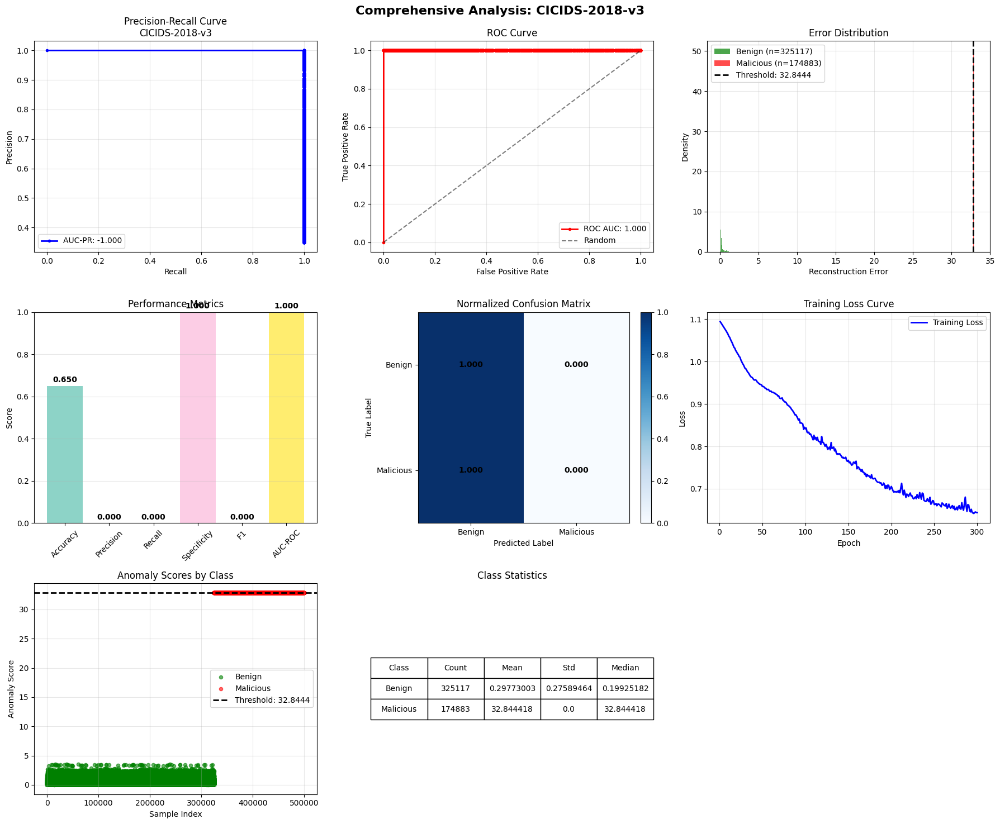

✅ Successfully completed CICIDS-2018-v3

EXPERIMENT: UNSW-NB15-v3
Loading dataset from: /kaggle/input/unsw-v3/f7546561558c07c5_NFV3DATA-A11964_A11964/data/NF-UNSW-NB15-v3.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
 

/usr/local/lib/python3.10/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater_equal
  return op(a, b)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-17-a42f92e313e6>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)


🔹 Dynamic features for UNSW-NB15-v3:
   Node features: ['FLOW_START_MILLISECONDS', 'FLOW_END_MILLISECONDS', 'DNS_TTL_ANSWER', 'OUT_BYTES']
   Edge features: ['RETRANSMITTED_OUT_BYTES', 'ICMP_TYPE', 'L4_SRC_PORT']
 CRITICAL: Handling infinity values BEFORE any processing...
  Fixing 28233 infinity values in SRC_TO_DST_SECOND_BYTES
  Fixing 72710 infinity values in DST_TO_SRC_SECOND_BYTES
 Infinity values handled
 Applying log transformations...
   Log-transformed IN_BYTES
   Log-transformed OUT_BYTES
   Log-transformed IN_PKTS
   Log-transformed OUT_PKTS
   Log-transformed FLOW_DURATION_MILLISECONDS


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kag

   Log-transformed SRC_TO_DST_SECOND_BYTES
   Log-transformed DST_TO_SRC_SECOND_BYTES
   Log-transformed RETRANSMITTED_IN_BYTES
   Log-transformed RETRANSMITTED_OUT_BYTES
   Log-transformed SRC_TO_DST_AVG_THROUGHPUT
   Log-transformed DST_TO_SRC_AVG_THROUGHPUT


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kag

   Log-transformed NUM_PKTS_UP_TO_128_BYTES
 Preprocessing 51 features (0 categorical, 51 numerical)
 Handling missing values...
   Clipped outliers at 0.999 quantile
   Applied StandardScaler
 Filtering UNSW-NB15-v3 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in UNSW-NB15-v3:
  ✅ No infinity values found
 Applying imbalance handling for UNSW-NB15-v3...
   Original class distribution:
   Benign: 455,312 (0.911)
   Attack: 44,688 (0.089)
 Constructing leakage-free graph in train mode...
    Training mode: Using 287808 BENIGN flows only
    Graph nodes: 42 IPs
    Graph edges: 188
Training GNN Autoencoder (GCN)...
 Cleaning infinity values...
 Data cleaning completed. Shapes: X_nodes=(42, 16), X_edges=(188, 7)
Model architecture: 16 → 64 → 32
 Starting training...
Epoch   0 | Loss: 1.320945 | Node: 1.215274 | Edge: 1.026983
Epoch  25 | Loss: 0.525983 | Node: 0.425044 | Edge: 0.976334
Epoch  50 | Loss: 0.240237 | Node: 0.147916 | Edge: 0.89757

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9782
   Balanced Accuracy: 0.9753
   Precision:        0.8186
   Recall (TPR):     0.9718
   FPR (FPR):     0.0211
   Specificity (TNR): 0.9789
   F1-Score:         0.8886
   AUC-ROC:          0.9826
   MCC:              11.4264

Classification Report:
              precision    recall  f1-score   support

      Benign       1.00      0.98      0.99    455312
   Malicious       0.82      0.97      0.89     44688

    accuracy                           0.98    500000
   macro avg       0.91      0.98      0.94    500000
weighted avg       0.98      0.98      0.98    500000


--- Runtime Metrics for UNSW-NB15-v3-GCN ---
Training Time: 1.47s
Inference Time: 10.04s
Throughput: 49780.80 samples/sec
Estimated GPU Cost: $0.0014
Selected threshold: 155.500000


/kaggle/working/gnn_ids/evaluation/visualizations.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


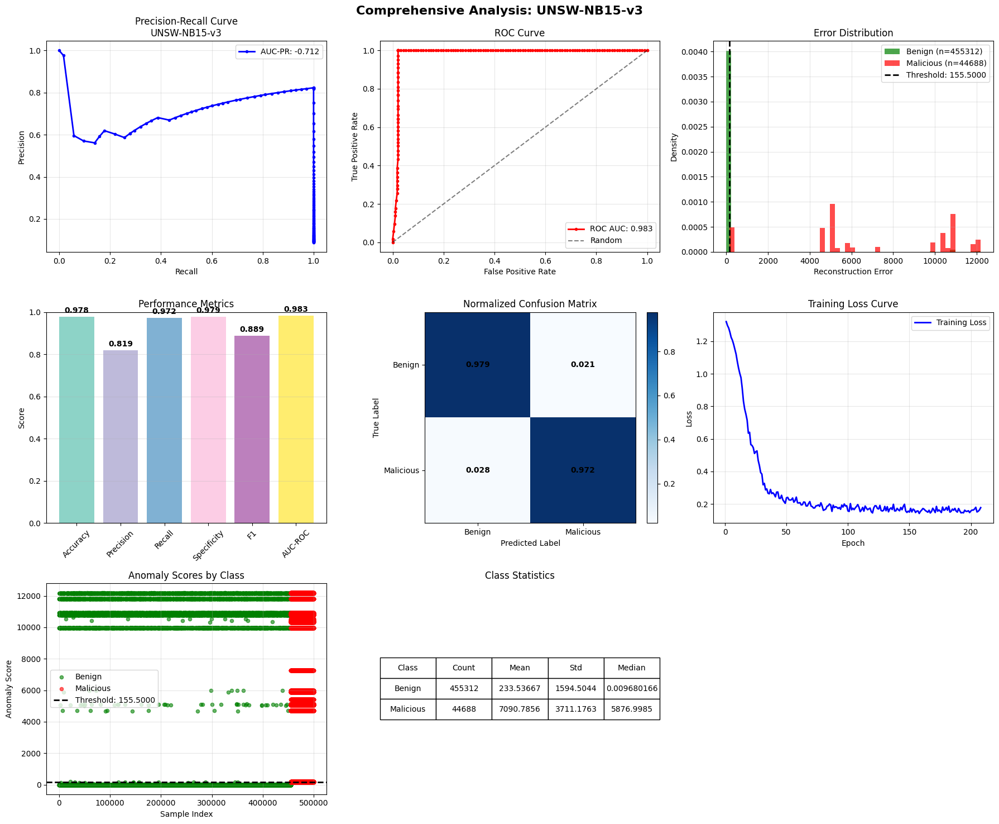

✅ Successfully completed UNSW-NB15-v3

EXPERIMENT: ToN-IoT-v3
Loading dataset from: /kaggle/input/ton-v3/02934b58528a226b_NFV3DATA-A11964_A11964/data/NF-ToN-IoT-v3.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
   Loade

<ipython-input-17-a42f92e313e6>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
<ipython-input-17-a42f92e313e6>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
<ipython-input-17-a42f92e313

🔹 Dynamic features for ToN-IoT-v3:
   Node features: ['FLOW_START_MILLISECONDS', 'FLOW_END_MILLISECONDS', 'DNS_TTL_ANSWER', 'L4_SRC_PORT']
   Edge features: ['L4_DST_PORT', 'DNS_QUERY_ID', 'TCP_WIN_MAX_OUT']
 CRITICAL: Handling infinity values BEFORE any processing...
 Infinity values handled
 Applying log transformations...
   Log-transformed IN_BYTES
   Log-transformed OUT_BYTES
   Log-transformed IN_PKTS
   Log-transformed OUT_PKTS
   Log-transformed FLOW_DURATION_MILLISECONDS
   Log-transformed SRC_TO_DST_SECOND_BYTES
   Log-transformed DST_TO_SRC_SECOND_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kag

   Log-transformed RETRANSMITTED_IN_BYTES
   Log-transformed RETRANSMITTED_OUT_BYTES
   Log-transformed SRC_TO_DST_AVG_THROUGHPUT
   Log-transformed DST_TO_SRC_AVG_THROUGHPUT
   Log-transformed NUM_PKTS_UP_TO_128_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kag

 Preprocessing 51 features (0 categorical, 51 numerical)
 Handling missing values...
   Clipped outliers at 0.999 quantile
   Applied StandardScaler
 Filtering ToN-IoT-v3 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in ToN-IoT-v3:
  ✅ No infinity values found
 Applying imbalance handling for ToN-IoT-v3...
   Original class distribution:
   Benign: 750,311 (0.750)
   Attack: 249,689 (0.250)
 Constructing leakage-free graph in train mode...
    Training mode: Using 72 BENIGN flows only
    Graph nodes: 333 IPs
    Graph edges: 8
Training GNN Autoencoder (GCN)...
 Cleaning infinity values...
 Data cleaning completed. Shapes: X_nodes=(333, 16), X_edges=(8, 7)
Model architecture: 16 → 64 → 32
 Starting training...
Epoch   0 | Loss: 4.194690 | Node: 3.990902 | Edge: 2.007276
Epoch  25 | Loss: 1.246714 | Node: 1.152275 | Edge: 0.931970
Epoch  50 | Loss: 0.841419 | Node: 0.746137 | Edge: 0.927051
Epoch  75 | Loss: 0.707828 | Node: 0.628328 | Edge: 0

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.2501
   Balanced Accuracy: 0.5003
   Precision:        0.2498
   Recall (TPR):     1.0000
   FPR (FPR):     0.9995
   Specificity (TNR): 0.0005
   F1-Score:         0.3997
   AUC-ROC:          0.3040
   MCC:              0.0626

Classification Report:
              precision    recall  f1-score   support

      Benign       0.99      0.00      0.00    750311
   Malicious       0.25      1.00      0.40    249689

    accuracy                           0.25   1000000
   macro avg       0.62      0.50      0.20   1000000
weighted avg       0.81      0.25      0.10   1000000


--- Runtime Metrics for ToN-IoT-v3-GCN ---
Training Time: 2.13s
Inference Time: 52.88s
Throughput: 18910.89 samples/sec
Estimated GPU Cost: $0.0069
Selected threshold: 105640744806985085051424290635776.000000


/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:152: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True, where=where)


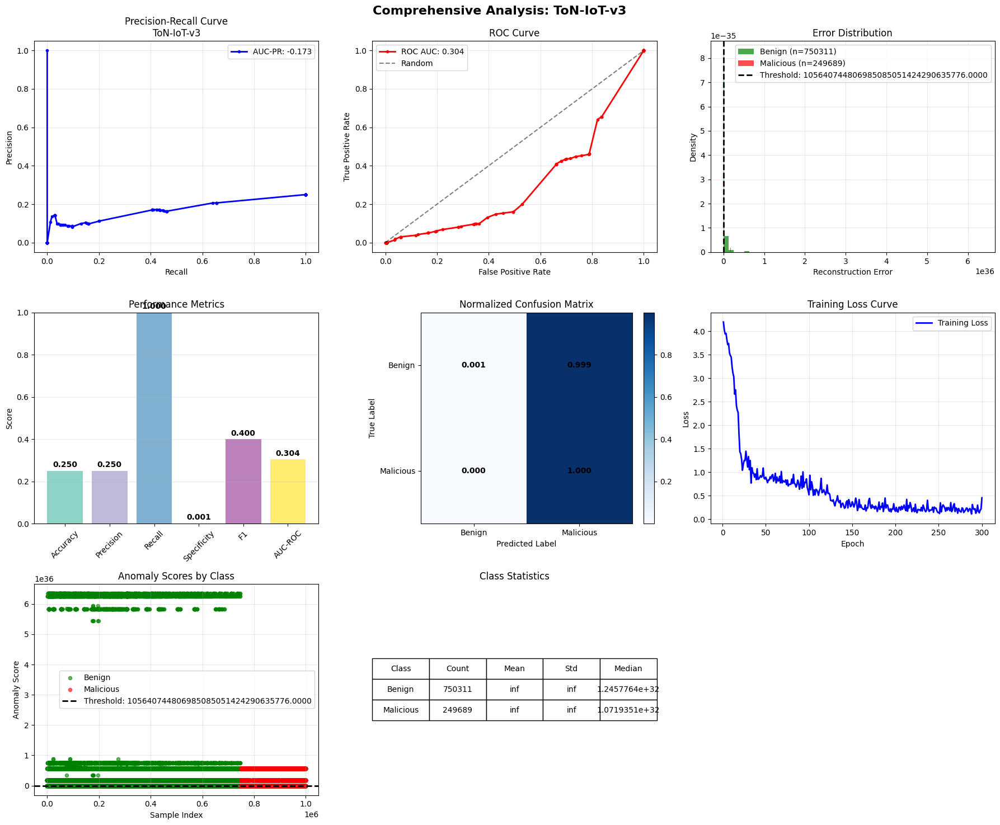

✅ Successfully completed ToN-IoT-v3

EXPERIMENT: BoT-IoT-v3
Loading dataset from: /kaggle/input/bot-v3/d509c9db7490cf92_NFV3DATA-A11964_A11964/data/NF-BoT-IoT-v3.csv
   Loaded chunk: 20,000 rows (total: 20,000)
   Loaded chunk: 20,000 rows (total: 40,000)
   Loaded chunk: 20,000 rows (total: 60,000)
   Loaded chunk: 20,000 rows (total: 80,000)
   Loaded chunk: 20,000 rows (total: 100,000)
   Loaded chunk: 20,000 rows (total: 120,000)
   Loaded chunk: 20,000 rows (total: 140,000)
   Loaded chunk: 20,000 rows (total: 160,000)
   Loaded chunk: 20,000 rows (total: 180,000)
   Loaded chunk: 20,000 rows (total: 200,000)
   Loaded chunk: 20,000 rows (total: 220,000)
   Loaded chunk: 20,000 rows (total: 240,000)
   Loaded chunk: 20,000 rows (total: 260,000)
   Loaded chunk: 20,000 rows (total: 280,000)
   Loaded chunk: 20,000 rows (total: 300,000)
   Loaded chunk: 20,000 rows (total: 320,000)
   Loaded chunk: 20,000 rows (total: 340,000)
   Loaded chunk: 20,000 rows (total: 360,000)
   Loaded 

/usr/local/lib/python3.10/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater_equal
  return op(a, b)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-17-a42f92e313e6>:42: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)


  Fixing 145 infinity values in SRC_TO_DST_SECOND_BYTES
  Fixing 36984 infinity values in DST_TO_SRC_SECOND_BYTES
 Infinity values handled
 Applying log transformations...
   Log-transformed IN_BYTES
   Log-transformed OUT_BYTES
   Log-transformed IN_PKTS
   Log-transformed OUT_PKTS
   Log-transformed FLOW_DURATION_MILLISECONDS
   Log-transformed SRC_TO_DST_SECOND_BYTES
   Log-transformed DST_TO_SRC_SECOND_BYTES
   Log-transformed RETRANSMITTED_IN_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)
/kag

   Log-transformed RETRANSMITTED_OUT_BYTES
   Log-transformed SRC_TO_DST_AVG_THROUGHPUT
   Log-transformed DST_TO_SRC_AVG_THROUGHPUT
   Log-transformed NUM_PKTS_UP_TO_128_BYTES


/kaggle/working/gnn_ids/data/preprocessing.py:66: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
/kaggle/working/gnn_ids/data/preprocessing.py:67: FutureWarning: Downcasting behavior in Series and DataFrame methods 'where', 'mask', and 'clip' is deprecated. In a future version this will not infer object dtypes or cast all-round floats to integers. Instead call result.infer_objects(copy=False) for object inference, or cast round floats explicitly. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[col] = train_df[col].clip(lower=1e-10)


 Preprocessing 51 features (0 categorical, 51 numerical)
 Handling missing values...
   Clipped outliers at 0.999 quantile
   Applied StandardScaler
 Filtering BoT-IoT-v3 dataset for efficiency...
   Original size: 1,000,000 rows
🔍 Checking for infinity values in BoT-IoT-v3:
  ✅ No infinity values found
 Applying imbalance handling for BoT-IoT-v3...
   Original class distribution:
   Benign: 281 (0.001)
   Attack: 499,719 (0.999)
    Extreme imbalance detected - applying oversampling...
   Using ADASYN for extreme imbalance...
    Oversampling completed: 549,678 rows
 Constructing leakage-free graph in train mode...
    Training mode: Using 10325 BENIGN flows only
    Graph nodes: 31 IPs
    Graph edges: 152
Training GNN Autoencoder (GCN)...
 Cleaning infinity values...
 Data cleaning completed. Shapes: X_nodes=(31, 16), X_edges=(152, 7)
Model architecture: 16 → 64 → 32
 Starting training...
Epoch   0 | Loss: 0.762421 | Node: 0.669690 | Edge: 0.880664
Epoch  25 | Loss: 0.257099 | Node:

/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: overflow encountered in scalar multiply
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)
/kaggle/working/gnn_ids/evaluation/metrics.py:46: RuntimeWarning: invalid value encountered in sqrt
  mcc = ((TP * TN) - (FP * FN)) / np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN) + 1e-10)


Performance Metrics:
   Accuracy:         0.9584
   Balanced Accuracy: 0.9182
   Precision:        0.9867
   Recall (TPR):     0.9673
   FPR (FPR):     0.1309
   Specificity (TNR): 0.8691
   F1-Score:         0.9769
   AUC-ROC:          0.9352
   MCC:              nan

Classification Report:
              precision    recall  f1-score   support

      Benign       0.73      0.87      0.79     49959
   Malicious       0.99      0.97      0.98    499719

    accuracy                           0.96    549678
   macro avg       0.86      0.92      0.88    549678
weighted avg       0.96      0.96      0.96    549678


--- Runtime Metrics for BoT-IoT-v3-GCN ---
Training Time: 1.53s
Inference Time: 3.97s
Throughput: 138585.55 samples/sec
Estimated GPU Cost: $0.0007
Selected threshold: 61.481995


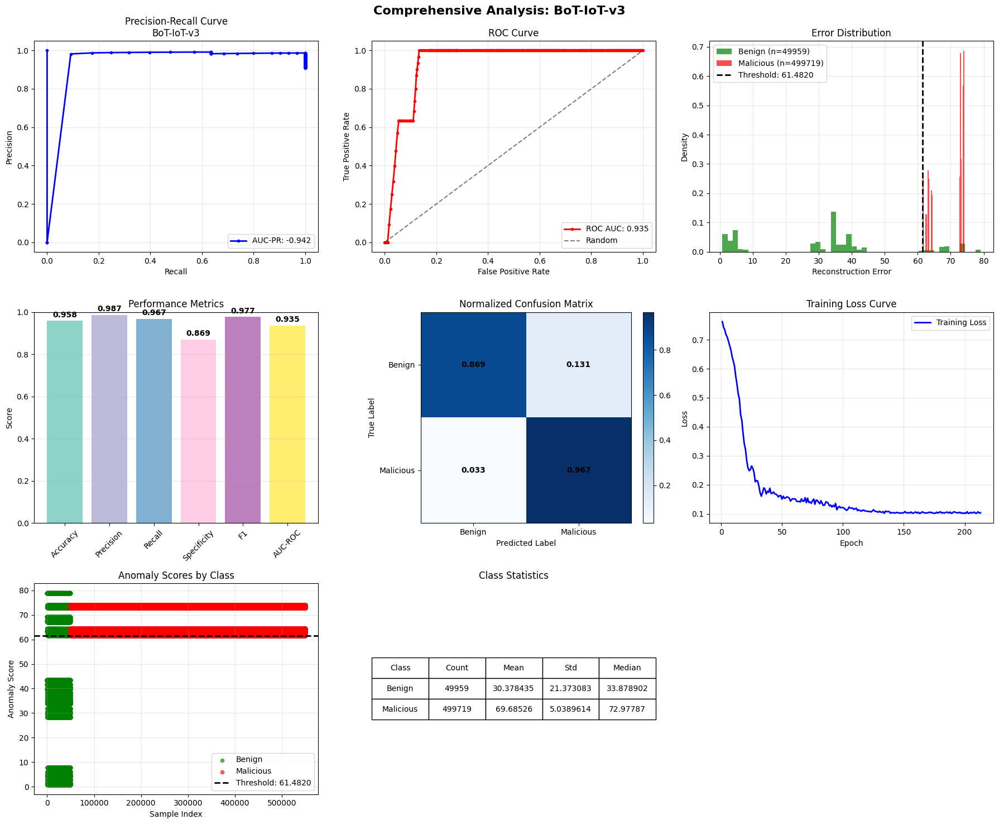

✅ Successfully completed BoT-IoT-v3

FINAL EXPERIMENT SUMMARY
CICIDS-2018-v3:
  F1-Score: 0.0000
  Runtime: 177.9s
  Cost: $0.0222
  Throughput: 2853 samples/sec
UNSW-NB15-v3:
  F1-Score: 0.8886
  Runtime: 11.5s
  Cost: $0.0014
  Throughput: 49781 samples/sec
ToN-IoT-v3:
  F1-Score: 0.3997
  Runtime: 55.0s
  Cost: $0.0069
  Throughput: 18911 samples/sec
BoT-IoT-v3:
  F1-Score: 0.9769
  Runtime: 5.5s
  Cost: $0.0007
  Throughput: 138586 samples/sec

Total Runtime: 4.17 minutes
Total Cost: $0.0312
Average Cost per Dataset: $0.0078


In [17]:
import time

# Cell 2: Main experiment loop with Runtime Metrics
reset_torch()
all_results = {}

# Initialize runtime tracker
runtime_tracker = RuntimeTracker(gpu_cost_per_hour=0.45)  # Kaggle Tesla T4 rate

USE_DYNAMIC_FEATURES = True  # Set to True to enable
DATASETS_TO_RUN = [
    "CICIDS-2018-v3",
    "UNSW-NB15-v3", 
    "ToN-IoT-v3",
    "BoT-IoT-v3"
]

for dataset_name in DATASETS_TO_RUN:
    print(f"\n{'='*80}")
    print(f"EXPERIMENT: {dataset_name}")
    print(f"{'='*80}")
    
    # Reset timers for each dataset
    runtime_tracker.reset_timers()
    
    config = DATASET_CONFIGS[dataset_name]
    try:
        # Step 1: Load raw data (all columns first)
        df = load_dataset_chunks(
            file_path=config["path"],
            max_rows=1000000,
            required_features=None
        )
        # Quick log transform test - add after loading df
        NUMERIC_COLS_TO_LOG = ['SRC_TO_DST_SECOND_BYTES', 'DST_TO_SRC_SECOND_BYTES', 'DST_TO_SRC_AVG_THROUGHPUT', 
                               'SRC_TO_DST_AVG_THROUGHPUT']
        
        for col in NUMERIC_COLS_TO_LOG:
            if col in df.columns:

                
                df[col] = df[col].clip(lower=1e-10)  # Avoid log(0)
                df[col] = np.log1p(df[col])  # log(1+x)
                print(f"Log-transformed {col}")

        # Step 2: Dynamic feature selection (optional)
        if USE_DYNAMIC_FEATURES:
            benign = df[df["Label"] == 0]
            train_split, _ = train_test_split(benign, test_size=0.15, random_state=42)

            excluded_cols = ['IPV4_SRC_ADDR', 'IPV4_DST_ADDR', 'Label', 'Attack']
            all_features = [col for col in df.columns if col not in excluded_cols]

            def top_variance_features(df, columns, top_k):
                return df[columns].var().sort_values(ascending=False).head(top_k).index.tolist()

            top_features = top_variance_features(train_split, all_features, top_k=7)
            node_feat_list = top_features[:4]
            edge_feat_list = top_features[4:7]

            print(f"🔹 Dynamic features for {dataset_name}:")
            print(f"   Node features: {node_feat_list}")
            print(f"   Edge features: {edge_feat_list}")

            config["node_features"] = node_feat_list
            config["edge_features"] = edge_feat_list
        
        # Step 3: Global preprocessing (run before filtering/imbalance fixes)
        df, scaler, label_encoders = preprocess_features(
            train_split, 
            df  # your function should handle split or return just train if not split yet
        )

        # Step 4: Dataset-specific filtering
        df = filter_dataset_for_efficiency(df, dataset_name)
        
        # Debug infinity values
        print(f" Checking for infinity values in {dataset_name}:")
        numeric_cols = df.select_dtypes(include=[np.number]).columns
        inf_found = False
        for col in numeric_cols:
            inf_count = np.isinf(df[col]).sum()
            if inf_count > 0:
                print(f"  {col}: {inf_count} infinity values")
                inf_found = True
        if not inf_found:
            print("  ✅ No infinity values found")
            
        # Step 5: IoT imbalance handling
        df = apply_iot_imbalance_handling(df, dataset_name, feature_cols=config["node_features"] + config["edge_features"])

        # Step 6: Create leakage-free split
        train_ips, test_ips, malicious_ips = create_leakage_free_split(df, test_size=0.15)
        
        # Step 7: Build training graph
        X_train, X_edges_train, edge_index_train, ip_to_idx, edge_to_flows = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"], 
            train_ips=train_ips,
            mode='train'
        )
        
        # *** RUNTIME METRICS: Training starts here (handled inside train_gnn_autoencoder) ***
        # Step 8: Train model
        model, training_losses, scalers = train_gnn_autoencoder(
            X_nodes=X_train,
            X_edges=X_edges_train,
            edge_index=edge_index_train,
            train_ips=train_ips,
            ip_to_idx=ip_to_idx,
            model_params=MODEL_PARAMS,
            gnn_type="GCN"
        )
        
        # Extract training timing from scalers
        train_timing = extract_runtime_from_scalers(scalers)
        
        # *** RUNTIME METRICS: Start inference timer ***
        start_infer = time.time()
        
        # Step 9: Evaluate on full graph
        X_full, X_edges_full, edge_index_full, ip_to_idx_full, _ = construct_leakage_free_graph(
            df=df,
            node_features=config["node_features"],
            edge_features=config["edge_features"],
            train_ips=None,
            mode='full'
        )
        
        # Get node errors from model
        model.eval()
        with torch.no_grad():
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
            X_full_scaled = scalers['node'].transform(X_full)
            X_full_tensor = torch.tensor(X_full_scaled, dtype=torch.float).to(device)
            edge_index_full = edge_index_full.to(device)
            
            x_hat, edge_hat, z = model(X_full_tensor, edge_index_full)
            node_errors = torch.mean((x_hat - X_full_tensor) ** 2, dim=1).cpu().numpy()
        
        # Step 10: Propagate to flow level
        flow_scores, flow_labels = propagate_node_scores_to_flows(
            df=df, 
            node_errors=node_errors, 
            ip_to_idx=ip_to_idx_full
        )
        
        # Step 11: Threshold selection and evaluation
        threshold = select_threshold(
            mode="f1",
            y_true=flow_labels,
            errors=flow_scores
        )
        
        y_pred = (flow_scores > threshold).astype(int)
        
        metrics = evaluate_model_comprehensive(
            y_true=flow_labels,
            y_pred=y_pred,
            y_scores=flow_scores,
            model_name=f"{dataset_name}-GCN"
        )
        
        # *** RUNTIME METRICS: End inference timer ***
        end_infer = time.time()
        
        # *** RUNTIME METRICS: Calculate comprehensive metrics ***
        if train_timing:
            # Count total samples processed
            total_samples = len(flow_scores) if 'flow_scores' in locals() else len(df)
            
            runtime_metrics = calculate_and_print_runtime_metrics(
                start_train=train_timing['start_train'],
                end_train=train_timing['end_train'],
                start_infer=start_infer,
                end_infer=end_infer,
                total_samples=total_samples,
                results={'threshold': threshold},
                model_name=f"{dataset_name}-GCN"
            )
            
            # Add runtime metrics to results
            metrics['runtime_metrics'] = runtime_metrics
        
        # Step 12: Create visualizations
        create_comprehensive_plots(
            flow_labels=flow_labels,
            flow_scores=flow_scores,
            threshold=threshold,
            metrics=metrics,
            name=dataset_name,
            training_losses=training_losses
        )
        
        all_results[dataset_name] = metrics
        print(f"✅ Successfully completed {dataset_name}")
        
    except Exception as e:
        print(f"❌ Error processing {dataset_name}: {str(e)}")
        import traceback
        traceback.print_exc()
        continue

# Print final summary at the end
print(f"\n{'='*80}")
print("FINAL EXPERIMENT SUMMARY")
print(f"{'='*80}")

total_cost = 0
total_time = 0

for dataset_name, results in all_results.items():
    if 'runtime_metrics' in results:
        runtime = results['runtime_metrics']
        total_cost += runtime['gpu_cost']
        total_time += runtime['train_duration'] + runtime['infer_duration']
        
        print(f"{dataset_name}:")
        print(f"  F1-Score: {results.get('f1', 'N/A'):.4f}")
        print(f"  Runtime: {runtime['train_duration'] + runtime['infer_duration']:.1f}s")
        print(f"  Cost: ${runtime['gpu_cost']:.4f}")
        print(f"  Throughput: {runtime.get('throughput', 0):.0f} samples/sec")

print(f"\nTotal Runtime: {total_time/60:.2f} minutes")
print(f"Total Cost: ${total_cost:.4f}")
print(f"Average Cost per Dataset: ${total_cost/len(all_results):.4f}" if all_results else "No results")

# EDA v2 datasets

 Loading and analyzing datasets...

 Analyzing CICIDS-2018...
    Loaded: 18,893,708 flows, 255,042 IPs, 12.0% attacks

 Analyzing UNSW-NB15...
    Loaded: 2,390,275 flows, 44 IPs, 4.0% attacks

 Analyzing ToN-IoT...
    Loaded: 16,940,496 flows, 29,245 IPs, 64.0% attacks

 Analyzing BoT-IoT...
    Loaded: 20,000,000 flows, 239 IPs, 99.6% attacks


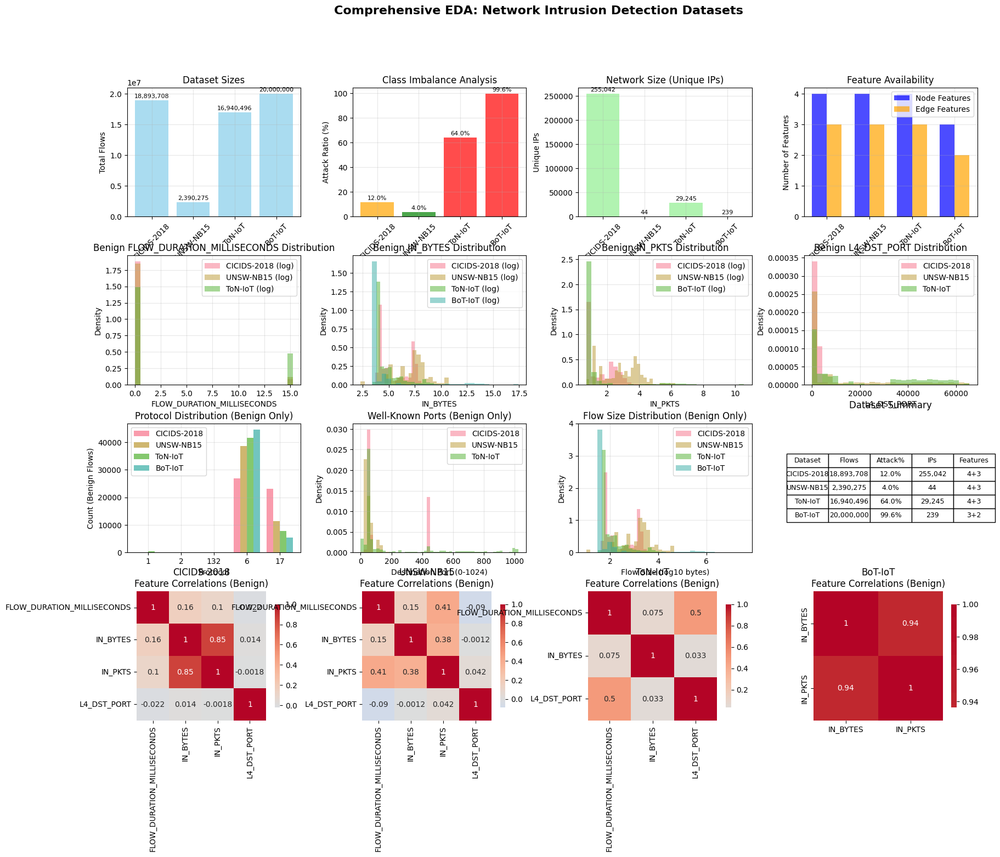


 KEY EDA INSIGHTS

 Dataset Characteristics:
   CICIDS-2018 : 18,893,708 flows, 255,042 IPs, Moderate imbalance (12.0%)
   UNSW-NB15   : 2,390,275 flows,     44 IPs, Low imbalance (4.0%)
   ToN-IoT     : 16,940,496 flows, 29,245 IPs, High imbalance (64.0%)
   BoT-IoT     : 20,000,000 flows,    239 IPs, Extreme imbalance (99.6%)

 Benign Training Data Availability:
   CICIDS-2018 : 16,635,567 benign flows (88.0%)
   UNSW-NB15   : 2,295,222 benign flows (96.0%)
   ToN-IoT     : 6,099,469 benign flows (36.0%)
   BoT-IoT     :   71,173 benign flows (0.4%)

 Feature Analysis:
   CICIDS-2018 : 7 total features (4 node + 3 edge)
   UNSW-NB15   : 7 total features (4 node + 3 edge)
   ToN-IoT     : 7 total features (4 node + 3 edge)
   BoT-IoT     : 5 total features (3 node + 2 edge)

  Key Challenges Identified:
    Extreme class imbalance: BoT-IoT
    Large scale datasets: CICIDS-2018, UNSW-NB15, ToN-IoT, BoT-IoT (may need sampling)
    Limited benign training data: ToN-IoT, BoT-IoT

 EDA Co

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')

def eda_pipeline():
    """Short EDA pipeline for network intrusion detection datasets with chunked reading"""
    
    datasets = [
        {
            "name": "CICIDS-2018",
            "path": "/kaggle/input/2018cic-v2/b3427ed8ad063a09_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018-v2.csv",
            "node_features": ['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO'],
            "edge_features": ['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']
        },
        {
            "name": "UNSW-NB15",
            "path": "/kaggle/input/unsw-v2/fe6cb615d161452c_MOHANAD_A4706/data/NF-UNSW-NB15-v2.csv",
            "node_features": ['L4_DST_PORT', 'PROTOCOL','L4_SRC_PORT', 'TCP_FLAGS'],
            "edge_features": ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']
        },
        {
            "name": "ToN-IoT",
            "path": "/kaggle/input/ton-v2/9bafce9d380588c2_MOHANAD_A4706/data/NF-ToN-IoT-v2.csv",
            "node_features": ['L4_DST_PORT', 'PROTOCOL','L4_SRC_PORT', 'TCP_FLAGS'],
            "edge_features": ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']
        },
        {
            "name": "BoT-IoT",
            "path": "/kaggle/input/bot-v2/befb58edf3428167_MOHANAD_A4706/data/NF-BoT-IoT-v2.csv",
            "node_features": ['PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'],
            "edge_features": ['IN_BYTES', 'IN_PKTS']
        }
    ]

    dataset_stats = []
    dataset_features = {}
    benign_data_samples = {}  # Store only sampled benign data for plots

    print(" Loading and analyzing datasets...")

    for ds in datasets:
        print(f"\n Analyzing {ds['name']}...")

        try:
            # === STREAMING: Read in chunks ===
            chunksize = 100_000
            total_flows = 0
            benign_flows = 0
            malicious_flows = 0
            src_ips = set()
            dst_ips = set()

            # Features to keep for analysis
            required_cols = ['Label', 'IPV4_SRC_ADDR', 'IPV4_DST_ADDR'] + \
                           ds['node_features'] + ds['edge_features']

            # Initialize empty list for benign sample collection
            benign_chunks = []

            # Use random seed for reproducible sampling across chunks
            rng = np.random.default_rng(seed=42)

            for chunk in pd.read_csv(ds["path"], usecols=lambda x: x in required_cols, chunksize=chunksize):
                # Update counts
                total_flows += len(chunk)
                label_counts = chunk['Label'].value_counts()
                benign_flows += label_counts.get(0, 0)
                malicious_flows += label_counts.get(1, 0)

                # Collect unique IPs
                src_ips.update(chunk['IPV4_SRC_ADDR'].dropna().unique())
                dst_ips.update(chunk['IPV4_DST_ADDR'].dropna().unique())

                # Sample benign flows (if any) for later analysis
                if 0 in label_counts and label_counts[0] > 0:
                    benign_chunk = chunk[chunk['Label'] == 0]
                    # Randomly sample up to 10% of benign chunk (max 10k per chunk to cap memory)
                    n_sample = min(len(benign_chunk), 10_000)
                    if n_sample > 0:
                        sampled = benign_chunk.sample(n=n_sample, random_state=None)  # Let RNG handle it
                        benign_chunks.append(sampled)

                # Early stop if total gets too large
                if total_flows >= 20_000_000:
                    break  # Avoid excessive reading

            # Combine all benign samples and downsample further
            if benign_chunks:
                benign_df = pd.concat(benign_chunks, ignore_index=True)
                if len(benign_df) > 50_000:
                    benign_df = benign_df.sample(n=50_000, random_state=42)
                benign_data_samples[ds['name']] = benign_df
            else:
                print(f"    No benign flows found in {ds['name']}")
                benign_data_samples[ds['name']] = pd.DataFrame()

            # Compute attack ratio
            attack_ratio = (malicious_flows / total_flows * 100) if total_flows > 0 else 0
            unique_ips = len(src_ips | dst_ips)

            # Check available features
            available_node_features = [f for f in ds['node_features'] if f in benign_df.columns]
            available_edge_features = [f for f in ds['edge_features'] if f in benign_df.columns]

            dataset_stats.append({
                'Dataset': ds['name'],
                'Total_Flows': total_flows,
                'Benign_Flows': benign_flows,
                'Malicious_Flows': malicious_flows,
                'Attack_Ratio_%': attack_ratio,
                'Unique_IPs': unique_ips,
                'Node_Features': len(available_node_features),
                'Edge_Features': len(available_edge_features)
            })

            dataset_features[ds['name']] = {
                'node_features': available_node_features,
                'edge_features': available_edge_features,
                'all_features': available_node_features + available_edge_features
            }

            print(f"    Loaded: {total_flows:,} flows, {unique_ips:,} IPs, {attack_ratio:.1f}% attacks")

        except Exception as e:
            print(f"    Error loading {ds['name']}: {str(e)}")
            continue

    # Create EDA visualizations
    create_eda_visualizations(dataset_stats, benign_data_samples, dataset_features)

    return dataset_stats, benign_data_samples, dataset_features

def create_eda_visualizations(dataset_stats, benign_data, dataset_features):
    """Create comprehensive EDA visualizations"""
    
    # Convert stats to DataFrame
    stats_df = pd.DataFrame(dataset_stats)
    
    # Create figure with subplots
    fig = plt.figure(figsize=(20, 15))
    gs = fig.add_gridspec(4, 4, hspace=0.3, wspace=0.3)
    
    # 1. Dataset Overview
    ax1 = fig.add_subplot(gs[0, 0])
    x_pos = range(len(stats_df))
    ax1.bar(x_pos, stats_df['Total_Flows'], alpha=0.7, color='skyblue')
    ax1.set_xlabel('Dataset')
    ax1.set_ylabel('Total Flows')
    ax1.set_title('Dataset Sizes')
    ax1.set_xticks(x_pos)
    ax1.set_xticklabels(stats_df['Dataset'], rotation=45)
    ax1.grid(True, alpha=0.3)
    
    # Add value labels
    for i, v in enumerate(stats_df['Total_Flows']):
        ax1.text(i, v + max(stats_df['Total_Flows']) * 0.01, f'{v:,}', 
                ha='center', va='bottom', fontsize=8)
    
    # 2. Class Distribution
    ax2 = fig.add_subplot(gs[0, 1])
    attack_ratios = stats_df['Attack_Ratio_%']
    colors = ['red' if ratio > 50 else 'orange' if ratio > 10 else 'green' for ratio in attack_ratios]
    
    bars = ax2.bar(x_pos, attack_ratios, alpha=0.7, color=colors)
    ax2.set_xlabel('Dataset')
    ax2.set_ylabel('Attack Ratio (%)')
    ax2.set_title('Class Imbalance Analysis')
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels(stats_df['Dataset'], rotation=45)
    ax2.grid(True, alpha=0.3)
    
    for i, v in enumerate(attack_ratios):
        ax2.text(i, v + max(attack_ratios) * 0.01, f'{v:.1f}%', 
                ha='center', va='bottom', fontsize=8)
    
    # 3. IP Connectivity
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.bar(x_pos, stats_df['Unique_IPs'], alpha=0.7, color='lightgreen')
    ax3.set_xlabel('Dataset')
    ax3.set_ylabel('Unique IPs')
    ax3.set_title('Network Size (Unique IPs)')
    ax3.set_xticks(x_pos)
    ax3.set_xticklabels(stats_df['Dataset'], rotation=45)
    ax3.grid(True, alpha=0.3)
    
    for i, v in enumerate(stats_df['Unique_IPs']):
        ax3.text(i, v + max(stats_df['Unique_IPs']) * 0.01, f'{v:,}', 
                ha='center', va='bottom', fontsize=8)
    
    # 4. Feature Availability
    ax4 = fig.add_subplot(gs[0, 3])
    node_feat_counts = stats_df['Node_Features']
    edge_feat_counts = stats_df['Edge_Features']
    
    width = 0.35
    ax4.bar([i - width/2 for i in x_pos], node_feat_counts, width, 
           label='Node Features', alpha=0.7, color='blue')
    ax4.bar([i + width/2 for i in x_pos], edge_feat_counts, width, 
           label='Edge Features', alpha=0.7, color='orange')
    
    ax4.set_xlabel('Dataset')
    ax4.set_ylabel('Number of Features')
    ax4.set_title('Feature Availability')
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(stats_df['Dataset'], rotation=45)
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # 5-8. Feature Distributions (Benign Data Only)
    common_features = ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS', 'L4_DST_PORT']
    
    for idx, feature in enumerate(common_features):
        ax = fig.add_subplot(gs[1, idx])
        
        for dataset_name, df in benign_data.items():
            if feature in df.columns:
                # Clean and sample data
                data = df[feature].replace([np.inf, -np.inf], np.nan).dropna()
                if len(data) > 10000:
                    data = data.sample(n=10000, random_state=42)
                
                # Log transform for better visualization
                if feature in ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']:
                    data = np.log1p(data)
                    label = f'{dataset_name} (log)'
                else:
                    label = dataset_name
                
                ax.hist(data, bins=30, alpha=0.5, label=label, density=True)
        
        ax.set_xlabel(f'{feature}')
        ax.set_ylabel('Density')
        ax.set_title(f'Benign {feature} Distribution')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    # 9. Protocol Distribution Comparison
    ax9 = fig.add_subplot(gs[2, 0])
    protocol_data = {}
    
    for dataset_name, df in benign_data.items():
        if 'PROTOCOL' in df.columns:
            protocol_counts = df['PROTOCOL'].value_counts().head(5)
            protocol_data[dataset_name] = protocol_counts
    
    if protocol_data:
        # Get common protocols
        all_protocols = set()
        for counts in protocol_data.values():
            all_protocols.update(counts.index)
        
        common_protocols = list(all_protocols)[:5]  # Top 5
        
        x_positions = np.arange(len(common_protocols))
        width = 0.2
        
        for i, (dataset_name, counts) in enumerate(protocol_data.items()):
            values = [counts.get(proto, 0) for proto in common_protocols]
            ax9.bar(x_positions + i * width, values, width, 
                   label=dataset_name, alpha=0.7)
        
        ax9.set_xlabel('Protocol')
        ax9.set_ylabel('Count (Benign Flows)')
        ax9.set_title('Protocol Distribution (Benign Only)')
        ax9.set_xticks(x_positions + width * 1.5)
        ax9.set_xticklabels(common_protocols)
        ax9.legend()
        ax9.grid(True, alpha=0.3)
    
    # 10. Port Distribution
    ax10 = fig.add_subplot(gs[2, 1])
    
    for dataset_name, df in benign_data.items():
        if 'L4_DST_PORT' in df.columns:
            # Focus on well-known ports (0-1024)
            port_data = df['L4_DST_PORT']
            well_known_ports = port_data[port_data <= 1024]
            
            if len(well_known_ports) > 0:
                ax10.hist(well_known_ports, bins=50, alpha=0.5, 
                         label=f'{dataset_name}', density=True)
    
    ax10.set_xlabel('Destination Port (0-1024)')
    ax10.set_ylabel('Density')
    ax10.set_title('Well-Known Ports (Benign Only)')
    ax10.legend()
    ax10.grid(True, alpha=0.3)
    
    # 11. Flow Size Analysis
    ax11 = fig.add_subplot(gs[2, 2])
    
    for dataset_name, df in benign_data.items():
        if 'IN_BYTES' in df.columns:
            # Sample and clean data
            byte_data = df['IN_BYTES'].replace([np.inf, -np.inf], np.nan).dropna()
            if len(byte_data) > 10000:
                byte_data = byte_data.sample(n=10000, random_state=42)
            
            # Focus on reasonable range
            byte_data = byte_data[byte_data > 0]
            if len(byte_data) > 0:
                ax11.hist(np.log10(byte_data + 1), bins=30, alpha=0.5, 
                         label=f'{dataset_name}', density=True)
    
    ax11.set_xlabel('Flow Size (log10 bytes)')
    ax11.set_ylabel('Density')
    ax11.set_title('Flow Size Distribution (Benign Only)')
    ax11.legend()
    ax11.grid(True, alpha=0.3)
    
    # 12. Summary Statistics Table
    ax12 = fig.add_subplot(gs[2, 3])
    ax12.axis('tight')
    ax12.axis('off')
    
    # Create summary table
    summary_data = []
    for _, row in stats_df.iterrows():
        summary_data.append([
            row['Dataset'],
            f"{row['Total_Flows']:,}",
            f"{row['Attack_Ratio_%']:.1f}%",
            f"{row['Unique_IPs']:,}",
            f"{row['Node_Features']}+{row['Edge_Features']}"
        ])
    
    table = ax12.table(cellText=summary_data,
                      colLabels=['Dataset', 'Flows', 'Attack%', 'IPs', 'Features'],
                      cellLoc='center',
                      loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1.2, 1.5)
    ax12.set_title('Dataset Summary', pad=20)
    
    # 13-16. Feature Correlation Analysis
    correlation_features = ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS', 'L4_DST_PORT']
    
    for idx, dataset_name in enumerate(list(benign_data.keys())[:4]):
        if idx >= 4:
            break
            
        ax = fig.add_subplot(gs[3, idx])
        df = benign_data[dataset_name]
        
        # Get available features
        available_features = [f for f in correlation_features if f in df.columns]
        
        if len(available_features) >= 2:
            # Sample data for correlation
            sample_df = df[available_features].replace([np.inf, -np.inf], np.nan).dropna()
            if len(sample_df) > 10000:
                sample_df = sample_df.sample(n=10000, random_state=42)
            
            # Calculate correlation
            corr_matrix = sample_df.corr()
            
            # Plot heatmap
            sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
                       square=True, ax=ax, cbar_kws={'shrink': 0.8})
            ax.set_title(f'{dataset_name}\nFeature Correlations (Benign)')
        else:
            ax.text(0.5, 0.5, f'{dataset_name}\nInsufficient\nFeatures', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'{dataset_name} - No Correlation Data')
    
    # Overall title
    fig.suptitle('Comprehensive EDA: Network Intrusion Detection Datasets', 
                fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary insights
    print_eda_insights(stats_df, benign_data)

def print_eda_insights(stats_df, benign_data):
    """Print key insights from EDA"""
    
    print(f"\n{'='*60}")
    print(" KEY EDA INSIGHTS")
    print(f"{'='*60}")
    
    # Dataset characteristics
    print("\n Dataset Characteristics:")
    for _, row in stats_df.iterrows():
        imbalance_level = "Extreme" if row['Attack_Ratio_%'] > 80 else "High" if row['Attack_Ratio_%'] > 50 else "Moderate" if row['Attack_Ratio_%'] > 10 else "Low"
        print(f"   {row['Dataset']:<12}: {row['Total_Flows']:>8,} flows, {row['Unique_IPs']:>6,} IPs, {imbalance_level} imbalance ({row['Attack_Ratio_%']:.1f}%)")
    
    # Training data availability
    print(f"\n Benign Training Data Availability:")
    for _, row in stats_df.iterrows():
        benign_ratio = (row['Total_Flows'] - row['Malicious_Flows']) / row['Total_Flows'] * 100
        print(f"   {row['Dataset']:<12}: {row['Total_Flows'] - row['Malicious_Flows']:>8,} benign flows ({benign_ratio:.1f}%)")
    
    # Feature analysis
    print(f"\n Feature Analysis:")
    for _, row in stats_df.iterrows():
        total_features = row['Node_Features'] + row['Edge_Features']
        print(f"   {row['Dataset']:<12}: {total_features} total features ({row['Node_Features']} node + {row['Edge_Features']} edge)")
    
    # Challenges identified
    print(f"\n  Key Challenges Identified:")
    
    # Class imbalance
    extreme_imbalance = stats_df[stats_df['Attack_Ratio_%'] > 80]['Dataset'].tolist()
    if extreme_imbalance:
        print(f"    Extreme class imbalance: {', '.join(extreme_imbalance)}")
    
    # Large datasets
    large_datasets = stats_df[stats_df['Total_Flows'] > 1000000]['Dataset'].tolist()
    if large_datasets:
        print(f"    Large scale datasets: {', '.join(large_datasets)} (may need sampling)")
    
    # Limited benign data
    limited_benign = stats_df[stats_df['Attack_Ratio_%'] > 50]['Dataset'].tolist()
    if limited_benign:
        print(f"    Limited benign training data: {', '.join(limited_benign)}")
    
    print(f"\n EDA Complete! Use these insights for model design and evaluation.")

# Run the EDA pipeline
if __name__ == "__main__":
    dataset_stats, benign_data, dataset_features = eda_pipeline()

# EDA v1 datasets

 Loading and analyzing datasets...

 Analyzing CICIDS-2018...
   Sampled to 500,000 rows
    Loaded: 500,000 flows, 24,504 IPs, 12.2% attacks

 Analyzing UNSW-NB15...
   Sampled to 500,000 rows
    Loaded: 500,000 flows, 43 IPs, 4.5% attacks

 Analyzing ToN-IoT...
   Sampled to 500,000 rows
    Loaded: 500,000 flows, 1,103 IPs, 80.4% attacks

 Analyzing BoT-IoT...
   Sampled to 500,000 rows
    Loaded: 500,000 flows, 125 IPs, 97.7% attacks


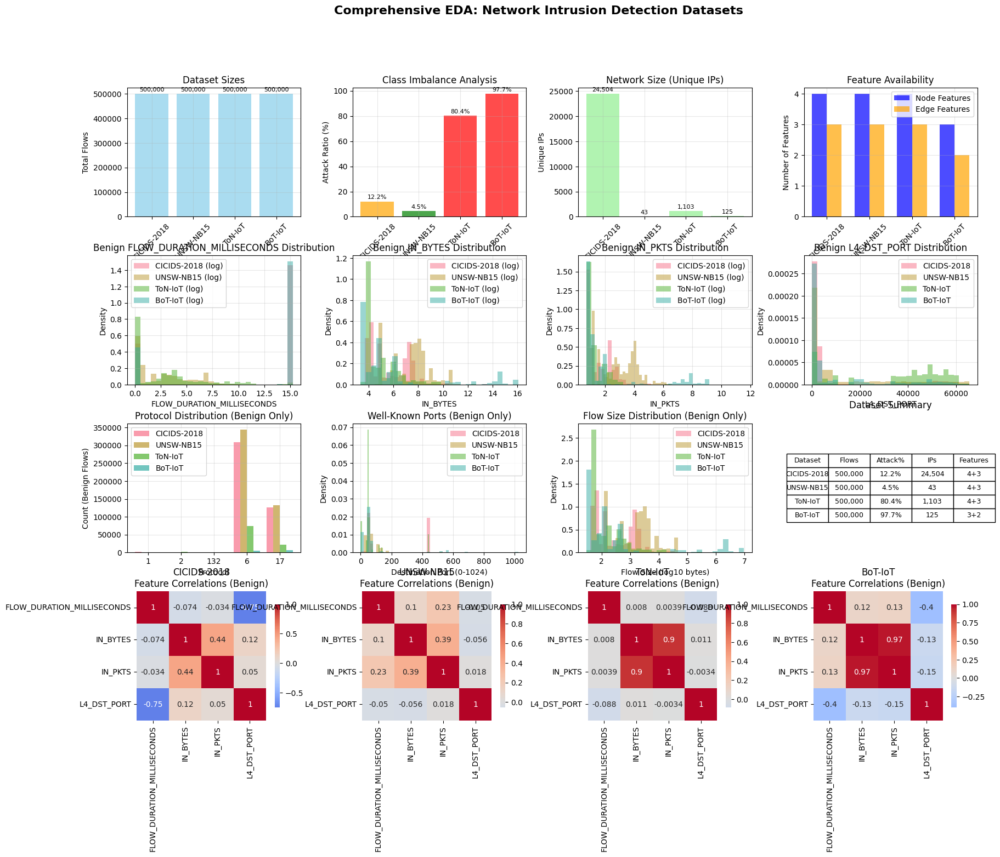


 KEY EDA INSIGHTS

 Dataset Characteristics:
   CICIDS-2018 :  500,000 flows, 24,504 IPs, Moderate imbalance (12.2%)
   UNSW-NB15   :  500,000 flows,     43 IPs, Low imbalance (4.5%)
   ToN-IoT     :  500,000 flows,  1,103 IPs, Extreme imbalance (80.4%)
   BoT-IoT     :  500,000 flows,    125 IPs, Extreme imbalance (97.7%)

 Benign Training Data Availability:
   CICIDS-2018 :  439,095 benign flows (87.8%)
   UNSW-NB15   :  477,553 benign flows (95.5%)
   ToN-IoT     :   97,819 benign flows (19.6%)
   BoT-IoT     :   11,435 benign flows (2.3%)

 Feature Analysis:
   CICIDS-2018 : 7 total features (4 node + 3 edge)
   UNSW-NB15   : 7 total features (4 node + 3 edge)
   ToN-IoT     : 7 total features (4 node + 3 edge)
   BoT-IoT     : 5 total features (3 node + 2 edge)

  Key Challenges Identified:
    Extreme class imbalance: ToN-IoT, BoT-IoT
    Limited benign training data: ToN-IoT, BoT-IoT

 EDA Complete! Use these insights for model design and evaluation.


In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')

# Set style
plt.style.use('default')
sns.set_palette("husl")

def eda_pipeline():
    """Short EDA pipeline for network intrusion detection datasets"""
    
    # Dataset configurations
    datasets = [
        {
            "name": "CICIDS-2018",
            "path": "/kaggle/input/2018-v1-cicids/88a47ba2ab64258e_MOHANAD_A4706/data/NF-CSE-CIC-IDS2018.csv",
            "node_features": ['L4_DST_PORT', 'PROTOCOL', 'FLOW_DURATION_MILLISECONDS', 'L7_PROTO'],
            "edge_features": ['IN_BYTES', 'IN_PKTS', 'OUT_BYTES']
        },
        {
            "name": "UNSW-NB15",
            "path": "/kaggle/input/nf-unsw-nb15-netflowversion1/88695f0f620eb568_MOHANAD_A4706/data/NF-UNSW-NB15.csv",
            "node_features": ['L4_DST_PORT', 'PROTOCOL','L4_SRC_PORT', 'TCP_FLAGS'],
            "edge_features": ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']
        },
        {
            "name": "ToN-IoT",
            "path": "/kaggle/input/nf-ton-iot/7ca78ae35fa4961a_MOHANAD_A4706/data/NF-ToN-IoT.csv",
            "node_features": ['L4_DST_PORT', 'PROTOCOL','L4_SRC_PORT', 'TCP_FLAGS'],
            "edge_features": ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'OUT_BYTES']
        },
        {
            "name": "BoT-IoT",
            "path": "/kaggle/input/nf-bot-iot-kaggle1/de2c6f75dd50d933_MOHANAD_A4706/data/NF-BoT-IoT.csv",
            "node_features": ['PROTOCOL', 'L4_SRC_PORT', 'TCP_FLAGS'],
            "edge_features": ['IN_BYTES', 'IN_PKTS']
        }
    ]
    
    # Load and analyze datasets
    dataset_stats = []
    dataset_features = {}
    benign_data = {}
    
    print(" Loading and analyzing datasets...")
    
    for ds in datasets:
        print(f"\n Analyzing {ds['name']}...")
        
        try:
            # Load dataset (sample if too large)
            df = pd.read_csv(ds["path"])
            if len(df) > 500000:
                df = df.sample(n=500000, random_state=42)
                print(f"   Sampled to {len(df):,} rows")
            
            # Basic statistics
            n_total = len(df)
            n_benign = len(df[df['Label'] == 0])
            n_malicious = len(df[df['Label'] == 1])
            attack_ratio = n_malicious / n_total * 100
            
            # IP statistics
            src_ips = set(df['IPV4_SRC_ADDR'].unique())
            dst_ips = set(df['IPV4_DST_ADDR'].unique())
            unique_ips = src_ips | dst_ips
            
            # Feature availability
            available_node_features = [f for f in ds['node_features'] if f in df.columns]
            available_edge_features = [f for f in ds['edge_features'] if f in df.columns]
            
            dataset_stats.append({
                'Dataset': ds['name'],
                'Total_Flows': n_total,
                'Benign_Flows': n_benign,
                'Malicious_Flows': n_malicious,
                'Attack_Ratio_%': attack_ratio,
                'Unique_IPs': len(unique_ips),
                'Node_Features': len(available_node_features),
                'Edge_Features': len(available_edge_features)
            })
            
            # Store benign data for feature analysis
            benign_data[ds['name']] = df[df['Label'] == 0].copy()
            dataset_features[ds['name']] = {
                'node_features': available_node_features,
                'edge_features': available_edge_features,
                'all_features': available_node_features + available_edge_features
            }
            
            print(f"    Loaded: {n_total:,} flows, {len(unique_ips):,} IPs, {attack_ratio:.1f}% attacks")
            
        except Exception as e:
            print(f"    Error loading {ds['name']}: {str(e)}")
            continue
    
    # Create comprehensive EDA visualizations
    create_eda_visualizations(dataset_stats, benign_data, dataset_features)
    
    return dataset_stats, benign_data, dataset_features

def create_eda_visualizations(dataset_stats, benign_data, dataset_features):
    """Create comprehensive EDA visualizations"""
    
    # Convert stats to DataFrame
    stats_df = pd.DataFrame(dataset_stats)
    
    # Create figure with subplots
    fig = plt.figure(figsize=(20, 15))
    gs = fig.add_gridspec(4, 4, hspace=0.3, wspace=0.3)
    
    # 1. Dataset Overview
    ax1 = fig.add_subplot(gs[0, 0])
    x_pos = range(len(stats_df))
    ax1.bar(x_pos, stats_df['Total_Flows'], alpha=0.7, color='skyblue')
    ax1.set_xlabel('Dataset')
    ax1.set_ylabel('Total Flows')
    ax1.set_title('Dataset Sizes')
    ax1.set_xticks(x_pos)
    ax1.set_xticklabels(stats_df['Dataset'], rotation=45)
    ax1.grid(True, alpha=0.3)
    
    # Add value labels
    for i, v in enumerate(stats_df['Total_Flows']):
        ax1.text(i, v + max(stats_df['Total_Flows']) * 0.01, f'{v:,}', 
                ha='center', va='bottom', fontsize=8)
    
    # 2. Class Distribution
    ax2 = fig.add_subplot(gs[0, 1])
    attack_ratios = stats_df['Attack_Ratio_%']
    colors = ['red' if ratio > 50 else 'orange' if ratio > 10 else 'green' for ratio in attack_ratios]
    
    bars = ax2.bar(x_pos, attack_ratios, alpha=0.7, color=colors)
    ax2.set_xlabel('Dataset')
    ax2.set_ylabel('Attack Ratio (%)')
    ax2.set_title('Class Imbalance Analysis')
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels(stats_df['Dataset'], rotation=45)
    ax2.grid(True, alpha=0.3)
    
    for i, v in enumerate(attack_ratios):
        ax2.text(i, v + max(attack_ratios) * 0.01, f'{v:.1f}%', 
                ha='center', va='bottom', fontsize=8)
    
    # 3. IP Connectivity
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.bar(x_pos, stats_df['Unique_IPs'], alpha=0.7, color='lightgreen')
    ax3.set_xlabel('Dataset')
    ax3.set_ylabel('Unique IPs')
    ax3.set_title('Network Size (Unique IPs)')
    ax3.set_xticks(x_pos)
    ax3.set_xticklabels(stats_df['Dataset'], rotation=45)
    ax3.grid(True, alpha=0.3)
    
    for i, v in enumerate(stats_df['Unique_IPs']):
        ax3.text(i, v + max(stats_df['Unique_IPs']) * 0.01, f'{v:,}', 
                ha='center', va='bottom', fontsize=8)
    
    # 4. Feature Availability
    ax4 = fig.add_subplot(gs[0, 3])
    node_feat_counts = stats_df['Node_Features']
    edge_feat_counts = stats_df['Edge_Features']
    
    width = 0.35
    ax4.bar([i - width/2 for i in x_pos], node_feat_counts, width, 
           label='Node Features', alpha=0.7, color='blue')
    ax4.bar([i + width/2 for i in x_pos], edge_feat_counts, width, 
           label='Edge Features', alpha=0.7, color='orange')
    
    ax4.set_xlabel('Dataset')
    ax4.set_ylabel('Number of Features')
    ax4.set_title('Feature Availability')
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(stats_df['Dataset'], rotation=45)
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # 5-8. Feature Distributions (Benign Data Only)
    common_features = ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS', 'L4_DST_PORT']
    
    for idx, feature in enumerate(common_features):
        ax = fig.add_subplot(gs[1, idx])
        
        for dataset_name, df in benign_data.items():
            if feature in df.columns:
                # Clean and sample data
                data = df[feature].replace([np.inf, -np.inf], np.nan).dropna()
                if len(data) > 10000:
                    data = data.sample(n=10000, random_state=42)
                
                # Log transform for better visualization
                if feature in ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS']:
                    data = np.log1p(data)
                    label = f'{dataset_name} (log)'
                else:
                    label = dataset_name
                
                ax.hist(data, bins=30, alpha=0.5, label=label, density=True)
        
        ax.set_xlabel(f'{feature}')
        ax.set_ylabel('Density')
        ax.set_title(f'Benign {feature} Distribution')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    # 9. Protocol Distribution Comparison
    ax9 = fig.add_subplot(gs[2, 0])
    protocol_data = {}
    
    for dataset_name, df in benign_data.items():
        if 'PROTOCOL' in df.columns:
            protocol_counts = df['PROTOCOL'].value_counts().head(5)
            protocol_data[dataset_name] = protocol_counts
    
    if protocol_data:
        # Get common protocols
        all_protocols = set()
        for counts in protocol_data.values():
            all_protocols.update(counts.index)
        
        common_protocols = list(all_protocols)[:5]  # Top 5
        
        x_positions = np.arange(len(common_protocols))
        width = 0.2
        
        for i, (dataset_name, counts) in enumerate(protocol_data.items()):
            values = [counts.get(proto, 0) for proto in common_protocols]
            ax9.bar(x_positions + i * width, values, width, 
                   label=dataset_name, alpha=0.7)
        
        ax9.set_xlabel('Protocol')
        ax9.set_ylabel('Count (Benign Flows)')
        ax9.set_title('Protocol Distribution (Benign Only)')
        ax9.set_xticks(x_positions + width * 1.5)
        ax9.set_xticklabels(common_protocols)
        ax9.legend()
        ax9.grid(True, alpha=0.3)
    
    # 10. Port Distribution
    ax10 = fig.add_subplot(gs[2, 1])
    
    for dataset_name, df in benign_data.items():
        if 'L4_DST_PORT' in df.columns:
            # Focus on well-known ports (0-1024)
            port_data = df['L4_DST_PORT']
            well_known_ports = port_data[port_data <= 1024]
            
            if len(well_known_ports) > 0:
                ax10.hist(well_known_ports, bins=50, alpha=0.5, 
                         label=f'{dataset_name}', density=True)
    
    ax10.set_xlabel('Destination Port (0-1024)')
    ax10.set_ylabel('Density')
    ax10.set_title('Well-Known Ports (Benign Only)')
    ax10.legend()
    ax10.grid(True, alpha=0.3)
    
    # 11. Flow Size Analysis
    ax11 = fig.add_subplot(gs[2, 2])
    
    for dataset_name, df in benign_data.items():
        if 'IN_BYTES' in df.columns:
            # Sample and clean data
            byte_data = df['IN_BYTES'].replace([np.inf, -np.inf], np.nan).dropna()
            if len(byte_data) > 10000:
                byte_data = byte_data.sample(n=10000, random_state=42)
            
            # Focus on reasonable range
            byte_data = byte_data[byte_data > 0]
            if len(byte_data) > 0:
                ax11.hist(np.log10(byte_data + 1), bins=30, alpha=0.5, 
                         label=f'{dataset_name}', density=True)
    
    ax11.set_xlabel('Flow Size (log10 bytes)')
    ax11.set_ylabel('Density')
    ax11.set_title('Flow Size Distribution (Benign Only)')
    ax11.legend()
    ax11.grid(True, alpha=0.3)
    
    # 12. Summary Statistics Table
    ax12 = fig.add_subplot(gs[2, 3])
    ax12.axis('tight')
    ax12.axis('off')
    
    # Create summary table
    summary_data = []
    for _, row in stats_df.iterrows():
        summary_data.append([
            row['Dataset'],
            f"{row['Total_Flows']:,}",
            f"{row['Attack_Ratio_%']:.1f}%",
            f"{row['Unique_IPs']:,}",
            f"{row['Node_Features']}+{row['Edge_Features']}"
        ])
    
    table = ax12.table(cellText=summary_data,
                      colLabels=['Dataset', 'Flows', 'Attack%', 'IPs', 'Features'],
                      cellLoc='center',
                      loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1.2, 1.5)
    ax12.set_title('Dataset Summary', pad=20)
    
    # 13-16. Feature Correlation Analysis
    correlation_features = ['FLOW_DURATION_MILLISECONDS', 'IN_BYTES', 'IN_PKTS', 'L4_DST_PORT']
    
    for idx, dataset_name in enumerate(list(benign_data.keys())[:4]):
        if idx >= 4:
            break
            
        ax = fig.add_subplot(gs[3, idx])
        df = benign_data[dataset_name]
        
        # Get available features
        available_features = [f for f in correlation_features if f in df.columns]
        
        if len(available_features) >= 2:
            # Sample data for correlation
            sample_df = df[available_features].replace([np.inf, -np.inf], np.nan).dropna()
            if len(sample_df) > 10000:
                sample_df = sample_df.sample(n=10000, random_state=42)
            
            # Calculate correlation
            corr_matrix = sample_df.corr()
            
            # Plot heatmap
            sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
                       square=True, ax=ax, cbar_kws={'shrink': 0.8})
            ax.set_title(f'{dataset_name}\nFeature Correlations (Benign)')
        else:
            ax.text(0.5, 0.5, f'{dataset_name}\nInsufficient\nFeatures', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f'{dataset_name} - No Correlation Data')
    
    # Overall title
    fig.suptitle('Comprehensive EDA: Network Intrusion Detection Datasets', 
                fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    # Print summary insights
    print_eda_insights(stats_df, benign_data)

def print_eda_insights(stats_df, benign_data):
    """Print key insights from EDA"""
    
    print(f"\n{'='*60}")
    print(" KEY EDA INSIGHTS")
    print(f"{'='*60}")
    
    # Dataset characteristics
    print("\n Dataset Characteristics:")
    for _, row in stats_df.iterrows():
        imbalance_level = "Extreme" if row['Attack_Ratio_%'] > 80 else "High" if row['Attack_Ratio_%'] > 50 else "Moderate" if row['Attack_Ratio_%'] > 10 else "Low"
        print(f"   {row['Dataset']:<12}: {row['Total_Flows']:>8,} flows, {row['Unique_IPs']:>6,} IPs, {imbalance_level} imbalance ({row['Attack_Ratio_%']:.1f}%)")
    
    # Training data availability
    print(f"\n Benign Training Data Availability:")
    for _, row in stats_df.iterrows():
        benign_ratio = (row['Total_Flows'] - row['Malicious_Flows']) / row['Total_Flows'] * 100
        print(f"   {row['Dataset']:<12}: {row['Total_Flows'] - row['Malicious_Flows']:>8,} benign flows ({benign_ratio:.1f}%)")
    
    # Feature analysis
    print(f"\n Feature Analysis:")
    for _, row in stats_df.iterrows():
        total_features = row['Node_Features'] + row['Edge_Features']
        print(f"   {row['Dataset']:<12}: {total_features} total features ({row['Node_Features']} node + {row['Edge_Features']} edge)")
    
    # Challenges identified
    print(f"\n  Key Challenges Identified:")
    
    # Class imbalance
    extreme_imbalance = stats_df[stats_df['Attack_Ratio_%'] > 80]['Dataset'].tolist()
    if extreme_imbalance:
        print(f"    Extreme class imbalance: {', '.join(extreme_imbalance)}")
    
    # Large datasets
    large_datasets = stats_df[stats_df['Total_Flows'] > 1000000]['Dataset'].tolist()
    if large_datasets:
        print(f"    Large scale datasets: {', '.join(large_datasets)} (may need sampling)")
    
    # Limited benign data
    limited_benign = stats_df[stats_df['Attack_Ratio_%'] > 50]['Dataset'].tolist()
    if limited_benign:
        print(f"    Limited benign training data: {', '.join(limited_benign)}")
    
    print(f"\n EDA Complete! Use these insights for model design and evaluation.")

# Run the EDA pipeline
if __name__ == "__main__":
    dataset_stats, benign_data, dataset_features = eda_pipeline()

In [22]:
# Generate requirements.txt from current environment
!pip freeze > requirements.txt
